# Transcription Factor Project - QC
**Robin Anwyl, UCSD Subramaniam Lab**

**Goal:** Analyze the hiPSC Perturb-seq dataset from the Mali lab (Nourreddine et al preprint) to investigate the effects of transcription factor knockouts (TF KOs)

**Guiding Questions:**
*  What TF KOs are present in the dataset? 
*  When performing clustering with the dataset - can we associate a unique set of TFs with a cluster? Is there any functional significance to these clusters?
*  What gene targets are associated with these TFs?
*  Which TFs are involved in co-regulation, and which genes are co-regulated? Which TFs are regulated by other TFs?
*  How do TFs influence chromatin remodeling? Which sets of writers and erasers are regulated by these TFs?

***

# Import statements

In [1]:
import muon as mu
import anndata as ad
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import scipy as sp
#import re
#import requests
import gc
#from plotnine import ggplot, aes, geom_bar, ggtitle, xlab, ylab, scale_fill_manual, geom_histogram, labs, theme, element_text, scale_y_continuous
#from sklearn.ensemble import IsolationForest
#from sklearn.svm import OneClassSVM
from tqdm.auto import tqdm
from statsmodels.stats.multitest import multipletests
from scipy.stats import mannwhitneyu
from scipy.stats import ks_2samp
from scipy.stats import gamma
from scipy.stats import spearmanr
import seaborn as sns
#import dcor
from joblib import Parallel, delayed
from tqdm import tqdm
from tqdm_joblib import tqdm_joblib
from joblib import delayed, parallel_backend, Parallel
import networkx as nx
from pydeseq2.dds import DeseqDataSet
from pydeseq2.ds import DeseqStats
#import openpyxl
from IPython.display import display  #type: ignore
from scipy.spatial.distance import pdist, squareform #type: ignore
import plotly.express as px #type: ignore
import plotly.graph_objects as go #type: ignore
import pymde #type: ignore
import plotly.io as pio #type: ignore
from sklearn.preprocessing import StandardScaler #type: ignore
from sklearn.neighbors import kneighbors_graph #type: ignore
from sklearn.manifold import SpectralEmbedding
import igraph as ig #type: ignore
import leidenalg #type: ignore
import sys
import os
sys.path.insert(0, "/home/ranwyl/data_tf_project/")
import perturb_seq_heuristic_pipeline as qc
import pan_genome_analysis_functions as qc2

Note: use terminal command " watch -n 0.1 free -h " to watch how much memory is being used

# QC pipeline

## Initial data read-in

We will read in the Perturb-seq single-cell dataset `.h5mu` file as a `MuData` object, `mdata`.

`mdata` contains two modalities which are `AnnData` objects: `rna` (cell-by-gene matrix) and `crispr` (cell-by-knockout matrix)
- `rna`: 5386783 cells x 38606 features  
    - Features = expression of each human gene measured in the dataset
    - `.obs` = cell barcodes, `.var` = features = genes
- `crispr`: 5386783 cells x 35989 features
    - Features = CRISPR sgRNAs (3 sgRNAs per gene target * 11739 gene targets, plus 478 non-targeting control sgRNAs)
    - `.obs` = cell barcodes, `.var` = features = knockouts

We will be working with the `rna` modality for the majority of the analysis. We will assign it to the variable `adata`.

In [ ]:
md_filepath = "/home/ranwyl/data_tf_project/KOLF_Pan_Genome_Aggregate.h5mu"
mdata = mu.read_h5mu(md_filepath)
adata = mdata.mod["rna"]

In [ ]:
crispr = mdata.mod['crispr']

## Running pipeline

Note: functions written in `Pan_Genome_Analysis.ipynb` have been pasted into a file `pan_genome_analysis_functions.py` that is imported as `qc2`

### Step B: Assigning sgRNA to cells and de facto doublet detection

The lists of cells and genes provided by the Mali lab are the output of step D; however, steps E through F require metadata annotation, meaning that it would make the most sense to run the pipeline on the `KOLF_Pan_Genome_Aggregate.h5mu` file through step F. First, we will run step B: assigning sgRNA to cells based on the protospacer calls and removing cells without exactly one sgRNA assigned.

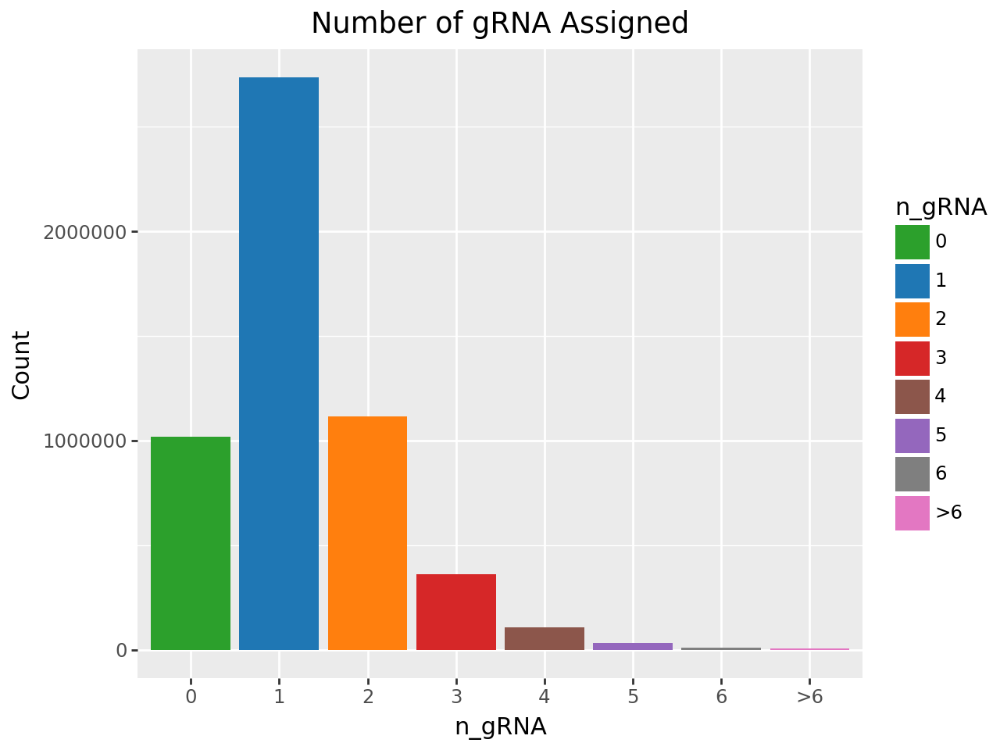

Cells without confident sgRNA calls: 18.89%
Estimated Multiplet Rate: 30.33%


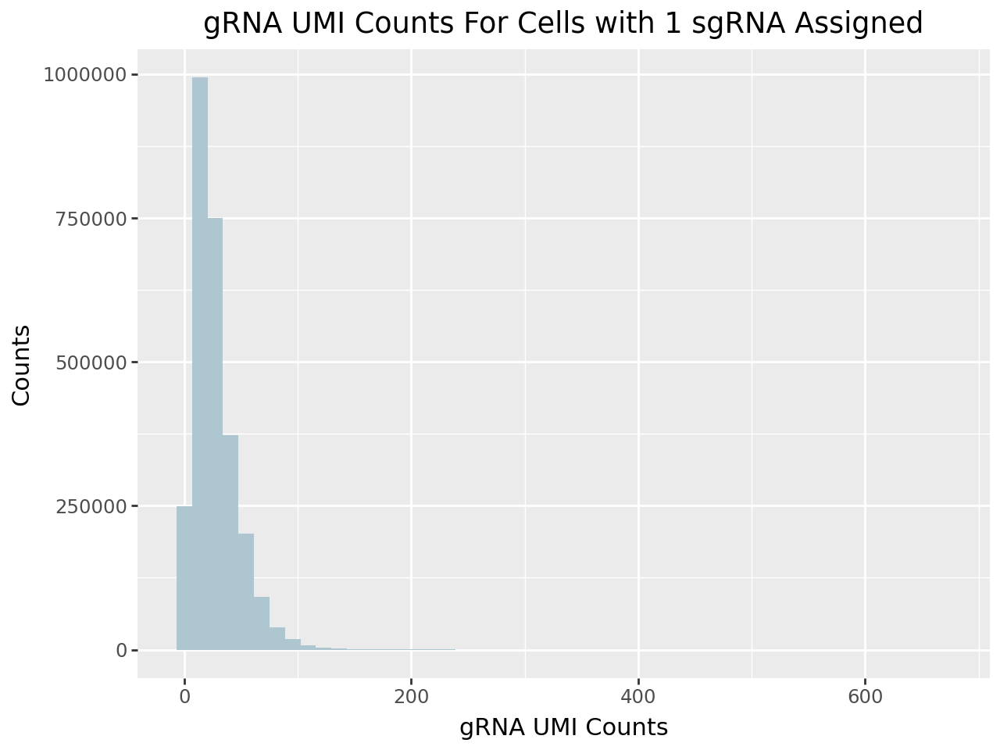

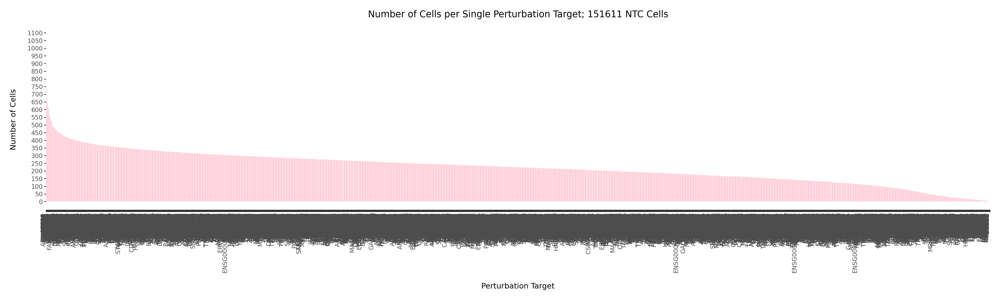

Number of perturbations with >= 50 cells with single guide assigned: 10933/11687 (93.55%)


In [ ]:
protospacer_calls_file_path = "/home/ranwyl/data_tf_project/protospacer_calls_per_cell.csv"
adata = qc.assign_protospacers(adata,protospacer_calls_file_path=protospacer_calls_file_path)

### Step C: Cell-level QC

Now we will run step C, cell-level QC. First, we assign metadata:

In [ ]:
aggregation_csv_file_path = "/home/ranwyl/data_tf_project/aggregation_csv.csv"
d = pd.read_csv(aggregation_csv_file_path)
channel_dict = {str(i+1):channel for i,channel in enumerate(d["sample_id"])}
adata = qc.assign_metadata(adata=adata,cell_type="KOLF2.1J iPSC",perturbation_type="CRISPRi Perturb-Seq",channel_dict=channel_dict)
adata.obs['n_gRNA_UMIs'] = adata.obs['n_gRNA_UMIs'].astype(str)

/home/ranwyl/data_tf_project/perturb_seq_heuristic_pipeline.py:175: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.


In [ ]:
adata

AnnData object with n_obs × n_vars = 2735450 × 38606
    obs: 'gRNA', 'n_gRNA', 'n_gRNA_UMIs', 'gene_target', 'celltype', 'perturbation_type', 'n_UMI_counts', 'n_genes', 'perturbed', 'channel'
    var: 'gene_ids', 'feature_types', 'n_UMI_counts', 'n_cells'

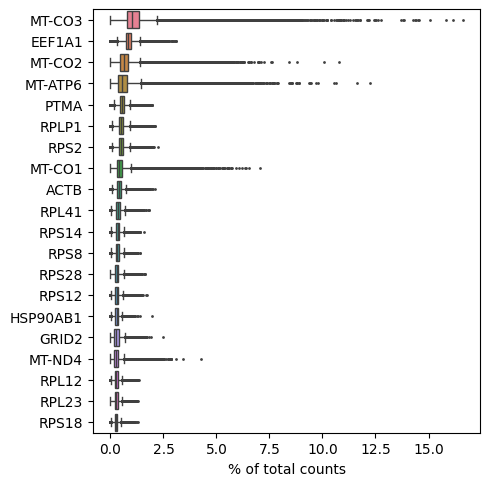

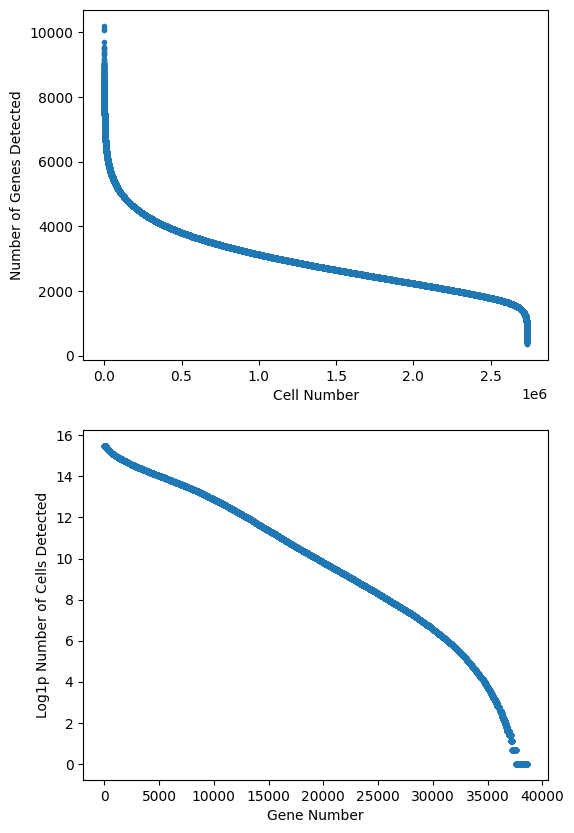

Removing 1039 genes not detected in any cells.


In [ ]:
adata = qc.general_qc(adata)

/home/ranwyl/data_tf_project/perturb_seq_heuristic_pipeline.py:201: ImplicitModificationWarning: Trying to modify attribute `.var` of view, initializing view as actual.


outlier
False    2663490
True       71960
Name: count, dtype: int64

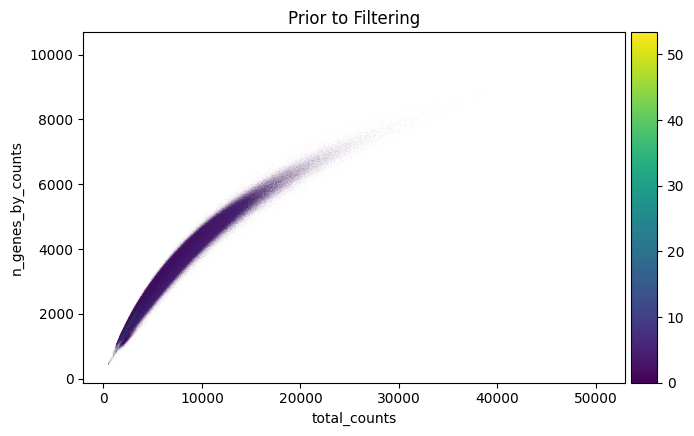

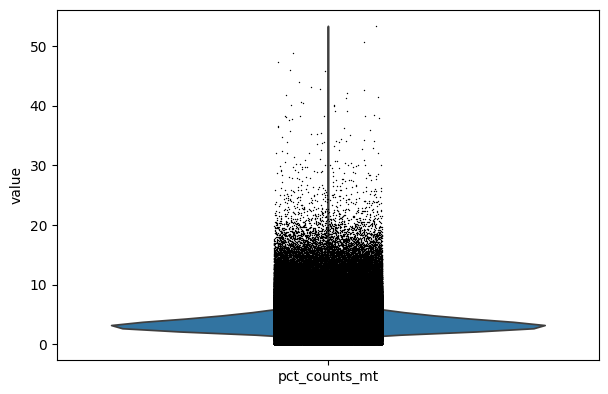

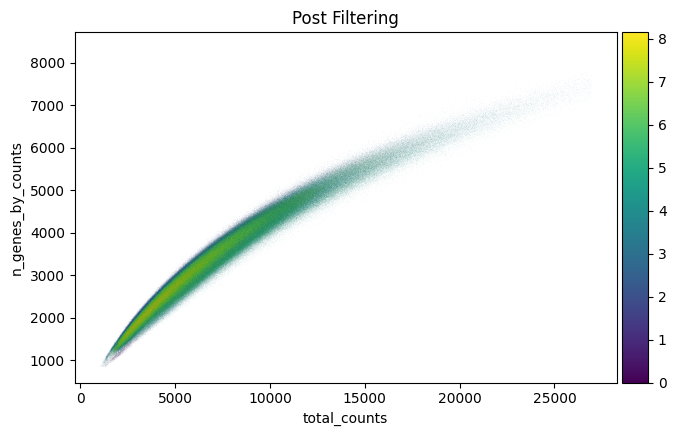

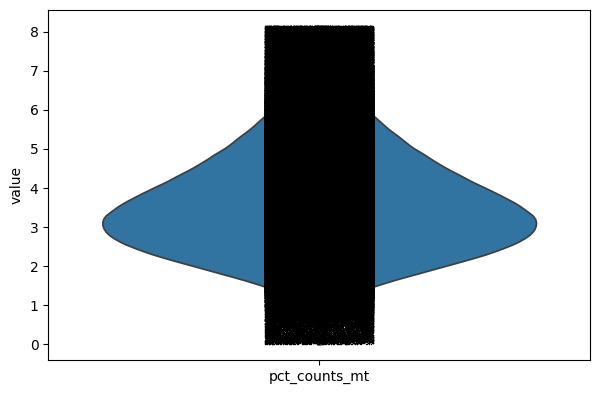

In [ ]:
adata = qc.dead_cell_qc(adata, mt_MADs=5)

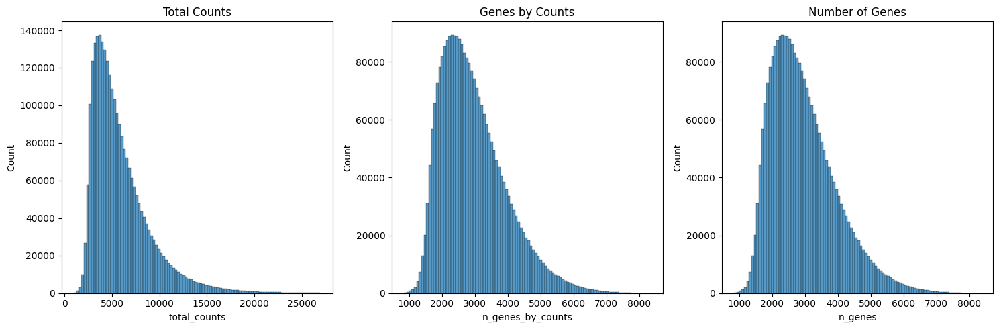

In [ ]:
qc.doublet_detection_sanity_check(adata)

Save the intermediate file:

In [ ]:
adata.write("/home/ranwyl/data_tf_project/Aggregate_Basic_QC_Cell_QC.h5ad") # Deleted already

### Step D: Isolating Core NTC Cells 

Read in QC-passed data:

In [ ]:
adata = ad.read_h5ad("/home/ranwyl/data_tf_project/Aggregate_Basic_QC_Cell_QC.h5ad")

Save raw counts and create `run` metadata column in `obs`:

In [ ]:
adata.layers["counts"] = adata.X.copy()
adata.obs["run"] = [label.split('-')[0] for label in adata.obs.channel]

Filter NTC cells based on provided whitelist:

In [ ]:
whitelist_filepath = "/home/ranwyl/data_tf_project/NTC_sgRNA_whitelist.txt"
with open(whitelist_filepath, 'r') as f:
  sgRNA_whitelist = f.read().splitlines()
ntc_adata = qc2._get_ntc_view(adata)
ntc_adata = ntc_adata[ntc_adata.obs.gRNA.isin(sgRNA_whitelist)].copy()
ntc_adata

AnnData object with n_obs × n_vars = 53476 × 37567
    obs: 'gRNA', 'n_gRNA', 'n_gRNA_UMIs', 'gene_target', 'celltype', 'perturbation_type', 'n_UMI_counts', 'n_genes', 'perturbed', 'channel', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'run'
    var: 'gene_ids', 'feature_types', 'n_UMI_counts', 'n_cells', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    layers: 'counts'

Use isolation forest with 30% contamination fraction to isolate core NTC cells:

Initial number of NTC Cells: 53476
extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)
calculating cell cycle phase
computing score 'S_score'
    finished: added
    'S_score', score of gene set (adata.obs).
    342 total control genes are used. (0:00:01)
computing score 'G2M_score'
    finished: added
    'G2M_score', score of gene set (adata.obs).
    300 total control genes are used. (0:00:01)
-->     'phase', cell cycle phase (adata.obs)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    with n_comps=100
    finished (0:00:07)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PCs', the loadings (adata.varm)
    'pca_variance', the variance / eigenvalues (adata.uns['pca'])
    'pca_variance_r

  0%|          | 0/200 [00:00<?, ?it/s]

	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:34)


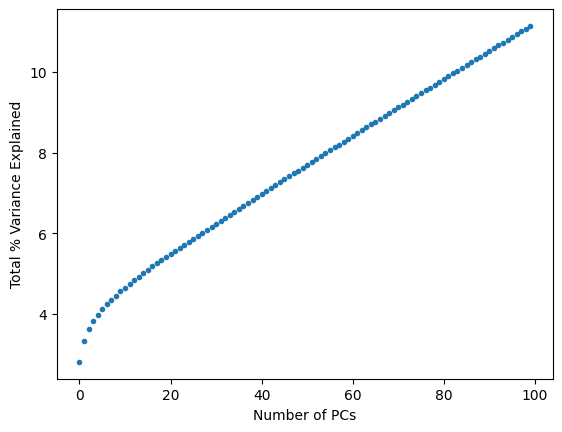

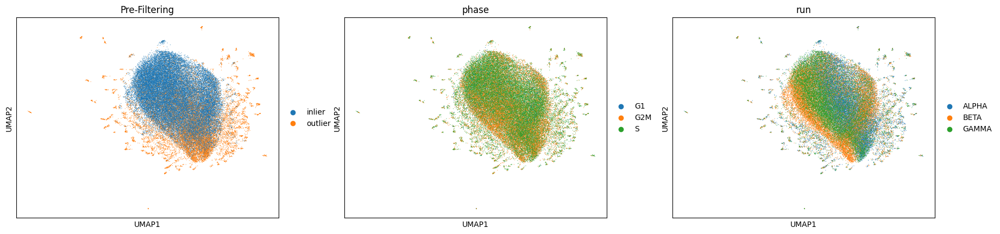

computing density on 'umap'
--> added
    'umap_density', densities (adata.obs)
    'umap_density_params', parameter (adata.uns)


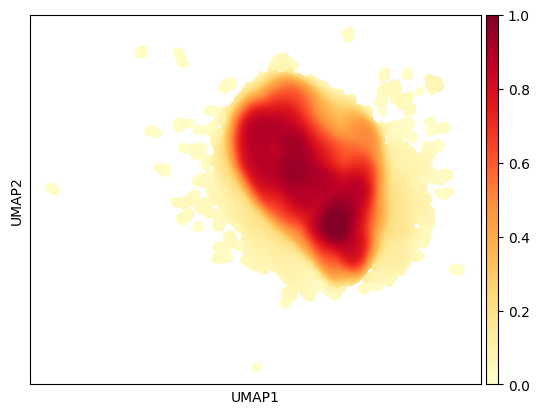

computing neighbors
        initialized `.distances` `.connectivities` 
    computing neighbors
    computed neighbors (0:00:04)
    computed connectivities (0:00:00)
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:34)
computing UMAP


  0%|          | 0/200 [00:00<?, ?it/s]

	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs
	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:22)


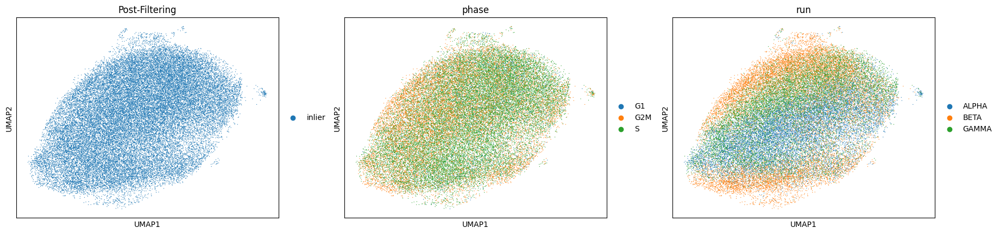

computing density on 'umap'
--> added
    'umap_density', densities (adata.obs)
    'umap_density_params', parameter (adata.uns)


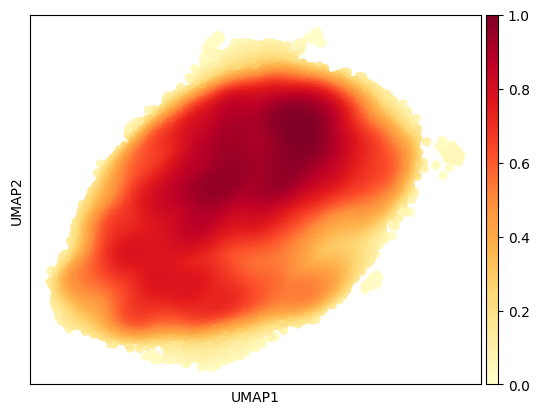

In [ ]:
ntc_adata = ntc_adata[ntc_adata.obs.index.isin(qc2.scrub_ntc(ntc_adata))]

In [ ]:
ntc_adata

View of AnnData object with n_obs × n_vars = 37433 × 37567
    obs: 'gRNA', 'n_gRNA', 'n_gRNA_UMIs', 'gene_target', 'celltype', 'perturbation_type', 'n_UMI_counts', 'n_genes', 'perturbed', 'channel', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'run', 'S_score', 'G2M_score', 'phase', 'is_outlier', 'umap_density'
    var: 'gene_ids', 'feature_types', 'n_UMI_counts', 'n_cells', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches', 'mean', 'std'
    uns: 'hvg', 'log1p', 'pca', 'neighbors', 'umap', 'is_outlier_colors', 'phase_colo

In [ ]:
ntc_adata.obs.run.value_counts()

run
ALPHA    14108
BETA     13537
GAMMA     9788
Name: count, dtype: int64

Note: the above counts are slightly different than the Pan_Genome_Analysis.ipynb notebook.

We have now isolated the core NTC cells. We will subset `adata` to only include perturbed cells and the core NTC cells.

In [ ]:
perturbed_mask = adata.obs.perturbed == "True"
valid_ntc_mask = adata.obs.index.isin(ntc_adata.obs.index)
adata_step_d = adata[perturbed_mask | valid_ntc_mask,:].copy()

In [ ]:
adata_step_d

AnnData object with n_obs × n_vars = 2554182 × 37567
    obs: 'gRNA', 'n_gRNA', 'n_gRNA_UMIs', 'gene_target', 'celltype', 'perturbation_type', 'n_UMI_counts', 'n_genes', 'perturbed', 'channel', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'run'
    var: 'gene_ids', 'feature_types', 'n_UMI_counts', 'n_cells', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    layers: 'counts'

Save the file:

In [ ]:
adata_step_d.write("/home/ranwyl/data_tf_project/Aggregate_Core_NTC.h5ad")

### Post step D/pre step E

Load in data:

In [ ]:
adata = ad.read_h5ad("/home/ranwyl/data_tf_project/Aggregate_Core_NTC.h5ad")

Check that the number of NTC cells is correct:

In [ ]:
adata[adata.obs["perturbed"] == "False"]

View of AnnData object with n_obs × n_vars = 37433 × 37567
    obs: 'gRNA', 'n_gRNA', 'n_gRNA_UMIs', 'gene_target', 'celltype', 'perturbation_type', 'n_UMI_counts', 'n_genes', 'perturbed', 'channel', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'run'
    var: 'gene_ids', 'feature_types', 'n_UMI_counts', 'n_cells', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    layers: 'counts'

Plot cells per perturbation:

10281/11739 (87.58)% Perturbations have > 100 cells


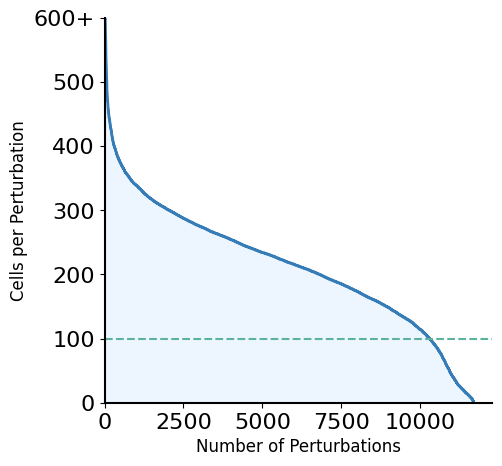

In [ ]:
f = qc2.plot_cells_per_perturbation(adata)

Plot UMIs per cell:

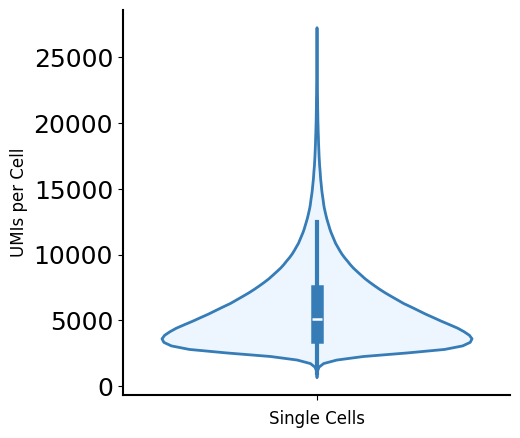

In [ ]:
f = qc2.plot_umis_per_cell(adata)

Assign more metadata:

In [ ]:
gene_id_file_path = "/home/ranwyl/data_tf_project/gene_ids.txt"
qc2.assign_gene_ids(adata, gene_id_file_path)
adata = qc2.remove_invalid_gene_targets_in_place(adata,obs_key="gene_target_ensembl_id",var_key="gene_ids")

  - ENSG00000234414
  - ENSG00000251380
  - ENSG00000182415
  - ENSG00000172288
  - ENSG00000262664
  - ENSG00000129864
  - ENSG00000268994
  - ENSG00000286190
  - ENSG00000253797


Split by run and save intermediate files:

In [ ]:
adata_alpha = adata[adata.obs.run=="ALPHA"]
adata_alpha = adata_alpha.copy()
adata_alpha.write("/home/ranwyl/data_tf_project/Aggregate_ALPHA.h5ad")

In [ ]:
adata_beta = adata[adata.obs.run=="BETA"]
adata_beta = adata_beta.copy()
adata_beta.write("/home/ranwyl/data_tf_project/Aggregate_BETA.h5ad")

In [ ]:
adata_gamma = adata[adata.obs.run=="GAMMA"]
adata_gamma = adata_gamma.copy()
adata_gamma.write("/home/ranwyl/data_tf_project/Aggregate_GAMMA.h5ad")

### Step E: Isolating effective sgRNA

In this step, we will normalize counts per cell to 1M, remove sgRNA that do not induce mean >30% on-target knockdown, and remove unrepressed cells and sgRNA without at least 25 associated cells. We will read in each dataset and perform the knockdown QC one at a time.

Perform knockdown QC:

normalizing counts per cell
    finished (0:00:13)


/home/ranwyl/data_tf_project/pan_genome_analysis_functions.py:251: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


8192 out of 11304 (72.47%) non-NTC sgRNAs have more than 30% knockdown.


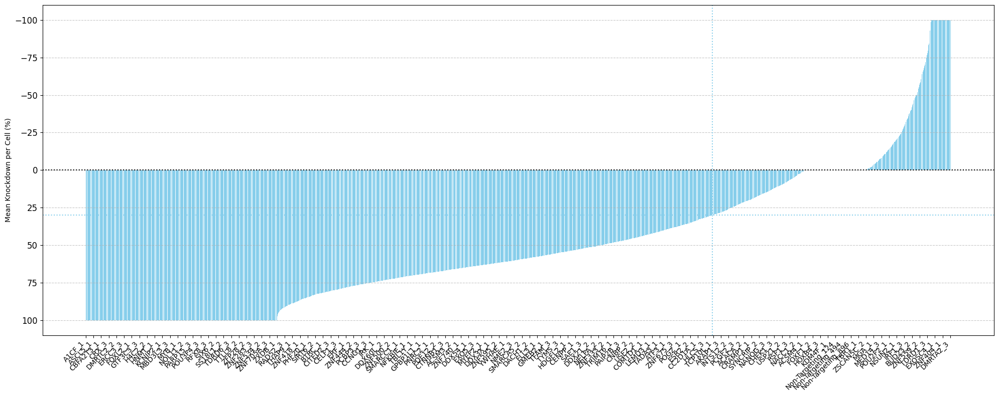

Removing 2876 perturbing sgRNA for not having more than 30% knockdown
Before filter: 11307,perturbed
True     887720
False     14108
Name: count, dtype: int64
After filter: 8431,perturbed
True     663159
False     14108
Name: count, dtype: int64
Removing 41501 perturbed cells for not having any measureable repression.
Before filter: 8431,perturbed
True     663159
False     14108
Name: count, dtype: int64
After filter: 8431,perturbed
True     621658
False     14108
Name: count, dtype: int64


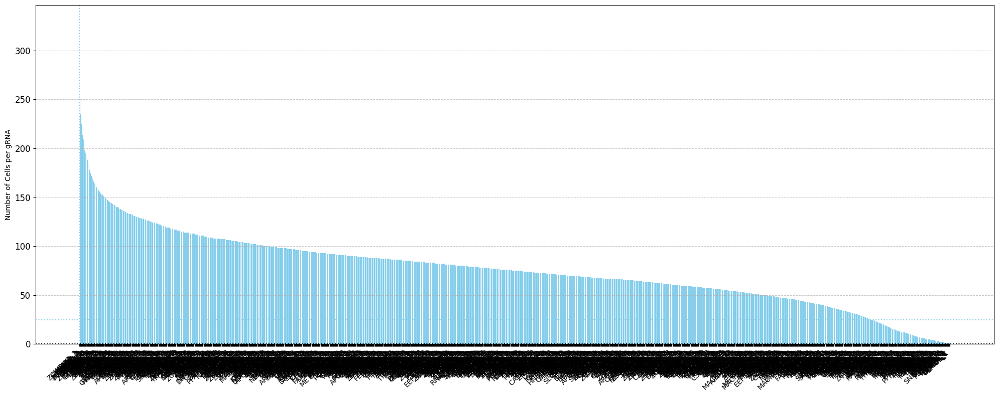

Before filter: 8431,perturbed
True     621658
False     14108
Name: count, dtype: int64
Removing 754 perturbing sgRNA for not having more than 25 cells
After filter: 7677,perturbed
True     613603
False     14108
Name: count, dtype: int64


In [ ]:
adata_alpha = ad.read_h5ad("/home/ranwyl/data_tf_project/Aggregate_ALPHA.h5ad")
knockdown_adata_alpha = qc2.knockdown_qc(adata_alpha, 'gene_target_ensembl_id', 'gene_ids').copy()

normalizing counts per cell
    finished (0:00:18)


/home/ranwyl/data_tf_project/pan_genome_analysis_functions.py:251: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


9799 out of 12155 (80.62%) non-NTC sgRNAs have more than 30% knockdown.


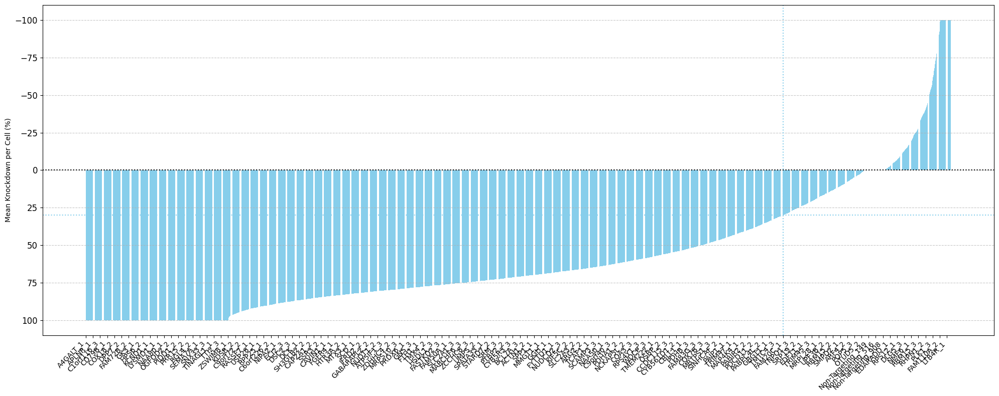

Removing 2120 perturbing sgRNA for not having more than 30% knockdown
Before filter: 12155,perturbed
True     948581
False     13537
Name: count, dtype: int64
After filter: 10035,perturbed
True     807083
False     13537
Name: count, dtype: int64
Removing 44923 perturbed cells for not having any measureable repression.
Before filter: 10035,perturbed
True     807083
False     13537
Name: count, dtype: int64
After filter: 10035,perturbed
True     762160
False     13537
Name: count, dtype: int64


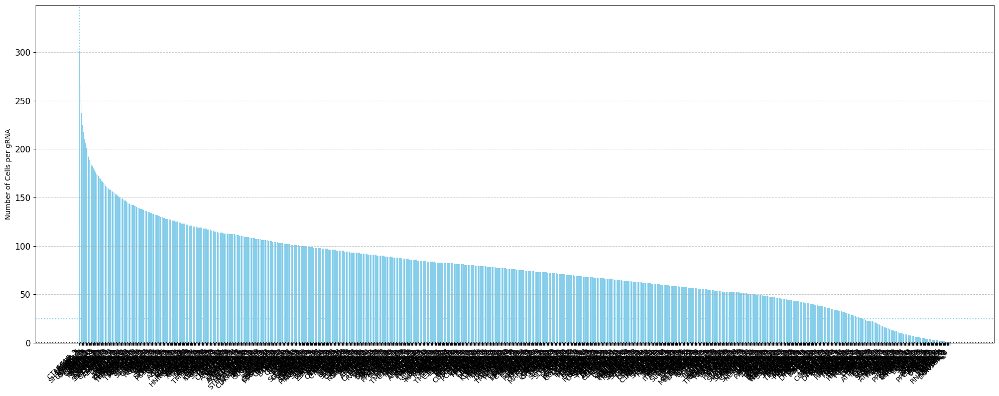

Before filter: 10035,perturbed
True     762160
False     13537
Name: count, dtype: int64
Removing 995 perturbing sgRNA for not having more than 25 cells
After filter: 9040,perturbed
True     751795
False     13537
Name: count, dtype: int64


In [ ]:
adata_beta = ad.read_h5ad("/home/ranwyl/data_tf_project/Aggregate_BETA.h5ad")
knockdown_adata_beta = qc2.knockdown_qc(adata_beta, 'gene_target_ensembl_id', 'gene_ids').copy()

normalizing counts per cell
    finished (0:00:12)


/home/ranwyl/data_tf_project/pan_genome_analysis_functions.py:251: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


9888 out of 12002 (82.39%) non-NTC sgRNAs have more than 30% knockdown.


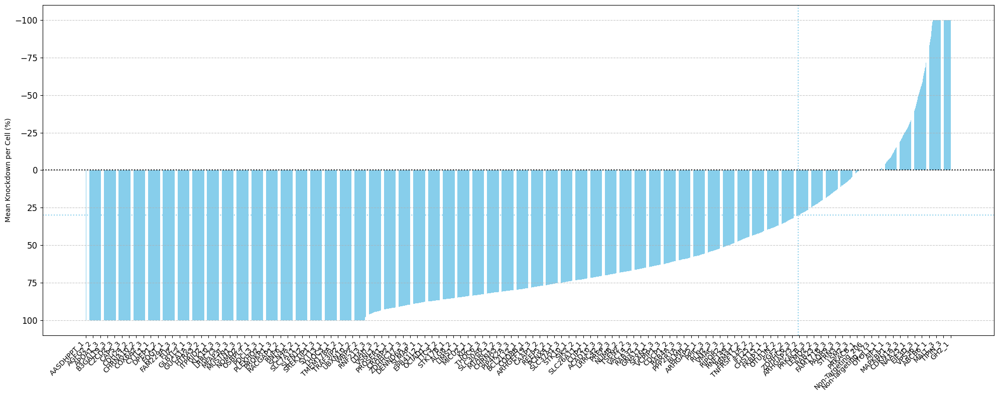

Removing 1879 perturbing sgRNA for not having more than 30% knockdown
Before filter: 12002,perturbed
True     678499
False      9788
Name: count, dtype: int64
After filter: 10123,perturbed
True     575298
False      9788
Name: count, dtype: int64
Removing 24979 perturbed cells for not having any measureable repression.
Before filter: 10123,perturbed
True     575298
False      9788
Name: count, dtype: int64
After filter: 10123,perturbed
True     550319
False      9788
Name: count, dtype: int64


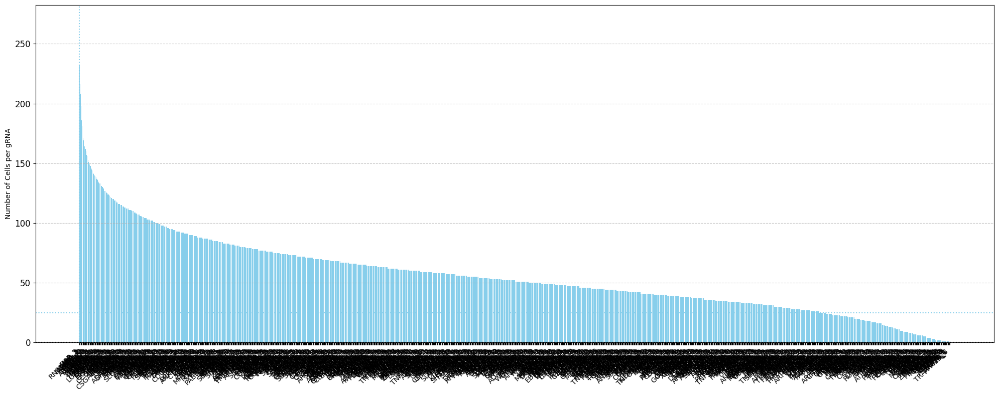

Before filter: 10123,perturbed
True     550319
False      9788
Name: count, dtype: int64
Removing 1493 perturbing sgRNA for not having more than 25 cells
After filter: 8630,perturbed
True     529985
False      9788
Name: count, dtype: int64


In [ ]:
adata_gamma = ad.read_h5ad("/home/ranwyl/data_tf_project/Aggregate_GAMMA.h5ad")
knockdown_adata_gamma = qc2.knockdown_qc(adata_gamma, 'gene_target_ensembl_id', 'gene_ids').copy()

/tmp/ipykernel_3415299/3623594956.py:1: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
/tmp/ipykernel_3415299/3623594956.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


9530/11739 (0.8118238350796491) Perturbations achieve > 30% Knockdown


/tmp/ipykernel_3415299/3623594956.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


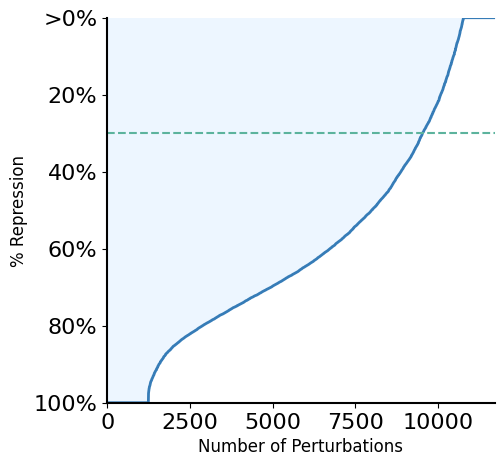

In [ ]:
alpha_knockdown = list(qc2._get_perturbed_view(adata_alpha).obs.groupby("gene_target")["target_knockdown"].mean())
beta_knockdown = list(qc2._get_perturbed_view(adata_beta).obs.groupby("gene_target")["target_knockdown"].mean())
gamma_knockdown = list(qc2._get_perturbed_view(adata_gamma).obs.groupby("gene_target")["target_knockdown"].mean())
total_knockdown = np.sort(np.clip(np.array(alpha_knockdown + beta_knockdown + gamma_knockdown),a_min=0,a_max=1))[::-1]
f = qc2.plot_percentage_perturbations_by_repression(total_knockdown)

In [ ]:
print(sum(total_knockdown > 0.3)/11739)

0.8118238350796491


Calculate median NTC number of UMI counts:

In [ ]:
median_NTC = np.median(list(qc2._get_ntc_view(knockdown_adata_alpha).obs.n_UMI_counts) 
                       + list(qc2._get_ntc_view(knockdown_adata_beta).obs.n_UMI_counts) 
                       + list(qc2._get_ntc_view(knockdown_adata_gamma).obs.n_UMI_counts))
print(median_NTC)

4542.0


In [ ]:
median_NTC = 4542.0

Normalize, log1p transform, and scale data with target sum `median_NTC`, one dataset at a time.

ALPHA:

In [ ]:
sc.pp.normalize_total(knockdown_adata_alpha,target_sum=median_NTC)
sc.pp.log1p(knockdown_adata_alpha)
sc.pp.scale(knockdown_adata_alpha)

normalizing counts per cell
    finished (0:00:12)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


In [ ]:
knockdown_adata_alpha.write("/home/ranwyl/data_tf_project/step_E_output_ALPHA.h5ad")

BETA:

In [ ]:
sc.pp.normalize_total(knockdown_adata_beta,target_sum=median_NTC)
sc.pp.log1p(knockdown_adata_beta)
sc.pp.scale(knockdown_adata_beta)

normalizing counts per cell
    finished (0:00:10)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


In [ ]:
knockdown_adata_beta.write("/home/ranwyl/data_tf_project/step_E_output_BETA.h5ad")

GAMMA:

In [ ]:
sc.pp.normalize_total(knockdown_adata_gamma,target_sum=median_NTC)
sc.pp.log1p(knockdown_adata_gamma)
sc.pp.scale(knockdown_adata_gamma)

normalizing counts per cell
    finished (0:00:06)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


In [ ]:
knockdown_adata_gamma.write("/home/ranwyl/data_tf_project/step_E_output_GAMMA.h5ad")

### Step F: Isolate sgRNA altering cell state and isolate perturbed cells

First we perform sgRNA level energy distance based filtering on each of the 3 data subsets.

In [ ]:
os.environ["OMP_NUM_THREADS"] = "1"
os.environ["OMP_MAX_ACTIVE_LEVELS"] = "1"
os.environ["KMP_WARNINGS"] = "0"  # For Intel's OpenMP implementation

ALPHA:

In [ ]:
knockdown_adata_alpha = ad.read_h5ad("/home/ranwyl/data_tf_project/step_E_output_ALPHA.h5ad")

/home/ranwyl/data_tf_project/pan_genome_analysis_functions.py:519: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)
computing PCA
    with n_comps=50
    finished (0:00:19)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PCs', the loadings (adata.varm)
    'pca_variance', the variance / eigenvalues (adata.uns['pca'])
    'pca_variance_ratio', the variance ratio (adata.uns['pca'])
computing neighbors
    computing neighbors
    using 'X_pca' with n_pcs = 50
    computed neighbors (0:00:36)
    computed connectivities (0:00:02)
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:39)


Computing null distribution:   0%|          | 0/10000 [00:00<?, ?it/s]

Computing group distances:   0%|          | 0/7442 [00:00<?, ?it/s]

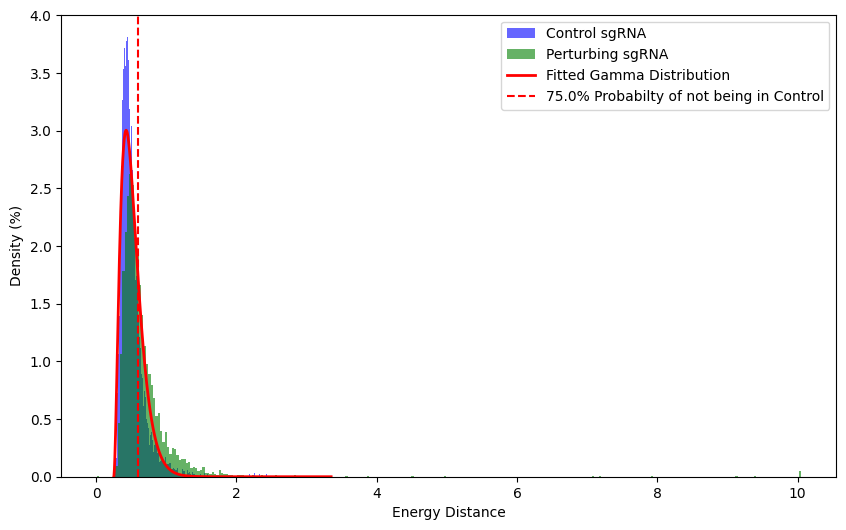

3211/7442 Perturbing sgRNA cross threshold of 0.75


In [ ]:
alpha_filtered, alpha_null_distances, alpha_results = qc2.filter_sgRNA(knockdown_adata_alpha)

In [ ]:
alpha_filtered = alpha_filtered.copy()

In [ ]:
alpha_filtered.write("/home/ranwyl/data_tf_project/Aggregate_ALPHA_sgRNA_Filtered.h5ad")

BETA:

In [ ]:
knockdown_adata_beta = ad.read_h5ad("/home/ranwyl/data_tf_project/step_E_output_BETA.h5ad")

/home/ranwyl/data_tf_project/pan_genome_analysis_functions.py:519: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)
computing PCA
    with n_comps=50
    finished (0:00:10)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PCs', the loadings (adata.varm)
    'pca_variance', the variance / eigenvalues (adata.uns['pca'])
    'pca_variance_ratio', the variance ratio (adata.uns['pca'])
computing neighbors
    computing neighbors
    using 'X_pca' with n_pcs = 50
    computed neighbors (0:00:42)
    computed connectivities (0:00:02)
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:45)


Computing null distribution:   0%|          | 0/10000 [00:00<?, ?it/s]

Computing group distances:   0%|          | 0/8805 [00:00<?, ?it/s]

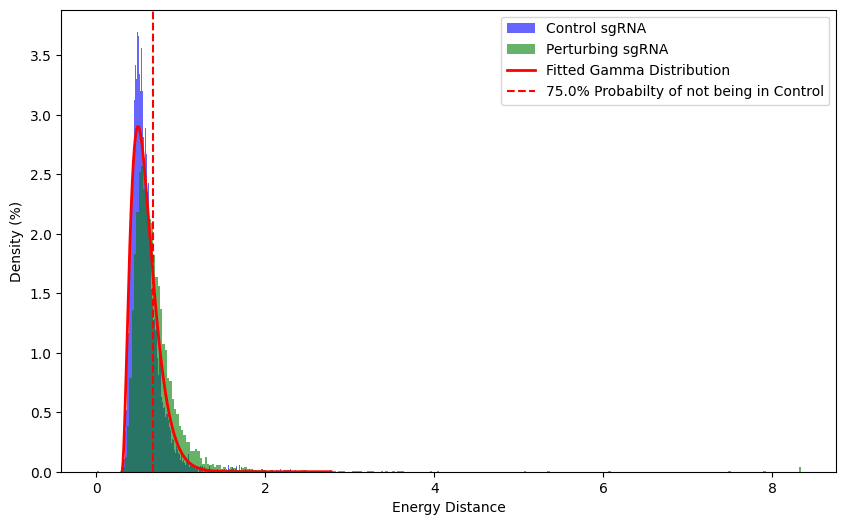

3714/8805 Perturbing sgRNA cross threshold of 0.75


In [ ]:
beta_filtered, beta_null_distances, beta_results = qc2.filter_sgRNA(knockdown_adata_beta)

In [ ]:
beta_filtered = beta_filtered.copy()

In [ ]:
beta_filtered.write("/home/ranwyl/data_tf_project/Aggregate_BETA_sgRNA_Filtered.h5ad")

GAMMA:

In [ ]:
knockdown_adata_gamma = ad.read_h5ad("/home/ranwyl/data_tf_project/step_E_output_GAMMA.h5ad")

/home/ranwyl/data_tf_project/pan_genome_analysis_functions.py:519: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.


extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)
computing PCA
    with n_comps=50
    finished (0:00:09)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PCs', the loadings (adata.varm)
    'pca_variance', the variance / eigenvalues (adata.uns['pca'])
    'pca_variance_ratio', the variance ratio (adata.uns['pca'])
computing neighbors
    computing neighbors
    using 'X_pca' with n_pcs = 50
    computed neighbors (0:00:38)
    computed connectivities (0:00:02)
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:41)


Computing null distribution:   0%|          | 0/10000 [00:00<?, ?it/s]

Computing group distances:   0%|          | 0/8396 [00:00<?, ?it/s]

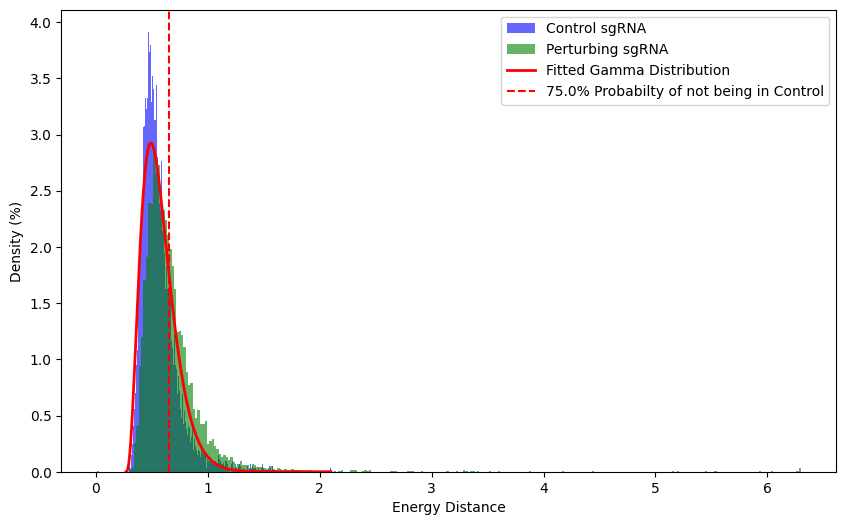

3383/8396 Perturbing sgRNA cross threshold of 0.75


In [ ]:
gamma_filtered, gamma_null_distances, gamma_results = qc2.filter_sgRNA(knockdown_adata_gamma)

In [ ]:
gamma_filtered = gamma_filtered.copy()

In [ ]:
gamma_filtered.write("/home/ranwyl/data_tf_project/Aggregate_GAMMA_sgRNA_Filtered.h5ad")

Next, we remove unperturbed cells one data subset at a time.

ALPHA:

In [ ]:
adata_alpha = ad.read_h5ad("/home/ranwyl/data_tf_project/Aggregate_ALPHA_sgRNA_Filtered.h5ad")

extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)
normalizing counts per cell
    finished (0:00:03)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    with n_comps=50
    finished (0:00:19)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PCs', the loadings (adata.varm)
    'pca_variance', the variance / eigenvalues (adata.uns['pca'])
    'pca_variance_ratio', the variance ratio (adata.uns['pca'])


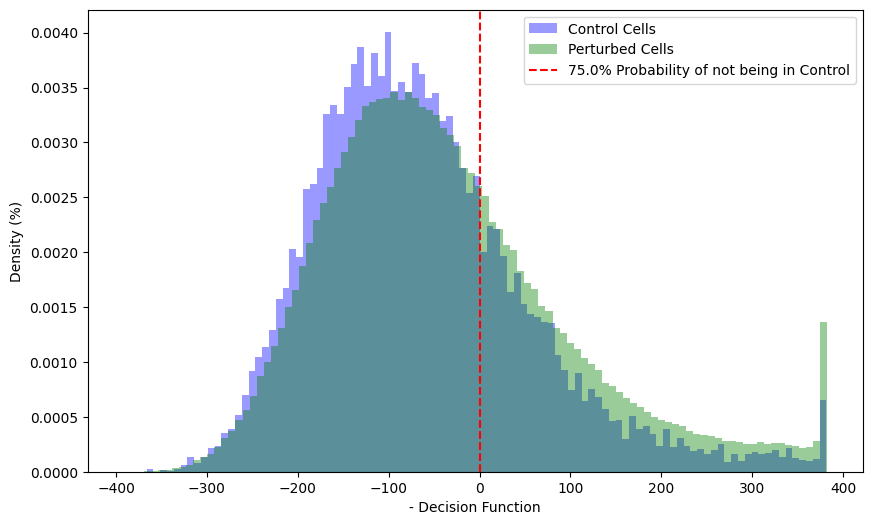

83534/258747 Perturbed Cells cross threshold of 0.75


In [ ]:
adata_alpha_filtered, c, p = qc2.remove_unperturbed_cells(adata_alpha, threshold=0.75)

In [ ]:
perturbation_counts = dict(adata_alpha_filtered.obs.gene_target.value_counts())
remaining_perturbations = [k for k,v in perturbation_counts.items() if v >= 25]
print(len(remaining_perturbations),remaining_perturbations)

1467 ['NTC', 'KAT2A', 'ZFP41', 'ARHGAP35', 'LRPPRC', 'DNMT1', 'CABIN1', 'ZNF354A', 'BHLHE40', 'EMSY', 'CHAMP1', 'EHMT1', 'PCGF1', 'PWWP2B', 'SMAD9', 'MEIS3', 'ELOC', 'HASPIN', 'PNPT1', 'HMCES', 'FOXH1', 'EZH2', 'TFAM', 'SIN3B', 'EHMT2', 'SHOX2', 'HMGB4', 'RNASEH1', 'ZBTB22', 'ALKBH1', 'METTL18', 'ZNF383', 'SMARCC1', 'ZNF521', 'SMARCE1', 'UHRF1', 'ZNF787', 'SLF1', 'DDX6', 'COMTD1', 'FOXS1', 'ACTB', 'ZNF75D', 'ETS1', 'ZNF219', 'PCGF6', 'ZFP1', 'POU5F1', 'NEK9', 'ZFP69B', 'SKP2', 'SOX4', 'NABP2', 'PDP1', 'POLRMT', 'ZNF462', 'LEMD3', 'EYA3', 'NEUROD4', 'SUZ12', 'MTA1', 'DOT1L', 'NANOG', 'ETV1', 'ESRRA', 'ZNF394', 'SLX1A', 'GATA2', 'TBX20', 'ZNF791', 'H2AC11', 'CARNMT1', 'THAP12', 'POGZ', 'ZNF419', 'TENT4B', 'ERVK3-1', 'NFIL3', 'KLF6', 'RLIM', 'FOXJ2', 'SETDB1', 'EPAS1', 'TIGD2', 'CRTC2', 'ZKSCAN1', 'H2BW2', 'KMT2D', 'FOXO3B', 'ZNF418', 'SMAD4', 'BARX1', 'PURG', 'RCOR2', 'ZNF180', 'SHOX', 'TWIST1', 'BCL6B', 'DIS3L', 'PPCS', 'MSX2', 'TRMT10C', 'E2F4', 'HES6', 'RORC', 'ZNF20', 'TP53BP1', 'BRP

In [ ]:
adata_alpha_filtered = qc2.remove_perturbations_by_cell_threshold(adata_alpha_filtered)

Removing 739 perturbations for having under 25 cells.


In [ ]:
adata_alpha_filtered.write("/home/ranwyl/data_tf_project/Aggregate_ALPHA_Core_Cells.h5ad")

BETA:

In [ ]:
adata_beta = ad.read_h5ad("/home/ranwyl/data_tf_project/Aggregate_BETA_sgRNA_Filtered.h5ad")

extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)
normalizing counts per cell
    finished (0:00:04)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    with n_comps=50
    finished (0:00:21)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PCs', the loadings (adata.varm)
    'pca_variance', the variance / eigenvalues (adata.uns['pca'])
    'pca_variance_ratio', the variance ratio (adata.uns['pca'])


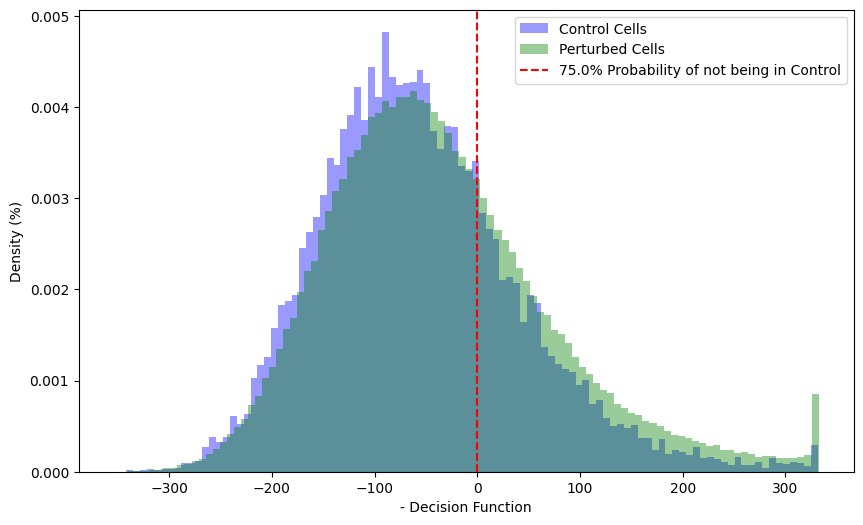

95740/306162 Perturbed Cells cross threshold of 0.75


In [ ]:
adata_beta_filtered, c, p = qc2.remove_unperturbed_cells(adata_beta, threshold=0.75)

In [ ]:
perturbation_counts = dict(adata_beta_filtered.obs.gene_target.value_counts())
remaining_perturbations = [k for k,v in perturbation_counts.items() if v >= 25]
print(len(remaining_perturbations),remaining_perturbations)

1696 ['NTC', 'SCAF4', 'CASP6', 'LATS2', 'BBC3', 'HCCS', 'IKBIP', 'UBFD1', 'FBXO45', 'VHL', 'JOSD1', 'VPS33A', 'UBE2M', 'RHOG', 'TESK1', 'SLC30A1', 'ETNK2', 'NAE1', 'CTAGE15', 'SGSM3', 'ACOT8', 'DSTN', 'CYCS', 'PPP1R14B', 'NCKAP5L', 'ARFRP1', 'FZD9', 'CASP3', 'IPO9', 'OSBPL2', 'BAX', 'SENP5', 'ATPAF1', 'MRPL36', 'LAMTOR1', 'YPEL3', 'TXNDC12', 'CHGA', 'LAMTOR5', 'POGLUT3', 'CLDN3', 'ACTN1', 'PACSIN1', 'CDKN2AIPNL', 'TPST2', 'MTRF1L', 'CCDC6', 'MZT2A', 'SH3BGRL3', 'ARFGAP1', 'ART5', 'C1orf159', 'CLPTM1L', 'IRAK1', 'FBXO44', 'SPRY2', 'CAPRIN2', 'CDK5R1', 'PPP1R1A', 'GRPEL2', 'IFNGR1', 'ZFPL1', 'PODXL2', 'SLC39A1', 'CAPN1', 'TWSG1', 'SLC35F6', 'FAM120AOS', 'LYSMD3', 'POLDIP2', 'DUS4L', 'TMSB4Y', 'ATAD1', 'MOSPD1', 'TCAF1', 'CLUH', 'VPS39', 'TEFM', 'FADS1', 'SLC30A5', 'KHDC4', 'MTCH1', 'SLC39A13', 'TOE1', 'VKORC1', 'GPR137', 'IFFO1', 'FJX1', 'SLC29A1', 'CAVIN1', 'LZTS2', 'FAM210B', 'WBP1', 'PTPN1', 'MRPL24', 'LIMD2', 'DPH2', 'TM6SF2', 'SNCG', 'LRCH4', 'FNDC10', 'CCDC78', 'STEAP3', 'BCKDK', '

In [ ]:
adata_beta_filtered = qc2.remove_perturbations_by_cell_threshold(adata_beta_filtered)

Removing 800 perturbations for having under 25 cells.


In [ ]:
adata_beta_filtered.write("/home/ranwyl/data_tf_project/Aggregate_BETA_Core_Cells.h5ad")

GAMMA:

In [ ]:
adata_gamma = ad.read_h5ad("/home/ranwyl/data_tf_project/Aggregate_GAMMA_sgRNA_Filtered.h5ad")

extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)
normalizing counts per cell
    finished (0:00:02)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    with n_comps=50
    finished (0:00:15)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PCs', the loadings (adata.varm)
    'pca_variance', the variance / eigenvalues (adata.uns['pca'])
    'pca_variance_ratio', the variance ratio (adata.uns['pca'])


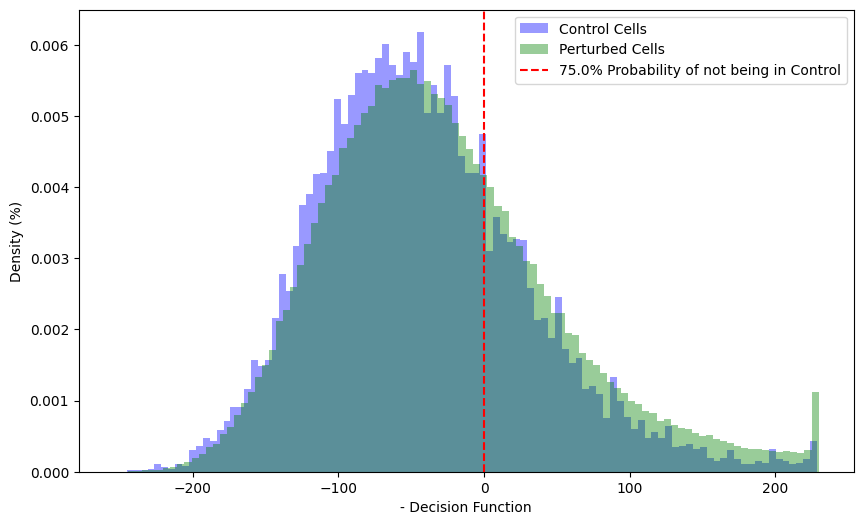

62877/205929 Perturbed Cells cross threshold of 0.75


In [ ]:
adata_gamma_filtered, c, p = qc2.remove_unperturbed_cells(adata_gamma, threshold=0.75)

In [ ]:
perturbation_counts = dict(adata_gamma_filtered.obs.gene_target.value_counts())
remaining_perturbations = [k for k,v in perturbation_counts.items() if v >= 25]
print(len(remaining_perturbations),remaining_perturbations)

1070 ['NTC', 'SUPT20H', 'FLYWCH2', 'FAM193A', 'DDT', 'RNF144A', 'NF2', 'FLCN', 'ENTPD8', 'HS2ST1', 'SCARB1', 'CNST', 'HCN2', 'RALGAPB', 'TIMM50', 'MMP16', 'CTAGE15', 'IL17RD', 'EIF4ENIF1', 'RASA2', 'WDR37', 'DRD4', 'FBXO31', 'CEP43', 'TGFBR2', 'RBM5', 'C1orf21', 'TEX2', 'STK10', 'TMEM74B', 'DENND1C', 'FAM241B', 'CRIM1', 'RAB8B', 'KLHL24', 'C3orf52', 'KCNF1', 'CEP78', 'PUS1', 'HIPK2', 'STOML1', 'RGPD5', 'PARD6G', 'PIP4P2', 'KIF17', 'NUAK2', 'MCOLN1', 'MMRN2', 'NRBP1', 'CFP', 'CACUL1', 'PDZD8', 'TBC1D7', 'AGTPBP1', 'YPEL1', 'ANXA2', 'CTAGE4', 'PAQR3', 'CLPSL2', 'ABCG1', 'PON2', 'DNAJB5', 'FAM200B', 'PEX13', 'HMCN2', 'MTPAP', 'GOLGA4', 'BTBD10', 'DTX1', 'ANXA6', 'MRRF', 'MLYCD', 'SYAP1', 'DAP', 'TBK1', 'TMEM179B', 'TRABD', 'DNAJC28', 'GRSF1', 'SLC17A7', 'FAM117B', 'SPATA25', 'UNC5B', 'LAMC3', 'CAPNS1', 'BEST4', 'BLTP3B', 'MAP4K2', 'SULF2', 'RET', 'BPGM', 'CYP2D6', 'CCDC28B', 'PCMTD1', 'GOLT1A', 'DENND4B', 'SPAG9', 'MADD', 'ANKRD17', 'CCER2', 'RNF7', 'EFNB3', 'BCL2L12', 'MAEA', 'ITPRID2', 

In [ ]:
adata_gamma_filtered = qc2.remove_perturbations_by_cell_threshold(adata_gamma_filtered)

Removing 1331 perturbations for having under 25 cells.


In [ ]:
adata_gamma_filtered.write("/home/ranwyl/data_tf_project/Aggregate_GAMMA_Core_Cells.h5ad")

### Step G: Differential Expression Analysis

Now we will perform differential expression analysis (DEA) on a pseudobulk representation of the data and define "strong" perturbations as perturbations with >= 10 differentially expressed genes (DEGs).

Write modified Step G functions based on the study pipeline

In [ ]:
def tf_run_deseq2_analysis(adata, n_jobs, gene_target_obs_column="gene_target", ntc_cells_delimiter="NTC", 
                                      n_replicates=3, sample_fraction=0.7, layer=None, alpha=0.05):
    ntc_cells = np.where(adata.obs[gene_target_obs_column] == ntc_cells_delimiter)[0]
    gene_targets = list(adata.obs[gene_target_obs_column].unique())
    gene_targets.remove(ntc_cells_delimiter)  # Remove the control group

    def process_gene_target(gene_target):
        pseudo_bulk_df, metadata_df = qc2.generate_pseudo_bulk_replicates_for_de(
            adata, gene_target, ntc_cells, n_replicates=n_replicates, sample_fraction=sample_fraction, layer=layer
        )
        return qc2.deseq2(pseudo_bulk_df, metadata_df, contrast=["condition", gene_target, ntc_cells_delimiter], alpha=alpha)

    with tqdm_joblib(desc="Running DE analysis", total=len(gene_targets)):
        results = Parallel(n_jobs=n_jobs)(delayed(process_gene_target)(gene_target) for gene_target in gene_targets)
    
    results_dict = dict(zip(gene_targets, results))
    
    return results_dict

def tf_save_DEG_df(results_dict, p_threshold=0.05, save=True, filepath=None):
    # Initialize a dictionary to store columns for the final DataFrame
    final_dict = {}

    for gene_target, df in results_dict.items():
        # Filter the DataFrame based on the padj (adjusted p-value) threshold
        filtered_df = df[df['padj'] < p_threshold]

        # Sort by L2FC
        l2fc_sorted = filtered_df.sort_values('log2FoldChange')
        
        # Create columns for DEGs, L2FC, and Adj_P and add them to the final_dict
        final_dict[f'{gene_target}_DEGs'] = l2fc_sorted.index.tolist()
        final_dict[f'{gene_target}_L2FC'] = l2fc_sorted['log2FoldChange'].tolist()
        final_dict[f'{gene_target}_Adj_P'] = l2fc_sorted['padj'].tolist()

    # Group keys by gene target to maintain adjacency
    gene_targets = list(results_dict.keys())
    
    # Sort the gene targets by the number of DEGs
    sorted_gene_targets = sorted(gene_targets, key=lambda gt: len(final_dict[f'{gt}_DEGs']), reverse=True)
    
    # Reorder the final_dict to keep DEGs, L2FC, and Adj_P together for each gene target
    ordered_dict = {}
    for gene_target in sorted_gene_targets:
        ordered_dict[f'{gene_target}_DEGs'] = final_dict[f'{gene_target}_DEGs']
        ordered_dict[f'{gene_target}_L2FC'] = final_dict[f'{gene_target}_L2FC']
        ordered_dict[f'{gene_target}_Adj_P'] = final_dict[f'{gene_target}_Adj_P']

    # Find the maximum length of lists in the ordered_dict to handle unequal lengths
    max_length = max(len(lst) for lst in ordered_dict.values())

    # Pad shorter lists with None to ensure equal length columns
    for key in ordered_dict:
        ordered_dict[key].extend([None] * (max_length - len(ordered_dict[key])))

    # Create the final DataFrame directly from the dictionary
    combined_df = pd.DataFrame(ordered_dict)

    if save and filepath:
        with pd.ExcelWriter(filepath) as writer:
            combined_df.to_excel(writer, sheet_name='DEG Results', index=False)

Max RAM used for ALPHA = 573GB at 65% done. Total time ~20min to run `tf_run_deseq_2_analysis()` on 1466 genes and 1.5min to save `.xlsx` file

In [ ]:
adata_alpha = ad.read_h5ad("/home/ranwyl/data_tf_project/Aggregate_ALPHA_Core_Cells.h5ad")
adata_alpha.X = adata_alpha.layers["counts"].copy()
results_dict_alpha = tf_run_deseq2_analysis(adata_alpha, 25)

In [ ]:
alpha_filepath = "/home/ranwyl/results_tf_project/ALPHA_DEGs.xlsx"
tf_save_DEG_df(results_dict_alpha, filepath=alpha_filepath)

Max RAM used for BETA = 610G at 54% done.

In [ ]:
adata_beta = ad.read_h5ad("/home/ranwyl/data_tf_project/Aggregate_BETA_Core_Cells.h5ad")
adata_beta.X = adata_beta.layers["counts"].copy()
results_dict_beta = tf_run_deseq2_analysis(adata_beta, 27)

In [ ]:
beta_filepath = "/home/ranwyl/results_tf_project/BETA_DEGs.xlsx"
tf_save_DEG_df(results_dict_beta, filepath=beta_filepath)

In [ ]:
adata_gamma = ad.read_h5ad("/home/ranwyl/data_tf_project/Aggregate_GAMMA_Core_Cells.h5ad")
adata_gamma.X = adata_gamma.layers["counts"].copy()
results_dict_gamma = tf_run_deseq2_analysis(adata_gamma, 30)

In [ ]:
gamma_filepath = "/home/ranwyl/results_tf_project/GAMMA_DEGs.xlsx"
tf_save_DEG_df(results_dict_gamma, filepath=gamma_filepath)

Filter strong perturbations

In [ ]:
alpha_degs = pd.read_excel("/home/ranwyl/results_tf_project/ALPHA_DEGs.xlsx")
beta_degs = pd.read_excel("/home/ranwyl/results_tf_project/BETA_DEGs.xlsx")
gamma_degs = pd.read_excel("/home/ranwyl/results_tf_project/GAMMA_DEGs.xlsx")

In [ ]:
alpha_degs.loc[:, alpha_degs.columns.str.contains("CTAGE15")]

In [ ]:
strong_perturbations, DEGs = qc2.create_deg_list(alpha_degs, beta_degs, gamma_degs, deg_cutoff=10)

1361 Perturbations Left at a cutoff of 10 DEGs


In [ ]:
with open("/home/ranwyl/results_tf_project/strong_perturbations.txt",'w') as file:
    for item in strong_perturbations:
        file.write(f"{item}\n")

In [ ]:
DEGs.to_excel("/home/ranwyl/results_tf_project/Aggregate_DEGs.xlsx")

In [ ]:
strong_perturbations = list()
with open("/home/ranwyl/results_tf_project/strong_perturbations.txt") as f:
    strong_perturbations = f.read().split()
print(strong_perturbations[:5])

['POU5F1', 'MYADM', 'DBR1', 'PHF20', 'PSMD8']


In [ ]:
adata_alpha = ad.read_h5ad("/home/ranwyl/data_tf_project/Aggregate_ALPHA_Core_Cells.h5ad")
adata_beta = ad.read_h5ad("/home/ranwyl/data_tf_project/Aggregate_BETA_Core_Cells.h5ad")
adata_gamma = ad.read_h5ad("/home/ranwyl/data_tf_project/Aggregate_GAMMA_Core_Cells.h5ad")

In [ ]:
adata_alpha_filtered = adata_alpha[adata_alpha.obs.gene_target.isin(strong_perturbations)].copy()
adata_beta_filtered = adata_beta[adata_beta.obs.gene_target.isin(strong_perturbations)].copy()
adata_gamma_filtered = adata_gamma[adata_gamma.obs.gene_target.isin(strong_perturbations)].copy()

In [ ]:
del adata_alpha, adata_beta, adata_gamma
gc.collect()

3776

In [ ]:
adata_combined = ad.concat([adata_alpha_filtered,adata_beta_filtered,adata_gamma_filtered])
adata_combined.X = adata_combined.layers["counts"].copy()

In [ ]:
median_NTC_UMIs = np.median(qc2._get_ntc_view(adata_combined).obs.n_UMI_counts)
sc.pp.normalize_total(adata_combined, target_sum=median_NTC_UMIs)

normalizing counts per cell
    finished (0:00:00)


### Step H: Batch Correction

In [ ]:
sc.pp.log1p(adata_combined)
a = adata_combined[adata_combined.obs.run == 'ALPHA'].copy()
b = adata_combined[adata_combined.obs.run == 'BETA'].copy()
c = adata_combined[adata_combined.obs.run == 'GAMMA'].copy()

In [ ]:
del adata_combined
gc.collect()

1177

In [ ]:
qc2.relative_z_normalization(a)

In [ ]:
qc2.relative_z_normalization(b)
qc2.relative_z_normalization(c)
normalized_adata = ad.concat([a,b,c])

In [ ]:
normalized_adata.write("/home/ranwyl/data_tf_project/Aggregate_Strong_Perturbations_Batch_Normalized.h5ad")

In [ ]:
normalized_adata

AnnData object with n_obs × n_vars = 111902 × 37567
    obs: 'gRNA', 'n_gRNA', 'n_gRNA_UMIs', 'gene_target', 'celltype', 'perturbation_type', 'n_UMI_counts', 'n_genes', 'perturbed', 'channel', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'run', 'gene_target_ensembl_id', 'gene_target_expression (CPM)', 'NTC_target_gene_expression (CPM)', 'target_knockdown', 'target_knockdown_z_score', 'ed_category', 'anomaly_score'
    obsm: 'X_pca'
    layers: 'counts', 'normalized_counts', 'pre_z_normalization'

### Remove duplicates from DEG spreadsheet and save final version

Read in and view the DataFrame of DEGs for each strong perturbation (output from the study pipeline), `deg_df`

In [ ]:
deg_df = pd.read_excel("/home/ranwyl/results_tf_project/Aggregate_DEGs.xlsx", index_col=0)
deg_df

,POU5F1_DEGs,POU5F1_L2FC,POU5F1_Adj_P,MYADM_DEGs,MYADM_L2FC,MYADM_Adj_P,DBR1_DEGs,DBR1_L2FC,DBR1_Adj_P,PHF20_DEGs,...,CTAGE15_L2FC.12,CTAGE15_L2FC.13,CTAGE15_Adj_P.12,CTAGE15_Adj_P.13,CTAGE15_DEGs.14,CTAGE15_DEGs.15,CTAGE15_L2FC.14,CTAGE15_L2FC.15,CTAGE15_Adj_P.14,CTAGE15_Adj_P.15
0,DGKB,-6.076206,0.020763,TMEM220-AS1,-5.864895,0.026192,LMO3,-4.732414,0.017708,SLC22A23,...,-0.736635,NaN,0.025886,NaN,KRAS,NaN,-0.736635,NaN,0.025886,NaN
1,AP3B2,-5.457997,0.046913,ST6GAL2,-5.740117,0.031954,TMEM220-AS1,-4.144787,0.004143,ATG101,...,-0.649359,NaN,0.042101,NaN,PAFAH1B1,NaN,-0.649359,NaN,0.042101,NaN
2,TRNP1,-5.160944,0.004823,ENSG00000233290,-5.040239,0.018569,ZMYM3,-3.650721,0.002669,ORAI1,...,-0.621081,NaN,0.036694,NaN,ABI2,NaN,-0.621081,NaN,0.036694,NaN
3,ENSG00000259048,-5.015852,0.000079,TRIM56,-5.013357,0.006675,ENSG00000289084,-3.543780,0.000107,SUCLG1,...,-0.463132,NaN,0.046703,NaN,PABPN1,NaN,-0.463132,NaN,0.046703,NaN
4,SYNPO2,-4.207629,0.040667,TMEM158,-4.394789,0.025331,SRRM4,-3.528674,0.028472,ZNF581,...,-0.333667,NaN,0.025886,NaN,RPL38,NaN,-0.333667,NaN,0.025886,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1833,ENSG00000254202,8.638068,0.000195,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1834,DLX5,8.798191,0.000137,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1835,MEIS2,9.215727,0.000053,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1836,DLK1,9.618622,0.000020,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


When we scroll to the end, it looks like CTAGE15 appears multiple times. Now we know we need to remove duplicate entries that contain the "." character. We will check for these entries:

In [ ]:
deg_df.loc[:, deg_df.columns.str.contains(".", regex=False)]

,CTAGE15_DEGs.1,CTAGE15_L2FC.1,CTAGE15_Adj_P.1,CTAGE15_DEGs.2,CTAGE15_DEGs.3,CTAGE15_L2FC.2,CTAGE15_L2FC.3,CTAGE15_Adj_P.2,CTAGE15_Adj_P.3,CTAGE15_DEGs.4,...,CTAGE15_L2FC.12,CTAGE15_L2FC.13,CTAGE15_Adj_P.12,CTAGE15_Adj_P.13,CTAGE15_DEGs.14,CTAGE15_DEGs.15,CTAGE15_L2FC.14,CTAGE15_L2FC.15,CTAGE15_Adj_P.14,CTAGE15_Adj_P.15
0,NaN,NaN,NaN,KRAS,NaN,-0.736635,NaN,0.025886,NaN,KRAS,...,-0.736635,NaN,0.025886,NaN,KRAS,NaN,-0.736635,NaN,0.025886,NaN
1,NaN,NaN,NaN,PAFAH1B1,NaN,-0.649359,NaN,0.042101,NaN,PAFAH1B1,...,-0.649359,NaN,0.042101,NaN,PAFAH1B1,NaN,-0.649359,NaN,0.042101,NaN
2,NaN,NaN,NaN,ABI2,NaN,-0.621081,NaN,0.036694,NaN,ABI2,...,-0.621081,NaN,0.036694,NaN,ABI2,NaN,-0.621081,NaN,0.036694,NaN
3,NaN,NaN,NaN,PABPN1,NaN,-0.463132,NaN,0.046703,NaN,PABPN1,...,-0.463132,NaN,0.046703,NaN,PABPN1,NaN,-0.463132,NaN,0.046703,NaN
4,NaN,NaN,NaN,RPL38,NaN,-0.333667,NaN,0.025886,NaN,RPL38,...,-0.333667,NaN,0.025886,NaN,RPL38,NaN,-0.333667,NaN,0.025886,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1833,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1834,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1835,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1836,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


It looks like CTAGE15 is the only duplicate entry. We will look at all columns that contain "CTAGE15":

In [ ]:
deg_df.loc[:, deg_df.columns.str.contains("CTAGE15")]

,CTAGE15_DEGs,CTAGE15_DEGs.1,CTAGE15_L2FC,CTAGE15_L2FC.1,CTAGE15_Adj_P,CTAGE15_Adj_P.1,CTAGE15_DEGs.2,CTAGE15_DEGs.3,CTAGE15_L2FC.2,CTAGE15_L2FC.3,...,CTAGE15_L2FC.12,CTAGE15_L2FC.13,CTAGE15_Adj_P.12,CTAGE15_Adj_P.13,CTAGE15_DEGs.14,CTAGE15_DEGs.15,CTAGE15_L2FC.14,CTAGE15_L2FC.15,CTAGE15_Adj_P.14,CTAGE15_Adj_P.15
0,KRAS,NaN,-0.736635,NaN,0.025886,NaN,KRAS,NaN,-0.736635,NaN,...,-0.736635,NaN,0.025886,NaN,KRAS,NaN,-0.736635,NaN,0.025886,NaN
1,PAFAH1B1,NaN,-0.649359,NaN,0.042101,NaN,PAFAH1B1,NaN,-0.649359,NaN,...,-0.649359,NaN,0.042101,NaN,PAFAH1B1,NaN,-0.649359,NaN,0.042101,NaN
2,ABI2,NaN,-0.621081,NaN,0.036694,NaN,ABI2,NaN,-0.621081,NaN,...,-0.621081,NaN,0.036694,NaN,ABI2,NaN,-0.621081,NaN,0.036694,NaN
3,PABPN1,NaN,-0.463132,NaN,0.046703,NaN,PABPN1,NaN,-0.463132,NaN,...,-0.463132,NaN,0.046703,NaN,PABPN1,NaN,-0.463132,NaN,0.046703,NaN
4,RPL38,NaN,-0.333667,NaN,0.025886,NaN,RPL38,NaN,-0.333667,NaN,...,-0.333667,NaN,0.025886,NaN,RPL38,NaN,-0.333667,NaN,0.025886,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1833,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1834,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1835,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1836,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


We see that there are columns labeled "CTAGE15_DEGs", "CTAGE15_L2FC" and "CTAGE15_Adj_P" along with the additional columns. Some of these columns look like they may only contain NaN, so we will remove columns that only contain NaN from the DataFrame, and view the columns containing "CTAGE15" again.

In [ ]:
deg_df = deg_df.dropna(axis=1, how="all")
deg_df.loc[:, deg_df.columns.str.contains("CTAGE15")]

,CTAGE15_DEGs,CTAGE15_L2FC,CTAGE15_Adj_P,CTAGE15_DEGs.2,CTAGE15_L2FC.2,CTAGE15_Adj_P.2,CTAGE15_DEGs.4,CTAGE15_L2FC.4,CTAGE15_Adj_P.4,CTAGE15_DEGs.6,...,CTAGE15_Adj_P.8,CTAGE15_DEGs.10,CTAGE15_L2FC.10,CTAGE15_Adj_P.10,CTAGE15_DEGs.12,CTAGE15_L2FC.12,CTAGE15_Adj_P.12,CTAGE15_DEGs.14,CTAGE15_L2FC.14,CTAGE15_Adj_P.14
0,KRAS,-0.736635,0.025886,KRAS,-0.736635,0.025886,KRAS,-0.736635,0.025886,KRAS,...,0.025886,KRAS,-0.736635,0.025886,KRAS,-0.736635,0.025886,KRAS,-0.736635,0.025886
1,PAFAH1B1,-0.649359,0.042101,PAFAH1B1,-0.649359,0.042101,PAFAH1B1,-0.649359,0.042101,PAFAH1B1,...,0.042101,PAFAH1B1,-0.649359,0.042101,PAFAH1B1,-0.649359,0.042101,PAFAH1B1,-0.649359,0.042101
2,ABI2,-0.621081,0.036694,ABI2,-0.621081,0.036694,ABI2,-0.621081,0.036694,ABI2,...,0.036694,ABI2,-0.621081,0.036694,ABI2,-0.621081,0.036694,ABI2,-0.621081,0.036694
3,PABPN1,-0.463132,0.046703,PABPN1,-0.463132,0.046703,PABPN1,-0.463132,0.046703,PABPN1,...,0.046703,PABPN1,-0.463132,0.046703,PABPN1,-0.463132,0.046703,PABPN1,-0.463132,0.046703
4,RPL38,-0.333667,0.025886,RPL38,-0.333667,0.025886,RPL38,-0.333667,0.025886,RPL38,...,0.025886,RPL38,-0.333667,0.025886,RPL38,-0.333667,0.025886,RPL38,-0.333667,0.025886
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1833,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1834,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1835,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1836,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Get list of column names containing "CTAGE15"

In [ ]:
pert_cols = deg_df.loc[:, deg_df.columns.str.contains("CTAGE15")].columns.tolist()
print(pert_cols)

['CTAGE15_DEGs', 'CTAGE15_L2FC', 'CTAGE15_Adj_P', 'CTAGE15_DEGs.2', 'CTAGE15_L2FC.2', 'CTAGE15_Adj_P.2', 'CTAGE15_DEGs.4', 'CTAGE15_L2FC.4', 'CTAGE15_Adj_P.4', 'CTAGE15_DEGs.6', 'CTAGE15_L2FC.6', 'CTAGE15_Adj_P.6', 'CTAGE15_DEGs.8', 'CTAGE15_L2FC.8', 'CTAGE15_Adj_P.8', 'CTAGE15_DEGs.10', 'CTAGE15_L2FC.10', 'CTAGE15_Adj_P.10', 'CTAGE15_DEGs.12', 'CTAGE15_L2FC.12', 'CTAGE15_Adj_P.12', 'CTAGE15_DEGs.14', 'CTAGE15_L2FC.14', 'CTAGE15_Adj_P.14']


Check that all "CTAGE15_DEGs" columns are equal, all _L2FC columns are equal, and all _Adj_P columns are equal.

In [ ]:
# Lists of CTAGE15 column names
pert_deg_cols = [col for col in pert_cols if "DEGs" in col]
pert_l2fc_cols = [col for col in pert_cols if "L2FC" in col]
pert_adj_p_cols = [col for col in pert_cols if "Adj_P" in col]

def cols_equal(df, all_cols: tuple[list]):
    cols_equal = True
    for col_list in all_cols:
        for col in col_list[1:]:
            if df[col_list[0]].equals(df[col]) == False:
                cols_equal = False
    print("All columns of same category are equal") if cols_equal else print("Not all columns of same category are equal")

cols_equal(deg_df, (pert_deg_cols, pert_l2fc_cols, pert_adj_p_cols))

All columns of same category are equal


Drop the CTAGE15 columns containing "."

In [ ]:
cols_to_drop = pert_cols[3:]
print(cols_to_drop)

['CTAGE15_DEGs.2', 'CTAGE15_L2FC.2', 'CTAGE15_Adj_P.2', 'CTAGE15_DEGs.4', 'CTAGE15_L2FC.4', 'CTAGE15_Adj_P.4', 'CTAGE15_DEGs.6', 'CTAGE15_L2FC.6', 'CTAGE15_Adj_P.6', 'CTAGE15_DEGs.8', 'CTAGE15_L2FC.8', 'CTAGE15_Adj_P.8', 'CTAGE15_DEGs.10', 'CTAGE15_L2FC.10', 'CTAGE15_Adj_P.10', 'CTAGE15_DEGs.12', 'CTAGE15_L2FC.12', 'CTAGE15_Adj_P.12', 'CTAGE15_DEGs.14', 'CTAGE15_L2FC.14', 'CTAGE15_Adj_P.14']


In [ ]:
deg_df = deg_df.drop(cols_to_drop, axis=1)
deg_df

,POU5F1_DEGs,POU5F1_L2FC,POU5F1_Adj_P,MYADM_DEGs,MYADM_L2FC,MYADM_Adj_P,DBR1_DEGs,DBR1_L2FC,DBR1_Adj_P,PHF20_DEGs,...,ZFP90_Adj_P,TFB2M_DEGs,TFB2M_L2FC,TFB2M_Adj_P,GTF2H5_DEGs,GTF2H5_L2FC,GTF2H5_Adj_P,PRDM12_DEGs,PRDM12_L2FC,PRDM12_Adj_P
0,DGKB,-6.076206,0.020763,TMEM220-AS1,-5.864895,0.026192,LMO3,-4.732414,0.017708,SLC22A23,...,0.017758,MT-CO2,-0.647470,1.354147e-18,YWHAZ,-0.621721,0.022792,VPS35,-2.742694,0.019544
1,AP3B2,-5.457997,0.046913,ST6GAL2,-5.740117,0.031954,TMEM220-AS1,-4.144787,0.004143,ATG101,...,0.025551,MT-ND3,-0.527954,9.782593e-06,SRSF3,-0.554518,0.032492,COX7A2,-0.953482,0.028350
2,TRNP1,-5.160944,0.004823,ENSG00000233290,-5.040239,0.018569,ZMYM3,-3.650721,0.002669,ORAI1,...,0.019436,MT-CYB,-0.476602,9.782593e-06,NAP1L1,-0.385088,0.049216,LIN28A,-0.661256,0.028941
3,ENSG00000259048,-5.015852,0.000079,TRIM56,-5.013357,0.006675,ENSG00000289084,-3.543780,0.000107,SUCLG1,...,0.015435,MT-CO3,-0.444095,4.160858e-12,RPL30,-0.349790,0.020345,RPL39,-0.377708,0.010679
4,SYNPO2,-4.207629,0.040667,TMEM158,-4.394789,0.025331,SRRM4,-3.528674,0.028472,ZNF581,...,0.034280,MT-ATP6,-0.429478,9.971995e-08,RPL13A,-0.277933,0.030364,GRID2,0.378888,0.000166
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1833,ENSG00000254202,8.638068,0.000195,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1834,DLX5,8.798191,0.000137,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1835,MEIS2,9.215727,0.000053,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1836,DLK1,9.618622,0.000020,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
deg_df.loc[:, deg_df.columns.str.contains("CTAGE15")]

,CTAGE15_DEGs,CTAGE15_L2FC,CTAGE15_Adj_P
0,KRAS,-0.736635,0.025886
1,PAFAH1B1,-0.649359,0.042101
2,ABI2,-0.621081,0.036694
3,PABPN1,-0.463132,0.046703
4,RPL38,-0.333667,0.025886
...,...,...,...
1833,NaN,NaN,NaN
1834,NaN,NaN,NaN
1835,NaN,NaN,NaN
1836,NaN,NaN,NaN


Sanity check: We started with 4104 columns and had 16*3 = 48 "CTAGE15" columns. We kept 3 columns and removed 45 columns for 4104 - 45 = 4059 columns remaining. Now we will save this file.

In [ ]:
deg_df.to_excel("/home/ranwyl/results_tf_project/Aggregate_DEGs_final.xlsx")

# Pairwise Pearson correlation matrix and MDE on Mali lab dataset

In [2]:
normalized_adata = ad.read_h5ad("/home/ranwyl/data_tf_project/Aggregate_Strong_Perturbations_Batch_Normalized.h5ad")
normalized_adata

AnnData object with n_obs × n_vars = 111902 × 37567
    obs: 'gRNA', 'n_gRNA', 'n_gRNA_UMIs', 'gene_target', 'celltype', 'perturbation_type', 'n_UMI_counts', 'n_genes', 'perturbed', 'channel', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'run', 'gene_target_ensembl_id', 'gene_target_expression (CPM)', 'NTC_target_gene_expression (CPM)', 'target_knockdown', 'target_knockdown_z_score', 'ed_category', 'anomaly_score'
    obsm: 'X_pca'
    layers: 'counts', 'normalized_counts', 'pre_z_normalization'

Subset genes to 2000 HVGs

In [3]:
sc.pp.highly_variable_genes(normalized_adata, n_top_genes=2000, subset=False, flavor='seurat_v3', layer='counts', batch_key='run')
adata_mde_z_normalized = normalized_adata[:, normalized_adata.var['highly_variable']].copy()
adata_mde_z_normalized

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)


AnnData object with n_obs × n_vars = 111902 × 2000
    obs: 'gRNA', 'n_gRNA', 'n_gRNA_UMIs', 'gene_target', 'celltype', 'perturbation_type', 'n_UMI_counts', 'n_genes', 'perturbed', 'channel', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'run', 'gene_target_ensembl_id', 'gene_target_expression (CPM)', 'NTC_target_gene_expression (CPM)', 'target_knockdown', 'target_knockdown_z_score', 'ed_category', 'anomaly_score'
    var: 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'highly_variable_nbatches'
    uns: 'hvg'
    obsm: 'X_pca'
    layers: 'counts', 'normalized_counts', 'pre_z_normalization'

Compute pairwise Pearson correlation matrix with Mali lab code

Computing mean profiles:   0%|          | 0/1354 [00:00<?, ?it/s]

/home/ranwyl/pymde_env/lib64/python3.11/site-packages/anndata/_core/anndata.py:1096: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/home/ranwyl/pymde_env/lib64/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
/home/ranwyl/pymde_env/lib64/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.


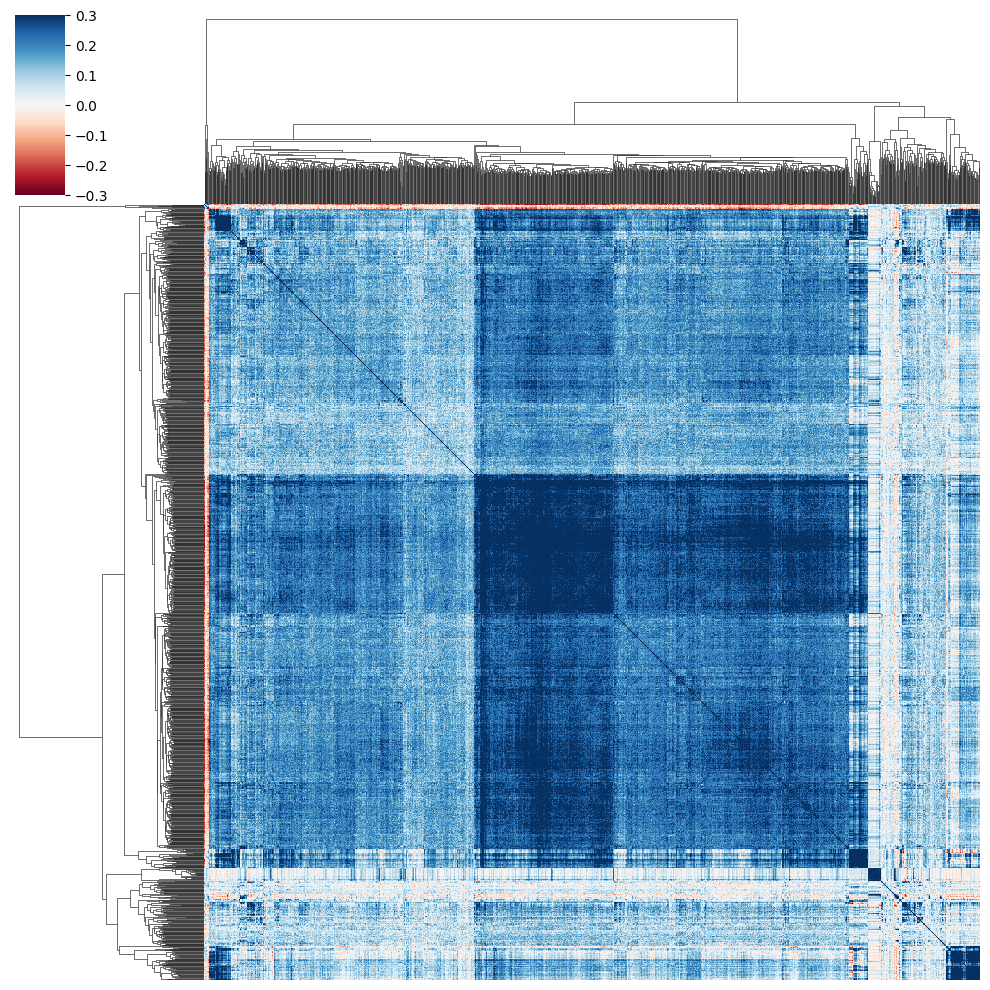

In [4]:
_ = qc2.create_corrmatrix_modified(adata_mde_z_normalized, title="", v_min=-0.3, v_max=0.3)

Compute MDE with Mali lab code 

Computing mean profiles:   0%|          | 0/1354 [00:00<?, ?it/s]

May 06 09:16:18 PM: Fitting a centered embedding into R^2, for a graph with 1354 items and 240011 edges.
May 06 09:16:18 PM: `embed` method parameters: eps=1.0e-05, max_iter=2000, memory_size=10
May 06 09:16:18 PM: iteration 0000 | distortion 2.353748 | residual norm 0.613834 | step length 0.212503 | percent change 0.250664
May 06 09:16:20 PM: iteration 0100 | distortion 0.092765 | residual norm 0.000213546 | step length 1 | percent change 0.58746
May 06 09:16:22 PM: iteration 0200 | distortion 0.090767 | residual norm 8.86987e-05 | step length 1 | percent change 0.227797
May 06 09:16:25 PM: iteration 0300 | distortion 0.089720 | residual norm 3.44217e-05 | step length 1 | percent change 0.109122
May 06 09:16:27 PM: iteration 0400 | distortion 0.089653 | residual norm 1.71654e-05 | step length 1 | percent change 0.0558884
May 06 09:16:30 PM: iteration 0500 | distortion 0.089185 | residual norm 4.36348e-05 | step length 1 | percent change 0.0442993
May 06 09:16:32 PM: iteration 0600 | d

/home/ranwyl/pymde_env/lib64/python3.11/site-packages/seaborn/matrix.py:530: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
/home/ranwyl/pymde_env/lib64/python3.11/site-packages/seaborn/matrix.py:530: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix


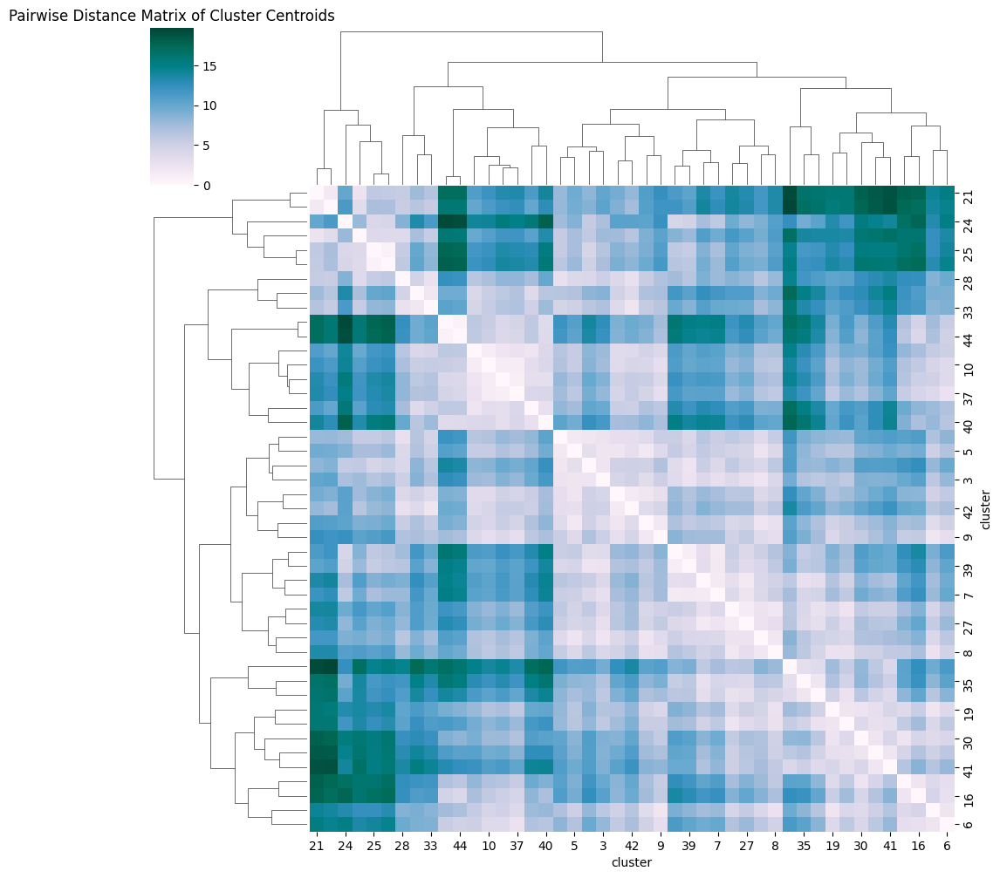

In [4]:
mde_mali = qc2.compute_MDE_2_modified(adata_mde_z_normalized, save=False, spectral=True, leiden_neighbors=8)

In [ ]:
def gene_targets_per_cluster(embedding_df):
    """
    Return DataFrame where each column contains the perturbations in a cluster.
    """
    cluster_nums = max([int(n) for n in set(embedding_df["cluster"].tolist())])
    cluster_dict = dict()
    for i in range(cluster_nums+1):
        cluster = embedding_df[embedding_df["cluster"] == str(i)]["gene_target"].tolist()
        cluster_dict[i] = cluster
    # Pad all columns to be the same length
    max_n_perts = max(len(cluster_dict[i]) for i in range(len(cluster_dict)))
    cluster_dict = {cluster:(perts + [""]*(max_n_perts-len(perts))) for cluster, perts in cluster_dict.items()}
    perts_in_cluster_df = pd.DataFrame(cluster_dict)
    return perts_in_cluster_df

In [8]:
_, _, _, _, embedding_df_mali = mde_mali
perts_in_cluster_mali = gene_targets_per_cluster(embedding_df_mali)
perts_in_cluster_mali.head()

,0,1,2,3,4,5,6,7,8,9,...,35,36,37,38,39,40,41,42,43,44
0,ABHD17A,ANAPC11,ADSL,ACOT8,ANKZF1,AP5B1,ACVR2A,ACBD4,AKTIP,ACCS,...,DPF2,AKAP8L,B3GAT3,FANCM,ABI2,CNMD,AGAP3,BRCC3,ACTMAP,AGPAT2
1,ACIN1,AP1G2,APBB1,AGGF1,ATRX,ART5,ACYP1,AGTRAP,ARHGEF5,ANTKMT,...,ERCC5,AMOTL1,CDX1,HRC,FAM50A,GALNT2,ARHGAP35,CBX2,BRK1,FLYWCH2
2,ALAS1,ARHGDIA,ASCL5,ALPL,AURKC,BCAP31,ANKRD17,ARMCX1,ASF1B,ASH1L,...,FDXR,ARID4B,CITED4,IDI1,FAM111B,KLF1,ARIH1,ENHO,DENND1C,HOXD13
3,AP1S2,BCL2L12,ATOH1,ARL6IP4,CBX3,C2orf69,C3orf52,CANX,AXIN1,ATM,...,HMGB1,HSD17B10,FAM216A,JOSD1,FBXO45,MAPKAPK5,BABAM2,EZH2,ESRP1,IFFO1
4,ARHGEF16,BRDT,ATPSCKMT,ARMC5,CCNJL,CAPRIN2,C5orf34,CCDC51,CAMK2N2,BSX,...,JRKL,IKZF5,GPR107,MARVELD1,IPO9,MED15,ETV1,KCNIP3,ESRRB,NR1D1


Compute pairwise Pearson correlation matrix with TF Project code

In [5]:
def compute_mean_profile(adata, group_indices):
    mean_vector = adata[group_indices, :].X.mean(axis=0)
    return mean_vector.A1 if hasattr(mean_vector, 'A1') else mean_vector

def tf_create_corrmatrix(adata, v_min=-1, v_max=1, color_map="RdBu"):
    gene_target_groups = adata.obs.groupby('gene_target').indices
    adata_mean_profiles = [compute_mean_profile(adata, indices) for indices in gene_target_groups.values()]
    adata_mean_profiles = np.array(adata_mean_profiles)
    corr_matrix = np.corrcoef(adata_mean_profiles)

    # Plot
    gene_target_labels = list(gene_target_groups.keys())
    distance_dataframe = pd.DataFrame(corr_matrix, index=gene_target_labels, columns=gene_target_labels)
    fig = sns.clustermap(distance_dataframe, cmap=color_map, xticklabels=False, yticklabels=False, vmax=v_max, vmin=v_min, center=0)
    fig.ax_heatmap.set_xlabel('')
    fig.ax_heatmap.set_ylabel('');
    return(distance_dataframe, adata_mean_profiles)

/home/ranwyl/pymde_env/lib64/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
/home/ranwyl/pymde_env/lib64/python3.11/site-packages/seaborn/matrix.py:560: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.


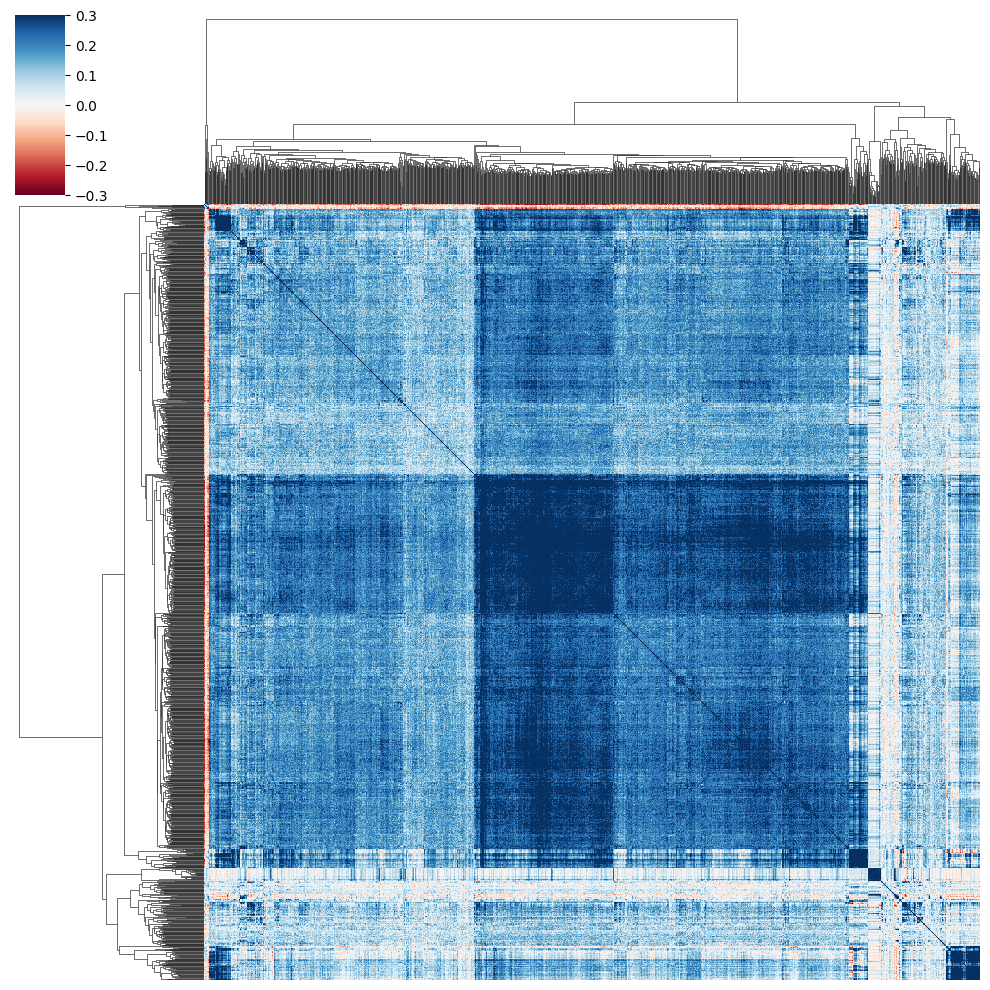

In [6]:
_ = tf_create_corrmatrix(adata_mde_z_normalized, v_min=-0.3, v_max=0.3)

Compute MDE with TF Project code

In [ ]:
def compute_mean_normalized_profile(adata, group_indices):
    mean_vector = adata[group_indices, :].X.mean(axis=0)
    normalized_mean_vector = (mean_vector - np.mean(mean_vector)) / np.std(mean_vector)
    return normalized_mean_vector.A1 if hasattr(normalized_mean_vector, 'A1') else normalized_mean_vector

def tf_compute_MDE(adata, label_points=False, leiden_neighbors=5, preserve='neighbors', spectral=False):
    adata = adata.copy()
    gene_target_groups = adata.obs.groupby('gene_target').indices
    # Changed code to no longer compute mean normalized profiles in parallel -Robin
    mean_profiles = [compute_mean_normalized_profile(adata, indices) for indices in gene_target_groups.values()]
    mean_profiles_array = np.array(mean_profiles)

    # Compute MDE
    pymde.seed(42) # Added by Robin to make pymde.preserve_neighbors() deterministic
    mde = None
    embedding = None
    if preserve == "neighbors":
        if spectral:
            spectral_embedding = SpectralEmbedding(
                n_components=30,  # Ensure this matches the pymde embedding dimension
                affinity='nearest_neighbors',
                n_neighbors=10,
                eigen_solver='arpack',
                random_state=42 # Added by Robin to make sklearn.SpectralEmbedding deterministic
            )
            initial_embedding = spectral_embedding.fit_transform(mean_profiles_array)
            mde = pymde.preserve_neighbors(initial_embedding, repulsive_fraction=15, n_neighbors = 15)
            embedding = mde.embed(max_iter=2000,print_every=100,verbose=True)
        else:
            mde = pymde.preserve_neighbors(mean_profiles_array, repulsive_fraction=15, n_neighbors=5)
            embedding = mde.embed(max_iter=4000,print_every=100,verbose=True)
    else:
        mde = pymde.preserve_distances(mean_profiles_array)
        embedding = mde.embed(max_iter=1000,print_every=100,verbose=True)

    # Run Leiden clustering on the embeddings
    knn_graph = kneighbors_graph(embedding, n_neighbors=leiden_neighbors, include_self=False)
    sources, targets = knn_graph.nonzero()
    g = ig.Graph(directed=False)
    g.add_vertices(embedding.shape[0])
    g.add_edges(zip(sources, targets))
    partition = leidenalg.find_partition(g, leidenalg.RBConfigurationVertexPartition, 
                                         seed=42 # Added by Robin to make leidenalg.find_partition() deterministic
                                         )
    
    # Get cluster labels and make pairwise correlation plot
    clusters = np.array(partition.membership)
    gene_targets = list(gene_target_groups.keys())
    embedding_df = pd.DataFrame(embedding, columns=['x', 'y'])
    embedding_df['gene_target'] = gene_targets
    embedding_df['cluster'] = clusters
    embedding_df['cluster'] = embedding_df['cluster'].astype(str)
    cluster_groups = embedding_df.groupby('cluster')
    centroids = cluster_groups[['x', 'y']].mean()
    pairwise_distances = pd.DataFrame(
        squareform(pdist(centroids, metric='euclidean')),
        index=centroids.index,
        columns=centroids.index
    )
    sns.clustermap(pairwise_distances, cmap='PuBuGn')
    plt.title('Pairwise Distance Matrix of Cluster Centroids')
    plt.show()

    # Plot using Plotly with Pastel colormap for discrete clusters
    fig = px.scatter(embedding_df, x='x', y='y', text='gene_target', color='cluster',
                     hover_data={'x': True, 'y': True, 'gene_target': True},
                     title='MDE Embedding of Mean Normalized Profiles',
                     color_discrete_sequence=px.colors.qualitative.Bold)
    fig.update_traces(marker=dict(size=7,opacity=0.7),textposition='middle center',textfont=dict(size=4))
    
    fig.update_layout(
        showlegend=True,
        xaxis=dict(visible=False),
        yaxis=dict(visible=False),
        plot_bgcolor='white',
        width=1200,  # Increase plot width
        height=1000,  # Increase plot height
        legend_title_text='Cluster',
        coloraxis_showscale=False
    )
    if not label_points: # Added by Robin
        fig.update_traces(text=None)
   
    fig.show()
    
    return adata, embedding, clusters, mean_profiles_array, embedding_df

May 06 09:18:25 PM: Fitting a centered embedding into R^2, for a graph with 1354 items and 239841 edges.
May 06 09:18:25 PM: `embed` method parameters: eps=1.0e-05, max_iter=2000, memory_size=10
May 06 09:18:25 PM: iteration 0000 | distortion 2.350794 | residual norm 0.625013 | step length 0.0385656 | percent change 0.0463197
May 06 09:18:27 PM: iteration 0100 | distortion 0.093333 | residual norm 0.000208969 | step length 1 | percent change 0.452277
May 06 09:18:29 PM: iteration 0200 | distortion 0.090344 | residual norm 0.000111357 | step length 1 | percent change 0.321186
May 06 09:18:31 PM: iteration 0300 | distortion 0.089290 | residual norm 8.77215e-05 | step length 1 | percent change 0.117083
May 06 09:18:36 PM: iteration 0400 | distortion 0.088953 | residual norm 3.40251e-05 | step length 1 | percent change 0.246663
May 06 09:18:39 PM: iteration 0500 | distortion 0.088744 | residual norm 3.94579e-05 | step length 1 | percent change 0.114244
May 06 09:18:41 PM: iteration 0600 | 

/home/ranwyl/pymde_env/lib64/python3.11/site-packages/seaborn/matrix.py:530: ClusterWarning:

scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix

/home/ranwyl/pymde_env/lib64/python3.11/site-packages/seaborn/matrix.py:530: ClusterWarning:

scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix



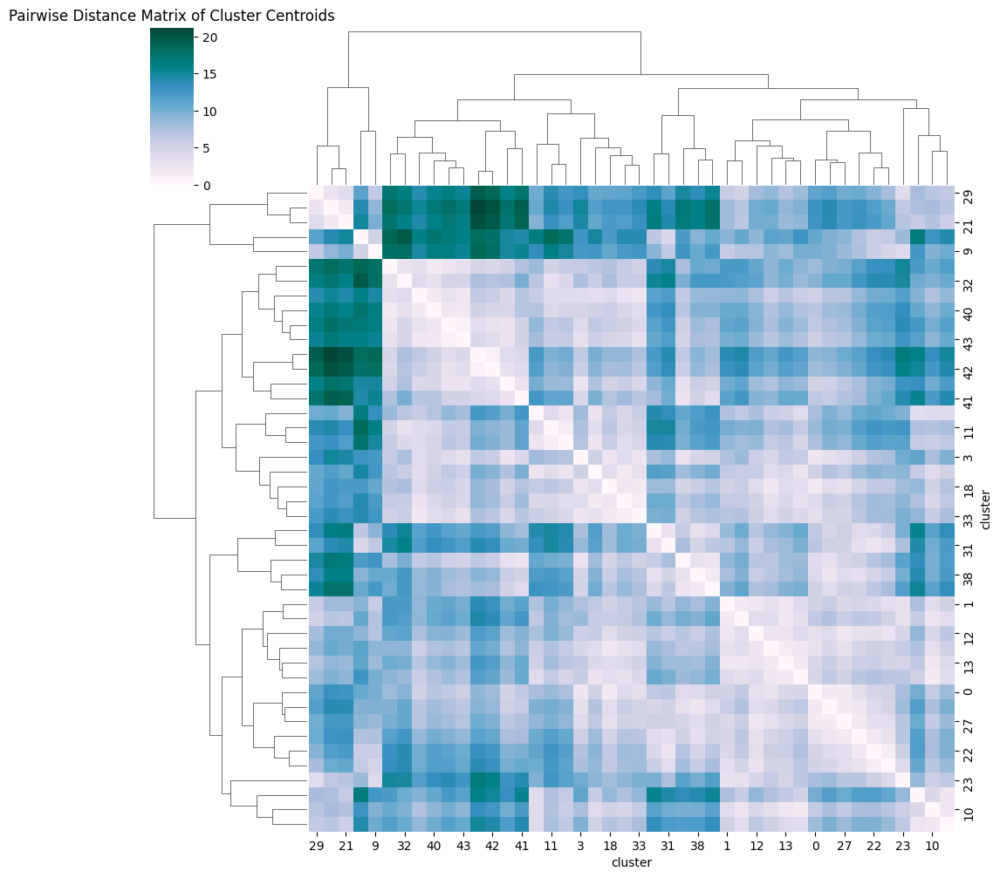

In [9]:
mde_mali_tf_code = tf_compute_MDE(adata_mde_z_normalized, label_points=False, spectral=True, leiden_neighbors=8)

In [10]:
_, _, _, _, embedding_df_mali_tf_code = mde_mali_tf_code
perts_in_cluster_mali_tf_code = gene_targets_per_cluster(embedding_df_mali_tf_code)
perts_in_cluster_mali_tf_code.head()

,0,1,2,3,4,5,6,7,8,9,...,34,35,36,37,38,39,40,41,42,43
0,ABHD17A,ACOT8,BHLHA9,ADSL,AGBL5,ANKZF1,ACYP1,ABCD4,AAAS,AKAP8L,...,DPF2,FANCM,ASB13,BTAF1,ACTB,AGAP3,ACVR2A,GALNT2,AGPAT2,ASF1A
1,ACIN1,AGGF1,BRDT,APBB1,AKAP12,ATRX,AGFG2,ADO,ABI2,ALKBH1,...,FDXR,HRC,CAPN1,CNOT2,AHSP,ARHGAP35,ANKRD17,KLF1,FLYWCH2,ATG9B
2,ALAS1,AGMAT,C12orf29,ASCL5,AP5B1,AURKC,C3orf52,AGTRAP,ACTG1,AMOTL1,...,HMGB1,IDI1,CHGB,DPH2,AK2,ARIH1,C5orf34,MED15,HOXD13,BRPF1
3,AP1S2,ANXA5,CCNO,ATOH1,BCAP31,CABLES2,CCER2,AK1,ACTN1,APELA,...,KMT2D,JOSD1,EIF2AK4,DR1,BBS10,BABAM2,DCAF12L2,MED19,IFFO1,FUBP1
4,ARHGEF16,APOL2,CHST1,ATPSCKMT,BRICD5,CBX3,CDK8,ARMCX5,ADAM19,ARF3,...,NKX6-2,MARVELD1,GALNS,DRAP1,CAPZB,ETV1,EXT2,MED24,NR1D1,KAT2A


In [36]:
n_perts_in_cluster_mali_tf_code = perts_in_cluster_mali_tf_code.nunique().tolist()
print(n_perts_in_cluster_mali_tf_code)

[72, 69, 69, 69, 56, 55, 51, 50, 47, 44, 43, 37, 36, 35, 35, 34, 32, 30, 30, 28, 28, 27, 27, 25, 25, 25, 25, 25, 24, 22, 22, 20, 19, 18, 17, 17, 16, 15, 15, 14, 13, 13, 12, 11]


In [11]:
def cluster_df_to_dict(df):
    """
    Turn a DataFrame where each column represents a KO cluster into a dict
    {cluster number: [KOs in cluster]}.
    """
    cluster_dict = {col: df[col].tolist() for col in df.columns}
    return cluster_dict

In [12]:
cluster_dict_mali = cluster_df_to_dict(perts_in_cluster_mali)
cluster_dict_mali_tf_code = cluster_df_to_dict(perts_in_cluster_mali_tf_code)

In [13]:
def compare_cluster_dicts(dict1, dict1_name, dict2, dict2_name):
    """
    Compare each KO cluster in dict1 to each KO cluster in dict2 using Jaccard similarity. 
    Output two DataFrames, one recording the Jaccard similarity
    and one recording the size of the set intersection between the two clusters.
    """
    jaccard_array = np.zeros((len(dict1), len(dict2)))
    intersection_array = np.zeros((len(dict1), len(dict2)), dtype=int)
    for i, perts1 in sorted(dict1.items()):
        set1 = set(perts1)
        for j, perts2 in sorted(dict2.items()):
            set2 = set(perts2)
            # Compute Jaccard index
            intersection = len(set1.intersection(set2))
            union = len(set1.union(set2))
            jaccard_array[i, j] = round(intersection/union, 3)
            # Record intersection
            intersection_array[i, j] = intersection
    # Create DataFrame
    row_names = [f"{dict1_name}_CL_{i}" for i in range(len(dict1))]
    col_names = [f"{dict2_name}_CL_{j}" for j in range(len(dict2))]
    jaccard_df = pd.DataFrame(jaccard_array, columns=col_names, index=row_names)
    intersection_df = pd.DataFrame(intersection_array, columns=col_names, index=row_names)
    return jaccard_df, intersection_df

In [14]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

In [22]:
jaccard_comparison, intersection_comparison = \
    compare_cluster_dicts(cluster_dict_mali, "Study", cluster_dict_mali_tf_code, "TFCode")

In [16]:
def cluster_heatmap(cluster_comparison_df, jaccard, rows_name, cols_name, title, color_map="crest"):
    row_names = [i for i in range(cluster_comparison_df.shape[0])]
    col_names = [j for j in range(cluster_comparison_df.shape[1])]
    df = pd.DataFrame(cluster_comparison_df.values, columns=col_names, index=row_names)
    if jaccard:
        ax = sns.heatmap(df, vmin=0, vmax=1, cmap=color_map)
    else:
        ax = sns.heatmap(df, cmap=color_map)
    ax.set_ylabel(rows_name)
    ax.set_xlabel(cols_name)
    ax.set_title(title)

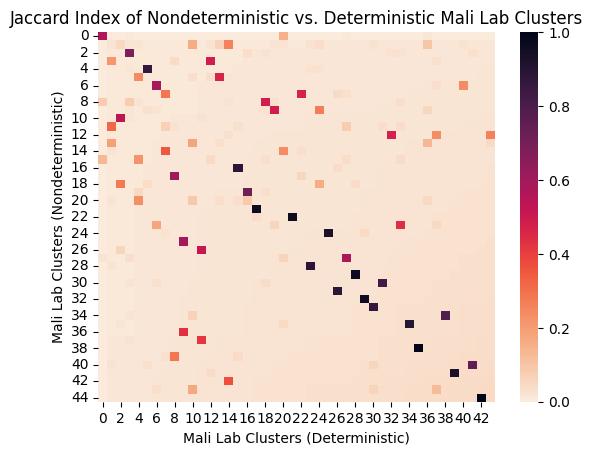

In [19]:
p = cluster_heatmap(jaccard_comparison, jaccard=True,
    rows_name="Mali Lab Clusters (Nondeterministic)", cols_name="Mali Lab Clusters (Deterministic)",
    title="Jaccard Index of Nondeterministic vs. Deterministic Mali Lab Clusters", color_map="rocket_r")

This heatmap compares the clusters found with the Mali lab code (that uses nondeterministic methods which lead to different cluster membership each time the code is run) to the clusters found with my TF project code (which uses seeds to make these methods deterministic, so cluster membership is the same each time the code is run). 

It seems like most of the nondeterministic clusters have a deterministic cluster match, but not all of them.

In [24]:
perts_in_cluster_mali_tf_code.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43
0,ABHD17A,ACOT8,BHLHA9,ADSL,AGBL5,ANKZF1,ACYP1,ABCD4,AAAS,AKAP8L,AKAP17A,B3GAT3,ALPL,ART5,ARHGDIA,ARHGEF12,APOBEC3D,COQ4,ADAMTS15,ANTKMT,AP1G2,BOD1L1,ACBD4,BCL2L12,ACCS,BLOC1S2,ABCF1,APCDD1L,CREBBP,C1QBP,ACTMAP,ACLY,ATMIN,ASB7,DPF2,FANCM,ASB13,BTAF1,ACTB,AGAP3,ACVR2A,GALNT2,AGPAT2,ASF1A
1,ACIN1,AGGF1,BRDT,APBB1,AKAP12,ATRX,AGFG2,ADO,ABI2,ALKBH1,ANAPC11,CDX1,ARL6IP4,BTBD10,BRCC3,CASP6,ATP5MC1,GADD45GIP1,AKTIP,ATM,C6orf120,CYB5RL,ARMCX1,CD276,ASH1L,COX7B,APAF1,CAND2,CSNK2B,MRPL12,CBFB,CCNQ,BABAM1,BARX1,FDXR,HRC,CAPN1,CNOT2,AHSP,ARHGAP35,ANKRD17,KLF1,FLYWCH2,ATG9B
2,ALAS1,AGMAT,C12orf29,ASCL5,AP5B1,AURKC,C3orf52,AGTRAP,ACTG1,AMOTL1,ARRDC1,CITED4,ATP5MC2,CHAD,CBX2,CCDC6,CHCHD2,GFM1,ARHGEF5,CCNB3,CIZ1,DDX28,BARHL1,COIL,BSX,ECSIT,ASPHD1,CDCA7,DBR1,MRPS5,CLNS1A,CKS1B,CABIN1,CACUL1,HMGB1,IDI1,CHGB,DPH2,AK2,ARIH1,C5orf34,MED15,HOXD13,BRPF1
3,AP1S2,ANXA5,CCNO,ATOH1,BCAP31,CABLES2,CCER2,AK1,ACTN1,APELA,BRK1,DTX3L,CCN2,CHDH,DOT1L,CDH2,CIR1,GRSF1,ASF1B,CGAS,DHCR7,GATB,CCDC51,CRISPLD1,CREBL2,FAM120AOS,BAX,CNIH1,DOHH,MRPS7,EBF2,CMTR1,CHAMP1,CENPB,KMT2D,JOSD1,EIF2AK4,DR1,BBS10,BABAM2,DCAF12L2,MED19,IFFO1,FUBP1
4,ARHGEF16,APOL2,CHST1,ATPSCKMT,BRICD5,CBX3,CDK8,ARMCX5,ADAM19,ARF3,CBLL1,FAM91A1,CGB7,COPS9,EI24,CRELD1,COA6,MRPL10,AXIN1,CHRNA9,ECE2,LARS2,CCDC78,DEPDC1B,ERI2,FLCN,CASP3,COQ7,EP300,MRPS9,EMC8,CNOT7,CUL1,COG7,NKX6-2,MARVELD1,GALNS,DRAP1,CAPZB,ETV1,EXT2,MED24,NR1D1,KAT2A


In [28]:
# List of 1639 TFs from Lambert et al (2018)
lambert_csv = pd.read_csv("Lambert_2018_TFs.csv")
tfs = lambert_csv[lambert_csv.iloc[:,3] == "Yes"].iloc[:,1].tolist()
tfs = set(tfs)

def tf_ko_per_cluster_df(perts_in_cluster_df):
    tf_ko_dict = dict()
    # Get TF KOs in each column
    for i, col in perts_in_cluster_df.items():
        col_perts = col.tolist()
        tf_kos = [pert for pert in col_perts if pert in tfs]
        tf_ko_dict[i] = tf_kos
    # Pad each column to same length
    max_col_len = max([len(val) for val in tf_ko_dict.values()])
    for i, col in tf_ko_dict.items():
        tf_ko_dict[i] += ([""]*(max_col_len - len(col)))
    tf_ko_df = pd.DataFrame(tf_ko_dict)
    return tf_ko_df

In [29]:
tf_kos_in_cluster_mali_tf_code = tf_ko_per_cluster_df(perts_in_cluster_mali_tf_code)

In [30]:
display(tf_kos_in_cluster_mali_tf_code)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43
0,FOXK1,,BHLHA9,ASCL5,DMRT2,ANKZF1,E2F4,CREM,ELK1,AKAP8L,CREB3L4,CDX1,ZNF583,ZNF705D,CBX2,DLX4,HLF,MTERF4,MXD1,ESR1,FOXD4L5,MTERF3,BARHL1,GRHL2,ASH1L,,,ZNF706,LIN28B,,EBF2,SOX4,ATMIN,BARX1,NKX6-2,PHF20,ZBTB42,DR1,,ARHGAP35,,KLF1,HOXD13,ZNF253
1,GATA5,,DUXA,ATOH1,NFIL3,CSRNP2,ETS1,FOXK2,,IKZF5,ESRRB,NFKB2,,,DOT1L,SETDB1,SALL4,,NEUROG3,FOXJ2,NME2,ZBTB41,,THAP12,BSX,,,,,,GTF2IRD1,ZNF219,CHAMP1,CENPB,SP1,POU3F2,ZNF549,DRAP1,,ETV1,,NANOG,NR1D1,
2,MSANTD4,,ESR2,ESRRA,ZNF16,FOXA1,FOXH1,ZNF563,,TCF7L2,L3MBTL4,POU4F3,,,ETV5,ZNF205,SNAI1,,THAP8,HES7,SRF,,,USF2,CREBL2,,,,,,SNAPC5,,DNMT1,GTF2I,,POU5F1,,,,HHEX,,NANOGP8,RBPJ,
3,NOTO,,ETS2,FOXE3,ZNF735,GATAD2A,POU2F1,,,ZNF44,PATZ1,TCF3,,,KCNIP3,ZNF408,TBPL1,,ZBTB22,MTF2,ZNF510,,,,FOSB,,,,,,ZNF383,,JUNB,ZNF200,,POU5F1B,,,,,,PRDM14,TCF12,
4,NR0B1,,ISL1,GLIS3,,HNF1B,SMAD4,,,,,ZBTB34,,,NFXL1,,ZNF614,,ZNF75D,NKX2-4,,,,,FOXS1,,,,,,ZNF420,,PITX3,ZNF326,,,,,,,,PURG,ZNF396,
5,THRA,,JRKL,HES6,,MITF,TCF7L1,,,,,ZNF462,,,NR1I3,,ZNF683,,ZNF268,NR4A3,,,,,HDX,,,,,,,,VDR,,,,,,,,,ZNF423,ZNF521,
6,TIGD6,,MEOX2,IRX5,,NANOGNB,ZNF552,,,,,ZNF572,,,PKNOX2,,,,ZNF354A,THAP7,,,,,OSR2,,,,,,,,,,,,,,,,,,,
7,ZFP30,,ONECUT2,MAFG,,NEUROD4,ZNF783,,,,,ZNF616,,,SOX12,,,,,ZNF461,,,,,PCGF6,,,,,,,,,,,,,,,,,,,
8,ZNF32,,PA2G4,NR3C2,,PHF1,,,,,,ZNF660,,,THAP5,,,,,,,,,,PLSCR1,,,,,,,,,,,,,,,,,,,
9,,,PROX2,PRDM12,,PPARD,,,,,,ZNF732,,,,,,,,,,,,,POU3F3,,,,,,,,,,,,,,,,,,,


In [31]:
tf_kos_in_cluster_mali_tf_code.to_csv("/home/ranwyl/results_tf_project/mali_lab_tf_ko_clusters_deterministic.csv")

In [32]:
tf_kos_in_cluster_mali = tf_ko_per_cluster_df(perts_in_cluster_mali)

In [33]:
display(tf_kos_in_cluster_mali)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44
0,FOXD4L5,CREB3L4,ASCL5,ELK1,ANKZF1,ZNF705D,ETS1,,ESRRA,ASH1L,BHLHA9,,ATMIN,ZNF549,BARHL1,ZFP30,DLX4,,CREBL2,SALL4,DMRT2,MTERF4,MTERF3,BARX1,,TCF7L2,NFKB2,ZNF395,GRHL2,LIN28B,SOX4,,,EBF2,,JRKL,AKAP8L,CDX1,PHF20,,KLF1,ARHGAP35,CBX2,ESRRB,HOXD13
1,FOXK1,ETV5,ATOH1,ZNF583,CSRNP2,,FOXH1,,MSANTD4,BSX,PROX2,,CHAMP1,,CREM,,SETDB1,,DUXA,SNAI1,ZNF16,,ZBTB41,E2F4,,ZNF44,ONECUT2,ZNF706,THAP12,,ZNF75D,,,GTF2IRD1,,NKX6-2,IKZF5,NR3C2,POU3F2,,NANOG,ETV1,KCNIP3,,NR1D1
2,GATA5,L3MBTL4,CENPB,,FOXA1,,,,NEUROG3,ESR1,SHOX,,DNMT1,,FOXK2,,ZNF205,,ESR2,TBPL1,ZNF735,,,GTF2I,,,PA2G4,,USF2,,ZNF219,,,SNAPC5,,SP1,,ZNF462,POU5F1,,NANOGNB,HHEX,NFXL1,,RBPJ
3,NR0B1,NR1I3,FOXE3,,GATAD2A,,,,NFIL3,FOSB,SRY,,DOT1L,,NME2,,ZNF408,,ETS2,ZNF614,,,,MTF2,,,POU4F3,,,,,,,ZNF383,,,,ZNF660,POU5F1B,,NANOGP8,,PKNOX2,,TCF12
4,SRF,PATZ1,GLIS3,,HNF1B,,,,NOTO,FOXJ2,TMF1,,DR1,,ZNF563,,,,ISL1,,,,,POU2F1,,,TCF3,,,,,,,ZNF420,,,,,,,PRDM14,,THAP5,,ZNF396
5,THRA,SOX12,HES6,,NEUROD4,,,,SCX,FOXS1,TSC22D1,,DRAP1,,,,,,MEOX2,,,,,SMAD4,,,ZBTB34,,,,,,,,,,,,,,PURG,,,,ZNF521
6,TIGD6,ZBTB42,HLF,,PHF1,,,,THAP8,HDX,ZBTB33,,JUNB,,,,,,MITF,,,,,TCF7L1,,,ZNF572,,,,,,,,,,,,,,ZNF423,,,,
7,ZNF32,ZNF573,IRX5,,PPARD,,,,ZBTB22,HES7,ZHX1,,PITX3,,,,,,OSR2,,,,,ZNF200,,,ZNF616,,,,,,,,,,,,,,,,,,
8,ZNF510,,MAFG,,PRDM8,,,,ZFP41,MXD1,ZNF48,,VDR,,,,,,ZFP69B,,,,,ZNF326,,,ZNF732,,,,,,,,,,,,,,,,,,
9,,,PRDM12,,SETDB2,,,,ZNF268,NKX2-4,ZNF256,,ZNF253,,,,,,ZNF267,,,,,ZNF552,,,ZNF888,,,,,,,,,,,,,,,,,,


In [34]:
tf_kos_in_cluster_mali.to_csv("/home/ranwyl/results_tf_project/mali_lab_tf_ko_clusters_nondeterministic.csv")

In [37]:
tf_ko_cluster_dict_mali = cluster_df_to_dict(tf_kos_in_cluster_mali)
tf_ko_cluster_dict_mali_tf_code = cluster_df_to_dict(tf_kos_in_cluster_mali_tf_code)
tf_jaccard_comparison, tf_intersection_comparison = \
    compare_cluster_dicts(tf_ko_cluster_dict_mali, "Study", tf_ko_cluster_dict_mali_tf_code, "TFCode")

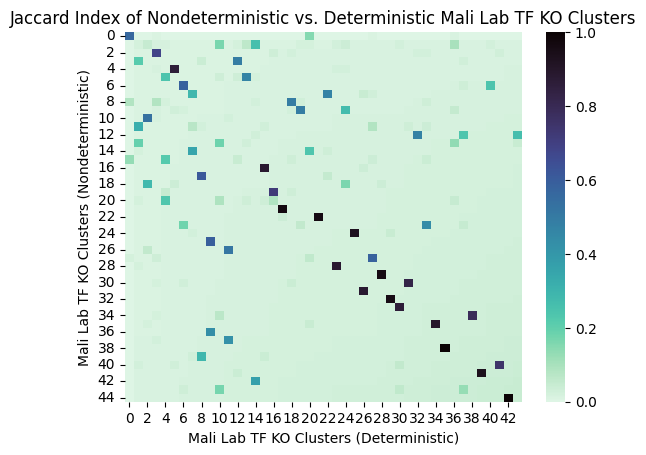

In [38]:
p = cluster_heatmap(jaccard_comparison, jaccard=True,
    rows_name="Mali Lab TF KO Clusters (Nondeterministic)", cols_name="Mali Lab TF KO Clusters (Deterministic)",
    title="Jaccard Index of Nondeterministic vs. Deterministic Mali Lab TF KO Clusters", color_map="mako_r")

# Running pipeline steps G and H on TF KO and NTC dataset

### Differential expression analysis on TF KO and NTC dataset

Differential expression analysis functions

In [ ]:
def tf_run_deseq2_analysis(adata, n_jobs, gene_target_obs_column="gene_target", ntc_cells_delimiter="NTC", 
                                      n_replicates=3, sample_fraction=0.7, layer=None, alpha=0.05):
    ntc_cells = np.where(adata.obs[gene_target_obs_column] == ntc_cells_delimiter)[0]
    gene_targets = list(adata.obs[gene_target_obs_column].unique())
    gene_targets.remove(ntc_cells_delimiter)  # Remove the control group

    def process_gene_target(gene_target):
        pseudo_bulk_df, metadata_df = qc2.generate_pseudo_bulk_replicates_for_de(
            adata, gene_target, ntc_cells, n_replicates=n_replicates, sample_fraction=sample_fraction, layer=layer
        )
        return qc2.deseq2(pseudo_bulk_df, metadata_df, contrast=["condition", gene_target, ntc_cells_delimiter], alpha=alpha)

    with tqdm_joblib(desc="Running DE analysis", total=len(gene_targets)):
        results = Parallel(n_jobs=n_jobs)(delayed(process_gene_target)(gene_target) for gene_target in gene_targets)
    
    results_dict = dict(zip(gene_targets, results))
    
    return results_dict

def tf_save_DEG_df(results_dict, p_threshold=0.05, save=True, filepath=None):
    # Initialize a dictionary to store columns for the final DataFrame
    final_dict = {}

    for gene_target, df in results_dict.items():
        # Filter the DataFrame based on the padj (adjusted p-value) threshold
        filtered_df = df[df['padj'] < p_threshold]

        # Sort by L2FC
        l2fc_sorted = filtered_df.sort_values('log2FoldChange')
        
        # Create columns for DEGs, L2FC, and Adj_P and add them to the final_dict
        final_dict[f'{gene_target}_DEGs'] = l2fc_sorted.index.tolist()
        final_dict[f'{gene_target}_L2FC'] = l2fc_sorted['log2FoldChange'].tolist()
        final_dict[f'{gene_target}_Adj_P'] = l2fc_sorted['padj'].tolist()

    # Group keys by gene target to maintain adjacency
    gene_targets = list(results_dict.keys())
    
    # Sort the gene targets by the number of DEGs
    sorted_gene_targets = sorted(gene_targets, key=lambda gt: len(final_dict[f'{gt}_DEGs']), reverse=True)
    
    # Reorder the final_dict to keep DEGs, L2FC, and Adj_P together for each gene target
    ordered_dict = {}
    for gene_target in sorted_gene_targets:
        ordered_dict[f'{gene_target}_DEGs'] = final_dict[f'{gene_target}_DEGs']
        ordered_dict[f'{gene_target}_L2FC'] = final_dict[f'{gene_target}_L2FC']
        ordered_dict[f'{gene_target}_Adj_P'] = final_dict[f'{gene_target}_Adj_P']

    # Find the maximum length of lists in the ordered_dict to handle unequal lengths
    max_length = max(len(lst) for lst in ordered_dict.values())

    # Pad shorter lists with None to ensure equal length columns
    for key in ordered_dict:
        ordered_dict[key].extend([None] * (max_length - len(ordered_dict[key])))

    # Create the final DataFrame directly from the dictionary
    combined_df = pd.DataFrame(ordered_dict)

    if save and filepath:
        with pd.ExcelWriter(filepath) as writer:
            combined_df.to_excel(writer, sheet_name='DEG Results', index=False)

TF set

In [ ]:
# List of 1639 TFs from Lambert et al (2018)
lambert_csv = pd.read_csv("Lambert_2018_TFs.csv")
tfs = lambert_csv[lambert_csv.iloc[:,3] == "Yes"].iloc[:,1].tolist()
tfs = set(tfs)

Function to filter TF KO and NTC cells

In [ ]:
def filter_tf_ko_and_ntc(adata):
    return adata[(adata.obs["gene_target"].isin(tfs)) | (adata.obs["gene_target"] == "NTC")].copy()

For each batch, subset TF KO and NTC cells and perform differential expression analysis

In [ ]:
adata_alpha = ad.read_h5ad("/home/ranwyl/data_tf_project/Aggregate_ALPHA_Core_Cells.h5ad")
adata_alpha = filter_tf_ko_and_ntc(adata_alpha)

In [ ]:
adata_alpha

AnnData object with n_obs × n_vars = 45429 × 37567
    obs: 'gRNA', 'n_gRNA', 'n_gRNA_UMIs', 'gene_target', 'celltype', 'perturbation_type', 'n_UMI_counts', 'n_genes', 'perturbed', 'channel', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'run', 'gene_target_ensembl_id', 'gene_target_expression (CPM)', 'NTC_target_gene_expression (CPM)', 'target_knockdown', 'target_knockdown_z_score', 'ed_category', 'anomaly_score'
    var: 'gene_ids', 'feature_types', 'n_UMI_counts', 'n_cells', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'mean', 'std', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: '

In [ ]:
adata_alpha.X = adata_alpha.layers["counts"].copy()
results_dict_alpha = tf_run_deseq2_analysis(adata_alpha, 20)

Running DE analysis:   0%|          | 0/643 [00:00<?, ?it/s]

/home/ranwyl/pymde_env/lib64/python3.11/site-packages/pydeseq2/dds.py:804: UserWarning: The dispersion trend curve fitting did not converge. Switching to a mean-based dispersion trend.
/home/ranwyl/pymde_env/lib64/python3.11/site-packages/pydeseq2/dds.py:804: UserWarning: The dispersion trend curve fitting did not converge. Switching to a mean-based dispersion trend.
/home/ranwyl/pymde_env/lib64/python3.11/site-packages/pydeseq2/dds.py:804: UserWarning: The dispersion trend curve fitting did not converge. Switching to a mean-based dispersion trend.
/home/ranwyl/pymde_env/lib64/python3.11/site-packages/pydeseq2/dds.py:804: UserWarning: The dispersion trend curve fitting did not converge. Switching to a mean-based dispersion trend.
/home/ranwyl/pymde_env/lib64/python3.11/site-packages/pydeseq2/dds.py:804: UserWarning: The dispersion trend curve fitting did not converge. Switching to a mean-based dispersion trend.


In [ ]:
alpha_filepath = "/home/ranwyl/results_tf_project/TF_KO_NTC_ALPHA_DEGs.xlsx"
tf_save_DEG_df(results_dict_alpha, filepath=alpha_filepath)

In [ ]:
adata_beta = ad.read_h5ad("/home/ranwyl/data_tf_project/Aggregate_BETA_Core_Cells.h5ad")
adata_beta = filter_tf_ko_and_ntc(adata_beta)
adata_beta.X = adata_beta.layers["counts"].copy()
results_dict_beta = tf_run_deseq2_analysis(adata_beta, 25)

Running DE analysis:   0%|          | 0/8 [00:00<?, ?it/s]

In [ ]:
beta_filepath = "/home/ranwyl/results_tf_project/TF_KO_NTC_BETA_DEGs.xlsx"
tf_save_DEG_df(results_dict_beta, filepath=beta_filepath)

In [ ]:
adata_gamma = ad.read_h5ad("/home/ranwyl/data_tf_project/Aggregate_GAMMA_Core_Cells.h5ad")
adata_gamma = filter_tf_ko_and_ntc(adata_gamma)
adata_gamma.X = adata_gamma.layers["counts"].copy()
results_dict_gamma = tf_run_deseq2_analysis(adata_gamma, 25)

Running DE analysis:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
gamma_filepath = "/home/ranwyl/results_tf_project/TF_KO_NTC_GAMMA_DEGs.xlsx"
tf_save_DEG_df(results_dict_gamma, filepath=gamma_filepath)

Combine all differential expression analysis results into one spreadsheet

In [ ]:
alpha_degs = pd.read_excel("/home/ranwyl/results_tf_project/ALPHA_DEGs.xlsx")
beta_degs = pd.read_excel("/home/ranwyl/results_tf_project/BETA_DEGs.xlsx")
gamma_degs = pd.read_excel("/home/ranwyl/results_tf_project/GAMMA_DEGs.xlsx")

In [ ]:
def combine_deg_spreadsheets(alpha_degs_df, beta_degs_df, gamma_degs_df, deg_cutoff=0):
    """
    Combine the 3 DEG spreadsheets without applying a threshold for the minimum number of DEGs per perturbation.
    """
    combined_degs = pd.concat([alpha_degs_df, beta_degs_df, gamma_degs_df],axis=1)

    # Step 1: Identify the _DEGs columns
    deg_columns = [col for col in combined_degs.columns if '_DEGs' in col]

    # Step 2: Count the non-NaN values in each _DEGs column
    non_nan_counts = combined_degs[deg_columns].notna().sum()

    # Step 3: Skip DEG filter step
    valid_deg_columns = non_nan_counts[non_nan_counts >= deg_cutoff].index.tolist()

    # Step 4: Sort the remaining _DEGs columns based on the count
    sorted_deg_columns = non_nan_counts.loc[valid_deg_columns].sort_values(ascending=False).index.tolist()

    # Step 5: Rearrange the DataFrame keeping the valid three adjacent columns together
    sorted_columns = []
    for deg_col in sorted_deg_columns:
        # Identify the corresponding L2FC and Adj_P columns
        base_name = deg_col.replace('_DEGs', '')
        l2fc_col = f'{base_name}_L2FC'
        adj_p_col = f'{base_name}_Adj_P'
        
        # Add these columns to the sorted list
        sorted_columns.extend([deg_col, l2fc_col, adj_p_col])

    # Rearrange the DataFrame with only the valid columns
    filtered_combined_degs = combined_degs[sorted_columns]
    return filtered_combined_degs

In [ ]:
all_degs = combine_deg_spreadsheets(alpha_degs, beta_degs, gamma_degs)

In [ ]:
all_degs.to_excel("/home/ranwyl/results_tf_project/TF_KO_NTC_Aggregate_DEGs.xlsx")

Check for any duplicates/formatting issues

In [ ]:
deg_df = pd.read_excel("/home/ranwyl/results_tf_project/TF_KO_NTC_Aggregate_DEGs.xlsx", index_col=0)
deg_df

,POU5F1_DEGs,POU5F1_L2FC,POU5F1_Adj_P,MYADM_DEGs,MYADM_L2FC,MYADM_Adj_P,DBR1_DEGs,DBR1_L2FC,DBR1_Adj_P,PHF20_DEGs,...,NID2_Adj_P,GLO1_DEGs,GLO1_L2FC,GLO1_Adj_P,NMUR1_DEGs,NMUR1_L2FC,NMUR1_Adj_P,ADAM33_DEGs,ADAM33_L2FC,ADAM33_Adj_P
0,DGKB,-6.076206,0.020763,TMEM220-AS1,-5.864895,0.026192,LMO3,-4.732414,0.017708,SLC22A23,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,AP3B2,-5.457997,0.046913,ST6GAL2,-5.740117,0.031954,TMEM220-AS1,-4.144787,0.004143,ATG101,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,TRNP1,-5.160944,0.004823,ENSG00000233290,-5.040239,0.018569,ZMYM3,-3.650721,0.002669,ORAI1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,ENSG00000259048,-5.015852,0.000079,TRIM56,-5.013357,0.006675,ENSG00000289084,-3.543780,0.000107,SUCLG1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,SYNPO2,-4.207629,0.040667,TMEM158,-4.394789,0.025331,SRRM4,-3.528674,0.028472,ZNF581,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1833,ENSG00000254202,8.638068,0.000195,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1834,DLX5,8.798191,0.000137,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1835,MEIS2,9.215727,0.000053,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1836,DLK1,9.618622,0.000020,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
duplicate_entries = deg_df.loc[:, deg_df.columns.str.contains(".", regex=False)].copy() # Duplicate perturbations have "." in the gene name
duplicate_entries

,CTAGE15_DEGs.1,CTAGE15_L2FC.1,CTAGE15_Adj_P.1,CTAGE15_DEGs.2,CTAGE15_DEGs.3,CTAGE15_L2FC.2,CTAGE15_L2FC.3,CTAGE15_Adj_P.2,CTAGE15_Adj_P.3,CTAGE15_DEGs.4,...,ERV3-1_L2FC.28,ERV3-1_L2FC.29,ERV3-1_Adj_P.28,ERV3-1_Adj_P.29,ERV3-1_DEGs.30,ERV3-1_DEGs.31,ERV3-1_L2FC.30,ERV3-1_L2FC.31,ERV3-1_Adj_P.30,ERV3-1_Adj_P.31
0,NaN,NaN,NaN,KRAS,NaN,-0.736635,NaN,0.025886,NaN,KRAS,...,-0.824814,NaN,0.019086,NaN,NME2,NaN,-0.824814,NaN,0.019086,NaN
1,NaN,NaN,NaN,PAFAH1B1,NaN,-0.649359,NaN,0.042101,NaN,PAFAH1B1,...,-0.589213,NaN,0.029787,NaN,RPS11,NaN,-0.589213,NaN,0.029787,NaN
2,NaN,NaN,NaN,ABI2,NaN,-0.621081,NaN,0.036694,NaN,ABI2,...,0.937632,NaN,0.042274,NaN,GALNT17,NaN,0.937632,NaN,0.042274,NaN
3,NaN,NaN,NaN,PABPN1,NaN,-0.463132,NaN,0.046703,NaN,PABPN1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,NaN,NaN,NaN,RPL38,NaN,-0.333667,NaN,0.025886,NaN,RPL38,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1833,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1834,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1835,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1836,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Get names of all duplicate perturbations

In [ ]:
duplicate_pert_cols = list(duplicate_entries.columns)
duplicate_perts = {duplicate_pert_cols[i].split("_")[0] for i in range(len(duplicate_pert_cols))}
print(duplicate_perts)

{'ERV3-1', 'CTAGE15', 'SLX1A'}


Remove duplicate entries

In [ ]:
deg_df_no_duplicates = deg_df.drop(duplicate_pert_cols, axis=1)

Check that only one entry remains for each duplicate perturbation

In [ ]:
deg_df_no_duplicates.loc[:, deg_df_no_duplicates.columns.str.contains("ERV3-1")]

,ERV3-1_DEGs,ERV3-1_L2FC,ERV3-1_Adj_P
0,NME2,-0.824814,0.019086
1,RPS11,-0.589213,0.029787
2,GALNT17,0.937632,0.042274
3,NaN,NaN,NaN
4,NaN,NaN,NaN
...,...,...,...
1833,NaN,NaN,NaN
1834,NaN,NaN,NaN
1835,NaN,NaN,NaN
1836,NaN,NaN,NaN


In [ ]:
deg_df_no_duplicates.loc[:, deg_df_no_duplicates.columns.str.contains("CTAGE15")]

,CTAGE15_DEGs,CTAGE15_L2FC,CTAGE15_Adj_P
0,KRAS,-0.736635,0.025886
1,PAFAH1B1,-0.649359,0.042101
2,ABI2,-0.621081,0.036694
3,PABPN1,-0.463132,0.046703
4,RPL38,-0.333667,0.025886
...,...,...,...
1833,NaN,NaN,NaN
1834,NaN,NaN,NaN
1835,NaN,NaN,NaN
1836,NaN,NaN,NaN


In [ ]:
deg_df_no_duplicates.loc[:, deg_df_no_duplicates.columns.str.contains("SLX1A")]

,SLX1A_DEGs,SLX1A_L2FC,SLX1A_Adj_P
0,NaN,NaN,NaN
1,NaN,NaN,NaN
2,NaN,NaN,NaN
3,NaN,NaN,NaN
4,NaN,NaN,NaN
...,...,...,...
1833,NaN,NaN,NaN
1834,NaN,NaN,NaN
1835,NaN,NaN,NaN
1836,NaN,NaN,NaN


Save final version

In [ ]:
deg_df_no_duplicates.to_excel("/home/ranwyl/results_tf_project/TF_KO_NTC_Aggregate_DEGs.xlsx")

### Batch correction on TF KO dataset

Read in data and TF set

In [ ]:
adata_alpha = ad.read_h5ad("/home/ranwyl/data_tf_project/Aggregate_ALPHA_Core_Cells.h5ad")
adata_beta = ad.read_h5ad("/home/ranwyl/data_tf_project/Aggregate_BETA_Core_Cells.h5ad")
adata_gamma = ad.read_h5ad("/home/ranwyl/data_tf_project/Aggregate_GAMMA_Core_Cells.h5ad")

In [ ]:
# List of 1639 TFs from Lambert et al (2018)
lambert_csv = pd.read_csv("Lambert_2018_TFs.csv")
tfs = lambert_csv[lambert_csv.iloc[:,3] == "Yes"].iloc[:,1].tolist()
tfs = set(tfs)

Filter TF KO and NTC cells

In [ ]:
def filter_tf_ko_and_ntc(adata):
    return adata[(adata.obs["gene_target"].isin(tfs)) | (adata.obs["gene_target"] == "NTC")].copy()

In [ ]:
adata_alpha_filtered = filter_tf_ko_and_ntc(adata_alpha)
adata_beta_filtered = filter_tf_ko_and_ntc(adata_beta)
adata_gamma_filtered = filter_tf_ko_and_ntc(adata_gamma)

Concatenate

In [ ]:
adata_combined = ad.concat([adata_alpha_filtered, adata_beta_filtered, adata_gamma_filtered])
adata_combined.X = adata_combined.layers["counts"].copy()

Preprocessing

In [ ]:
median_NTC_UMIs = np.median(qc2._get_ntc_view(adata_combined).obs.n_UMI_counts)
sc.pp.normalize_total(adata_combined, target_sum=median_NTC_UMIs)

normalizing counts per cell
    finished (0:00:00)


Batch correction

In [ ]:
sc.pp.log1p(adata_combined)
a = adata_combined[adata_combined.obs.run == 'ALPHA'].copy()
b = adata_combined[adata_combined.obs.run == 'BETA'].copy()
c = adata_combined[adata_combined.obs.run == 'GAMMA'].copy()

In [ ]:
qc2.relative_z_normalization(a)
qc2.relative_z_normalization(b)
qc2.relative_z_normalization(c)
normalized_adata = ad.concat([a,b,c])

In [ ]:
normalized_adata.write("/home/ranwyl/data_tf_project/Aggregate_TF_KO_NTC_Batch_Normalized.h5ad")

In [ ]:
normalized_adata

AnnData object with n_obs × n_vars = 69241 × 37567
    obs: 'gRNA', 'n_gRNA', 'n_gRNA_UMIs', 'gene_target', 'celltype', 'perturbation_type', 'n_UMI_counts', 'n_genes', 'perturbed', 'channel', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'run', 'gene_target_ensembl_id', 'gene_target_expression (CPM)', 'NTC_target_gene_expression (CPM)', 'target_knockdown', 'target_knockdown_z_score', 'ed_category', 'anomaly_score'
    obsm: 'X_pca'
    layers: 'counts', 'normalized_counts', 'pre_z_normalization'

# (OLD - didn't filter lowly expressed genes) Rerun differential expression analysis (DEA) on TF KO and NTC dataset for downstream analysis 5/2025

The DE results will be used for pre-ranked GSEA, so DEA must be run with LFC shrinkage and with all results saved (not just DEGs with p-adj > 0.05). The following revised code was tested in the `tf_project_testing` notebook.

In [ ]:
# List of 1639 TFs from Lambert et al (2018)
lambert_csv = pd.read_csv("Lambert_2018_TFs.csv")
tfs = lambert_csv[lambert_csv.iloc[:,3] == "Yes"].iloc[:,1].tolist()
tfs = set(tfs)

# Function to filter TF KO and NTC cells
def filter_tf_ko_and_ntc(adata):
    return adata[(adata.obs["gene_target"].isin(tfs)) | (adata.obs["gene_target"] == "NTC")].copy()

def pre_DE_analysis(adata):
    """
    Prepare dataset for differential expression analysis using PyDESeq2.
    """
    # Filter TF KO and NTC cells
    adata = filter_tf_ko_and_ntc(adata)
    # Reset adata.X to raw counts
    adata.X = adata.layers["counts"].copy()
    return adata

In [ ]:
def tf_pseudo_bulk_replicates_for_DE(adata, gene_target, ntc_cells, n_replicates=3, sample_fraction=0.85, layer=None):
    """
    Generate pseudo-bulk replicates for a given gene target and matched NTC cells. 
    Modified to manually set NTC as reference for differential expression analysis.
    """
    data_matrix = adata.layers[layer] if layer else adata.X
    target_indices = np.where(adata.obs['gene_target'] == gene_target)[0]
    n_target = len(target_indices)
    target_bulk = []
    ntc_bulk = []
    sample_names = []
    control_names = []

    for i in range(n_replicates):
        # Sample from gene_target
        sampled_target_indices = np.random.choice(target_indices, int(n_target * sample_fraction), replace=False)
        target_profile = data_matrix[sampled_target_indices].sum(axis=0)
        target_bulk.append(target_profile)
        sample_names.append(f"{gene_target}_rep_{i+1}")

        # Sample from NTC
        sampled_ntc_indices = np.random.choice(ntc_cells, int(n_target * sample_fraction), replace=False)
        ntc_profile = data_matrix[sampled_ntc_indices].sum(axis=0)
        ntc_bulk.append(ntc_profile)
        control_names.append(f"NTC_rep_{i+1}")
    
    # Convert to DataFrame
    sample_names.extend(control_names)
    # Build counts DataFrame
    pseudo_bulk_df = pd.DataFrame(np.vstack(target_bulk + ntc_bulk), index=sample_names, columns=adata.var_names)
    pseudo_bulk_df = pseudo_bulk_df[pseudo_bulk_df.columns[pseudo_bulk_df.sum(axis=0)>=1]] #Remove any samples with 0s in both NTC and Perturbed Sample
    # Build metadata DataFrame
    metadata_records = [{'condition': sample.split('_')[0]} for sample in sample_names]
    metadata_df = pd.DataFrame(metadata_records, index=sample_names)
    # Set NTC as reference
    metadata_df["condition"] = pd.Categorical(
        metadata_df["condition"],
        categories=["NTC", gene_target],
        ordered=True
        )

    return pseudo_bulk_df, metadata_df


def tf_deseq2(data, metadata, contrast, alpha=0.05, n_cpus=8):
    """
    Run differential expression analysis on a single gene target using PyDESeq2.
    """
    inference = DefaultInference(n_cpus=n_cpus) # Only use n_cpus CPUs
    
    # Read counts modeling and fitting dispersions
    dds = DeseqDataSet(
        counts = data, 
        metadata = metadata, 
        design="~condition",
        refit_cooks=True,
        inference=inference,
        quiet=True
        )
    dds.deseq2()
    
    # Statistical testing
    stat_res = DeseqStats(
        dds, 
        contrast=contrast, 
        alpha=alpha,
        inference=inference,
        quiet=True)
    stat_res.summary()
    # Shrink LFCs for downstream analysis
    stat_res.lfc_shrink(coeff=f"condition[T.{contrast[1]}]") 
    results = stat_res.results_df
    return results


def tf_run_deseq2_analysis(adata, n_cpus=8, gene_target_obs_column="gene_target", ntc_cells_delimiter="NTC", 
                            n_replicates=3, sample_fraction=0.85, layer=None, alpha=0.05):
    """
    Run differential expression analysis on each gene target in the dataset.
    """
    ntc_cells = np.where(adata.obs[gene_target_obs_column] == ntc_cells_delimiter)[0]
    gene_targets = list(adata.obs[gene_target_obs_column].unique())
    gene_targets.remove(ntc_cells_delimiter)  # Remove the control group

    def process_gene_target(gene_target):
        pseudo_bulk_df, metadata_df = tf_pseudo_bulk_replicates_for_DE(
            adata, gene_target, ntc_cells, n_replicates=n_replicates, 
            sample_fraction=sample_fraction, layer=layer
        )
        return tf_deseq2(
            pseudo_bulk_df, 
            metadata_df, 
            contrast=["condition", gene_target, ntc_cells_delimiter], 
            alpha=alpha,
            n_cpus=n_cpus)

    with tqdm_joblib(desc="Running DE analysis", total=len(gene_targets)):
        results = Parallel(n_jobs=n_cpus)(delayed(process_gene_target)(gene_target) for gene_target in gene_targets)
    
    results_dict = dict(zip(gene_targets, results))
    
    return results_dict

def tf_save_DE_df(results_dict):
    df_list = list()
    for gene_target, df in results_dict.items():
        df = df.sort_index() # Sort genes alphabetically
        # Prepend TF KO name to each column label
        new_col_names = {col: f"{gene_target}_{col}" for col in df}
        df = df.rename(columns=new_col_names)
        df_list.append(df)
    # Concatenate all DE result DataFrames (using intersection of genes)
    de_df = pd.concat(df_list, axis=1)
    de_df = de_df.sort_index() # Sort genes alphabetically
    return de_df

## Run DEA with lfc_shrink(adapt=False)

In [ ]:
def tf_pseudo_bulk_replicates_for_DE(adata, gene_target, ntc_cells, n_replicates=3, sample_fraction=0.85, layer=None):
    """
    Generate pseudo-bulk replicates for a given gene target and matched NTC cells. 
    Modified to manually set NTC as reference for differential expression analysis.
    """
    data_matrix = adata.layers[layer] if layer else adata.X
    target_indices = np.where(adata.obs['gene_target'] == gene_target)[0]
    n_target = len(target_indices)
    target_bulk = []
    ntc_bulk = []
    sample_names = []
    control_names = []

    for i in range(n_replicates):
        # Sample from gene_target
        sampled_target_indices = np.random.choice(target_indices, int(n_target * sample_fraction), replace=False)
        target_profile = data_matrix[sampled_target_indices].sum(axis=0)
        target_bulk.append(target_profile)
        sample_names.append(f"{gene_target}_rep_{i+1}")

        # Sample from NTC
        sampled_ntc_indices = np.random.choice(ntc_cells, int(n_target * sample_fraction), replace=False)
        ntc_profile = data_matrix[sampled_ntc_indices].sum(axis=0)
        ntc_bulk.append(ntc_profile)
        control_names.append(f"NTC_rep_{i+1}")
    
    # Convert to DataFrame
    sample_names.extend(control_names)
    # Build counts DataFrame
    pseudo_bulk_df = pd.DataFrame(np.vstack(target_bulk + ntc_bulk), index=sample_names, columns=adata.var_names)
    pseudo_bulk_df = pseudo_bulk_df[pseudo_bulk_df.columns[pseudo_bulk_df.sum(axis=0)>=1]] #Remove any samples with 0s in both NTC and Perturbed Sample
    # Build metadata DataFrame
    metadata_records = [{'condition': sample.split('_')[0]} for sample in sample_names]
    metadata_df = pd.DataFrame(metadata_records, index=sample_names)
    # Set NTC as reference
    metadata_df["condition"] = pd.Categorical(
        metadata_df["condition"],
        categories=["NTC", gene_target],
        ordered=True
        )

    return pseudo_bulk_df, metadata_df


def tf_deseq2(data, metadata, contrast, alpha=0.05, n_cpus=8):
    """
    Run differential expression analysis on a single gene target using PyDESeq2.
    """
    inference = DefaultInference(n_cpus=n_cpus) # Only use n_cpus CPUs
    
    # Read counts modeling and fitting dispersions
    dds = DeseqDataSet(
        counts = data, 
        metadata = metadata, 
        design="~condition",
        refit_cooks=True,
        inference=inference,
        quiet=True
        )
    dds.deseq2()
    
    # Statistical testing
    stat_res = DeseqStats(
        dds, 
        contrast=contrast, 
        alpha=alpha,
        inference=inference,
        quiet=True)
    stat_res.summary()
    # Shrink LFCs for downstream analysis
    stat_res.lfc_shrink(coeff=f"condition[T.{contrast[1]}]", adapt=False) 
    results = stat_res.results_df
    return results


def tf_run_deseq2_analysis(adata, n_cpus=8, gene_target_obs_column="gene_target", ntc_cells_delimiter="NTC", 
                            n_replicates=3, sample_fraction=0.85, layer=None, alpha=0.05):
    """
    Run differential expression analysis on each gene target in the dataset.
    """
    ntc_cells = np.where(adata.obs[gene_target_obs_column] == ntc_cells_delimiter)[0]
    gene_targets = list(adata.obs[gene_target_obs_column].unique())
    gene_targets.remove(ntc_cells_delimiter)  # Remove the control group

    def process_gene_target(gene_target):
        pseudo_bulk_df, metadata_df = tf_pseudo_bulk_replicates_for_DE(
            adata, gene_target, ntc_cells, n_replicates=n_replicates, 
            sample_fraction=sample_fraction, layer=layer
        )
        return tf_deseq2(
            pseudo_bulk_df, 
            metadata_df, 
            contrast=["condition", gene_target, ntc_cells_delimiter], 
            alpha=alpha,
            n_cpus=n_cpus)

    with tqdm_joblib(desc="Running DE analysis", total=len(gene_targets)):
        results = Parallel(n_jobs=n_cpus)(delayed(process_gene_target)(gene_target) for gene_target in gene_targets)
    
    results_dict = dict(zip(gene_targets, results))
    
    return results_dict

def tf_save_DE_df(results_dict):
    df_list = list()
    for gene_target, df in results_dict.items():
        df = df.sort_index() # Sort genes alphabetically
        # Prepend TF KO name to each column label
        new_col_names = {col: f"{gene_target}_{col}" for col in df}
        df = df.rename(columns=new_col_names)
        df_list.append(df)
    # Concatenate all DE result DataFrames (using intersection of genes)
    de_df = pd.concat(df_list, axis=1)
    de_df = de_df.sort_index() # Sort genes alphabetically
    return de_df

In [ ]:
adata_alpha = ad.read_h5ad("/home/ranwyl/data_tf_project/Aggregate_ALPHA_Core_Cells.h5ad")
adata_alpha = pre_DE_analysis(adata_alpha)

In [ ]:
results_dict_alpha = tf_run_deseq2_analysis(adata_alpha, n_cpus=24)

Running DE analysis:   0%|          | 0/643 [00:00<?, ?it/s]

/home/ranwyl/pymde_env/lib64/python3.11/site-packages/pydeseq2/dds.py:804: UserWarning: The dispersion trend curve fitting did not converge. Switching to a mean-based dispersion trend.
  self._fit_parametric_dispersion_trend(vst)
/home/ranwyl/pymde_env/lib64/python3.11/site-packages/pydeseq2/dds.py:804: UserWarning: The dispersion trend curve fitting did not converge. Switching to a mean-based dispersion trend.
  self._fit_parametric_dispersion_trend(vst)
/home/ranwyl/pymde_env/lib64/python3.11/site-packages/pydeseq2/dds.py:804: UserWarning: The dispersion trend curve fitting did not converge. Switching to a mean-based dispersion trend.
  self._fit_parametric_dispersion_trend(vst)
/home/ranwyl/pymde_env/lib64/python3.11/site-packages/pydeseq2/dds.py:804: UserWarning: The dispersion trend curve fitting did not converge. Switching to a mean-based dispersion trend.
  self._fit_parametric_dispersion_trend(vst)
/home/ranwyl/pymde_env/lib64/python3.11/site-packages/pydeseq2/dds.py:804: UserW

In [ ]:
alpha_DE_df = tf_save_DE_df(results_dict_alpha)

In [ ]:
adata_beta = ad.read_h5ad("/home/ranwyl/data_tf_project/Aggregate_BETA_Core_Cells.h5ad")
adata_beta = pre_DE_analysis(adata_beta)
results_dict_beta = tf_run_deseq2_analysis(adata_beta, n_cpus=24)
beta_DE_df = tf_save_DE_df(results_dict_beta)

Running DE analysis:   0%|          | 0/8 [00:00<?, ?it/s]

/home/ranwyl/pymde_env/lib64/python3.11/site-packages/pydeseq2/dds.py:804: UserWarning: The dispersion trend curve fitting did not converge. Switching to a mean-based dispersion trend.
  self._fit_parametric_dispersion_trend(vst)


In [ ]:
adata_gamma = ad.read_h5ad("/home/ranwyl/data_tf_project/Aggregate_GAMMA_Core_Cells.h5ad")
adata_gamma = pre_DE_analysis(adata_gamma)
results_dict_gamma = tf_run_deseq2_analysis(adata_gamma, n_cpus=24)
gamma_DE_df = tf_save_DE_df(results_dict_gamma)

Running DE analysis:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
aggregate_DE_df = pd.concat([alpha_DE_df, beta_DE_df, gamma_DE_df], axis=1)
aggregate_DE_df = aggregate_DE_df.sort_index()

In [ ]:
filepath_pkl = "/home/ranwyl/results_tf_project/TF_KO_NTC_DE_results_final.pkl"
aggregate_DE_df.to_pickle(filepath_pkl)

Note: file was renamed "TF_KO_NTC_DE_results_shrunk_adaptFalse.pkl"

### Rename genes listed by Ensembl ID with p-adj < 0.05

In [ ]:
de_results = pd.read_pickle("/home/ranwyl/results_tf_project/TF_KO_NTC_DE_results_final.pkl")
# Note: the above file was renamed "TF_KO_NTC_DE_results_shrunk_adaptFalse.pkl"
de_results

,DMRT2_baseMean,DMRT2_log2FoldChange,DMRT2_lfcSE,DMRT2_stat,DMRT2_pvalue,DMRT2_padj,OSR2_baseMean,OSR2_log2FoldChange,OSR2_lfcSE,OSR2_stat,...,ZBED6_lfcSE,ZBED6_stat,ZBED6_pvalue,ZBED6_padj,FAM200B_baseMean,FAM200B_log2FoldChange,FAM200B_lfcSE,FAM200B_stat,FAM200B_pvalue,FAM200B_padj
A1BG,5.197361,0.603388,0.610262,1.249251,0.211573,NaN,3.271476,-0.219247,0.719732,-0.436204,...,0.928560,-1.333630,0.182325,0.937090,3.431164,-0.557770,0.756780,-1.045982,0.295569,0.943485
A1BG-AS1,2.117718,0.544581,0.911720,0.986719,0.323780,NaN,0.659727,-0.021330,1.140542,-0.048274,...,1.246887,-0.863337,0.387952,0.937090,0.627773,-0.762906,1.404104,-1.112549,0.265902,0.943485
A1CF,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
A2M,0.349860,-0.390388,1.225741,-0.692164,0.488835,NaN,0.826464,-0.187075,1.073352,-0.401825,...,1.930966,1.844563,0.065101,0.937090,0.643332,0.025018,1.154267,0.060363,0.951867,0.979964
A2M-AS1,0.311871,0.340470,1.828676,0.582373,0.560315,NaN,0.976668,0.678086,1.342768,1.186024,...,1.135588,-0.197266,0.843620,0.937090,0.823219,0.181208,1.157592,0.401337,0.688172,0.943485
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZYG11B,16.388837,0.142245,0.343832,0.448989,0.653440,NaN,11.752263,0.006335,0.420150,0.015429,...,0.528945,1.291485,0.196536,0.937090,16.320781,-0.207652,0.371043,-0.616998,0.537236,0.943485
ZYX,21.191806,0.216751,0.369794,0.644994,0.518931,NaN,15.210018,0.632165,0.390773,1.787083,...,0.617423,-0.192321,0.847491,0.939522,19.662778,0.057214,0.347965,0.177552,0.859075,0.957807
ZZEF1,5.948701,-0.097954,0.543078,-0.223904,0.822832,NaN,6.672568,0.815502,0.579438,1.709801,...,0.726426,0.322776,0.746865,0.937090,6.877744,0.193642,0.556144,0.430629,0.666738,0.943485
ZZZ3,27.979420,-0.261921,0.300329,-0.930788,0.351963,NaN,19.023791,-0.428162,0.341578,-1.356265,...,0.409508,1.147076,0.251350,0.937090,30.839801,0.247434,0.280118,0.932054,0.351309,0.943485


In [ ]:
# Generate list of genes with padj < 0.05 listed by Ensembl ID
def get_ensembl_id_padj_degs(de_df, padj_threshold=0.05):
    perts = {col.split("_")[0] for col in de_df.columns}
    padj_deg_set = set()
    for pert in perts:
        padj_col = f"{pert}_padj"
        padj_deg_set.update(de_df.loc[de_df[padj_col] < padj_threshold].index)
    ensembl_deg_list = [gene for gene in padj_deg_set if "ENSG" in gene]
    return ensembl_deg_list

In [ ]:
ensembl_degs = get_ensembl_id_padj_degs(de_results)
print(len(ensembl_degs))

260


In [ ]:
# Write out list of Ensembl IDs
with open("/home/ranwyl/results_tf_project/5-7-25_ensembl_degs.txt", "w") as f:
    for deg in ensembl_degs:
        f.write(f"{deg}\n")

Used Ensembl Biomart to convert Ensembl IDs to gene names

In [ ]:
# Read in Ensembl Biomart output file
ensembl_to_name = pd.read_csv("/home/ranwyl/results_tf_project/5-7-25_ensembl_to_gene_name.csv", header=0)
ensembl_to_name.head()

,Gene stable ID,Gene name
0,ENSG00000189229,NaN
1,ENSG00000197462,NaN
2,ENSG00000197585,NaN
3,ENSG00000203279,NaN
4,ENSG00000219445,NaN


In [ ]:
# Rename genes in DataFrame from Ensembl ID to gene name
def rename_ensembl_genes(de_df, id_name_df):
    ids_with_names = id_name_df[id_name_df["Gene name"].notna()]
    id_to_name_list = ids_with_names.to_dict("split")["data"]
    id_to_name_dict = {item[0]: item[1] for item in id_to_name_list}
    de_df_renamed = de_df.rename(index=id_to_name_dict)
    print(f"Converted {len(id_to_name_dict)} Ensembl IDs to gene names")
    return de_df_renamed

Rename rows

In [ ]:
de_results = rename_ensembl_genes(de_results, ensembl_to_name)

Converted 8 Ensembl IDs to gene names


In [ ]:
de_results

,DMRT2_baseMean,DMRT2_log2FoldChange,DMRT2_lfcSE,DMRT2_stat,DMRT2_pvalue,DMRT2_padj,OSR2_baseMean,OSR2_log2FoldChange,OSR2_lfcSE,OSR2_stat,...,ZBED6_lfcSE,ZBED6_stat,ZBED6_pvalue,ZBED6_padj,FAM200B_baseMean,FAM200B_log2FoldChange,FAM200B_lfcSE,FAM200B_stat,FAM200B_pvalue,FAM200B_padj
A1BG,5.197361,0.603388,0.610262,1.249251,0.211573,NaN,3.271476,-0.219247,0.719732,-0.436204,...,0.928560,-1.333630,0.182325,0.937090,3.431164,-0.557770,0.756780,-1.045982,0.295569,0.943485
A1BG-AS1,2.117718,0.544581,0.911720,0.986719,0.323780,NaN,0.659727,-0.021330,1.140542,-0.048274,...,1.246887,-0.863337,0.387952,0.937090,0.627773,-0.762906,1.404104,-1.112549,0.265902,0.943485
A1CF,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
A2M,0.349860,-0.390388,1.225741,-0.692164,0.488835,NaN,0.826464,-0.187075,1.073352,-0.401825,...,1.930966,1.844563,0.065101,0.937090,0.643332,0.025018,1.154267,0.060363,0.951867,0.979964
A2M-AS1,0.311871,0.340470,1.828676,0.582373,0.560315,NaN,0.976668,0.678086,1.342768,1.186024,...,1.135588,-0.197266,0.843620,0.937090,0.823219,0.181208,1.157592,0.401337,0.688172,0.943485
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZYG11B,16.388837,0.142245,0.343832,0.448989,0.653440,NaN,11.752263,0.006335,0.420150,0.015429,...,0.528945,1.291485,0.196536,0.937090,16.320781,-0.207652,0.371043,-0.616998,0.537236,0.943485
ZYX,21.191806,0.216751,0.369794,0.644994,0.518931,NaN,15.210018,0.632165,0.390773,1.787083,...,0.617423,-0.192321,0.847491,0.939522,19.662778,0.057214,0.347965,0.177552,0.859075,0.957807
ZZEF1,5.948701,-0.097954,0.543078,-0.223904,0.822832,NaN,6.672568,0.815502,0.579438,1.709801,...,0.726426,0.322776,0.746865,0.937090,6.877744,0.193642,0.556144,0.430629,0.666738,0.943485
ZZZ3,27.979420,-0.261921,0.300329,-0.930788,0.351963,NaN,19.023791,-0.428162,0.341578,-1.356265,...,0.409508,1.147076,0.251350,0.937090,30.839801,0.247434,0.280118,0.932054,0.351309,0.943485


Rename hsa-mir-1253

In [ ]:
de_results = de_results.rename(index={"hsa-mir-1253": "MIR1253"})
de_results = de_results.sort_index()
de_results

,DMRT2_baseMean,DMRT2_log2FoldChange,DMRT2_lfcSE,DMRT2_stat,DMRT2_pvalue,DMRT2_padj,OSR2_baseMean,OSR2_log2FoldChange,OSR2_lfcSE,OSR2_stat,...,ZBED6_lfcSE,ZBED6_stat,ZBED6_pvalue,ZBED6_padj,FAM200B_baseMean,FAM200B_log2FoldChange,FAM200B_lfcSE,FAM200B_stat,FAM200B_pvalue,FAM200B_padj
A1BG,5.197361,0.603388,0.610262,1.249251,0.211573,NaN,3.271476,-0.219247,0.719732,-0.436204,...,0.928560,-1.333630,0.182325,0.937090,3.431164,-0.557770,0.756780,-1.045982,0.295569,0.943485
A1BG-AS1,2.117718,0.544581,0.911720,0.986719,0.323780,NaN,0.659727,-0.021330,1.140542,-0.048274,...,1.246887,-0.863337,0.387952,0.937090,0.627773,-0.762906,1.404104,-1.112549,0.265902,0.943485
A1CF,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
A2M,0.349860,-0.390388,1.225741,-0.692164,0.488835,NaN,0.826464,-0.187075,1.073352,-0.401825,...,1.930966,1.844563,0.065101,0.937090,0.643332,0.025018,1.154267,0.060363,0.951867,0.979964
A2M-AS1,0.311871,0.340470,1.828676,0.582373,0.560315,NaN,0.976668,0.678086,1.342768,1.186024,...,1.135588,-0.197266,0.843620,0.937090,0.823219,0.181208,1.157592,0.401337,0.688172,0.943485
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
ZYG11A,2.281155,-0.062909,0.818718,-0.124417,0.900985,NaN,0.821861,-0.266226,1.104904,-0.863539,...,1.015584,0.093510,0.925499,0.976460,0.983446,-0.264999,1.061158,-0.557942,0.576884,0.943485
ZYG11B,16.388837,0.142245,0.343832,0.448989,0.653440,NaN,11.752263,0.006335,0.420150,0.015429,...,0.528945,1.291485,0.196536,0.937090,16.320781,-0.207652,0.371043,-0.616998,0.537236,0.943485
ZYX,21.191806,0.216751,0.369794,0.644994,0.518931,NaN,15.210018,0.632165,0.390773,1.787083,...,0.617423,-0.192321,0.847491,0.939522,19.662778,0.057214,0.347965,0.177552,0.859075,0.957807
ZZEF1,5.948701,-0.097954,0.543078,-0.223904,0.822832,NaN,6.672568,0.815502,0.579438,1.709801,...,0.726426,0.322776,0.746865,0.937090,6.877744,0.193642,0.556144,0.430629,0.666738,0.943485


Write out results

In [ ]:
de_results.to_pickle("/home/ranwyl/results_tf_project/TF_KO_NTC_DE_results.pkl")

# Running pipeline steps E-F without cells per KO threshold

In [6]:
# List of 1639 TFs from Lambert et al (2018)
lambert_csv = pd.read_csv("Lambert_2018_TFs.csv")
tfs = lambert_csv[lambert_csv.iloc[:,3] == "Yes"].iloc[:,1].tolist()
tfs = set(tfs)

# Function to filter TF KO and NTC cells
def filter_tf_ko_and_ntc(adata):
    return adata[(adata.obs["gene_target"].isin(tfs)) | (adata.obs["gene_target"] == "NTC")].copy()

In [12]:
# Function to plot cells per TF KO histogram
def plot_cells_per_tf_ko(cells_per_tf_ko_value_counts, bin_width=25, x_label=None, ymax=None,
                         xmin=None, xmax=None, title=None):
    ax = sns.histplot(cells_per_tf_ko_value_counts.values, binwidth=bin_width)
    if x_label == None:
        x_label = "Cells per TF KO"
    if xmin and xmax:
        ax.set_xlim(xmin, xmax)
    if ymax:
        ax.set_ylim(0, ymax)
    ax.set_xlabel(x_label, fontsize=13)
    ax.set_ylabel("Count", fontsize=13)
    ax.tick_params(axis='both', which='major', labelsize=12)
    ax.bar_label(ax.containers[0], fontsize=12, rotation=90, padding=5)
    if title:
        ax.set_title(title, fontsize=14)

## Without >= 25 cells per sgRNA or >= 25 cells per KO threshold

Note: Don't actually do this - the 25 cells per sgRNA is needed because each sgRNA is downsampled to 25 cells during energy distance statistical testing to see if cells are successfully perturbed or not.

**Step E**

Batch ALPHA

In [3]:
adata_alpha_full = ad.read_h5ad("/home/ranwyl/data_tf_project/Aggregate_ALPHA.h5ad")
adata_alpha_full

AnnData object with n_obs × n_vars = 901828 × 37567
    obs: 'gRNA', 'n_gRNA', 'n_gRNA_UMIs', 'gene_target', 'celltype', 'perturbation_type', 'n_UMI_counts', 'n_genes', 'perturbed', 'channel', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'run', 'gene_target_ensembl_id'
    var: 'gene_ids', 'feature_types', 'n_UMI_counts', 'n_cells', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    layers: 'counts'

In [4]:
adata_alpha = filter_tf_ko_and_ntc(adata_alpha_full)
adata_alpha

AnnData object with n_obs × n_vars = 434228 × 37567
    obs: 'gRNA', 'n_gRNA', 'n_gRNA_UMIs', 'gene_target', 'celltype', 'perturbation_type', 'n_UMI_counts', 'n_genes', 'perturbed', 'channel', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'run', 'gene_target_ensembl_id'
    var: 'gene_ids', 'feature_types', 'n_UMI_counts', 'n_cells', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    layers: 'counts'

In [5]:
del adata_alpha_full
gc.collect()

7467

normalizing counts per cell
    finished (0:00:05)
3468 out of 4998 (69.39%) non-NTC sgRNAs have more than 30% knockdown.


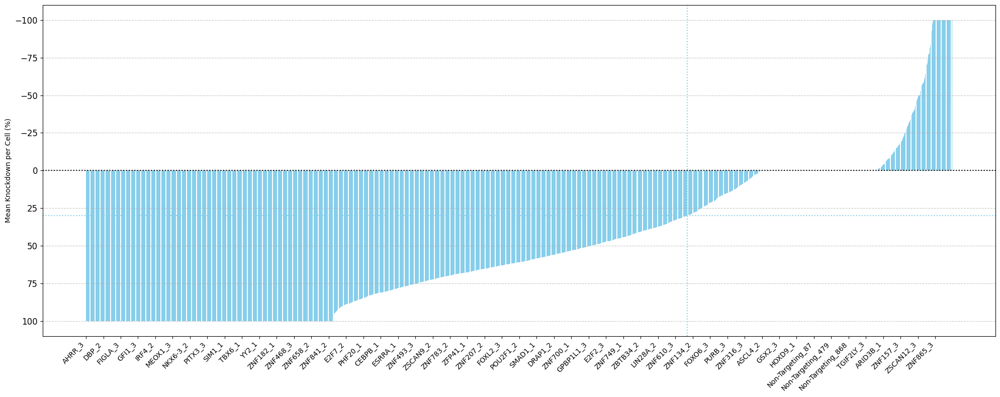

Removing 1294 perturbing sgRNA for not having more than 30% knockdown
Before filter: 4998,perturbed
True     420120
False     14108
Name: count, dtype: int64
After filter: 3704,perturbed
True     306176
False     14108
Name: count, dtype: int64
Removing 12975 perturbed cells for not having any measureable repression.
Before filter: 3704,perturbed
True     306176
False     14108
Name: count, dtype: int64
After filter: 3704,perturbed
True     293201
False     14108
Name: count, dtype: int64


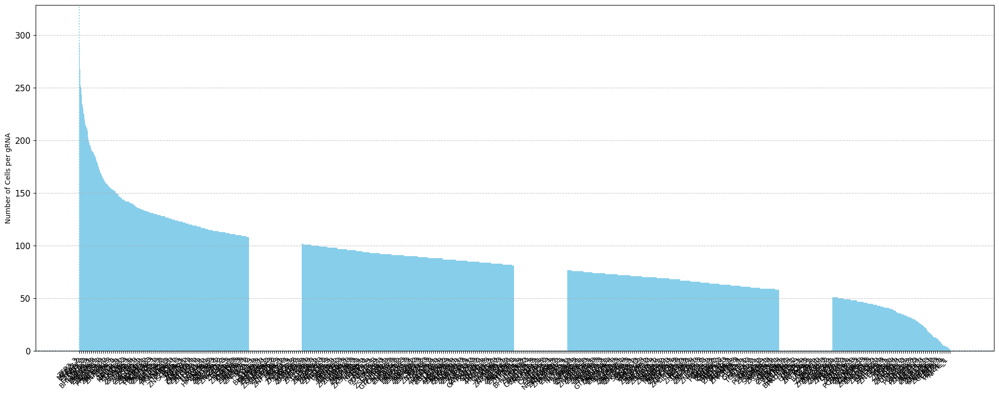

Before filter: 3704,perturbed
True     293201
False     14108
Name: count, dtype: int64
Removing 0 perturbing sgRNA for not having more than 0 cells
After filter: 3704,perturbed
True     293201
False     14108
Name: count, dtype: int64


In [6]:
knockdown_adata_alpha = qc2.knockdown_qc_min_cells_per_gRNA(
    adata_alpha, 'gene_target_ensembl_id', 'gene_ids', min_cells_per_gRNA=0).copy()

In [7]:
alpha_tf_kos = knockdown_adata_alpha.obs['gene_target'].tolist()
alpha_tf_kos = set(alpha_tf_kos)
print(f"Number of ALPHA TF KOs: {len(alpha_tf_kos) - 1}") # Subtract 1 for NTC

Number of ALPHA TF KOs: 1395


Batch BETA

In [7]:
adata_beta_full = ad.read_h5ad("/home/ranwyl/data_tf_project/Aggregate_BETA.h5ad")
adata_beta_full

AnnData object with n_obs × n_vars = 962118 × 37567
    obs: 'gRNA', 'n_gRNA', 'n_gRNA_UMIs', 'gene_target', 'celltype', 'perturbation_type', 'n_UMI_counts', 'n_genes', 'perturbed', 'channel', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'run', 'gene_target_ensembl_id'
    var: 'gene_ids', 'feature_types', 'n_UMI_counts', 'n_cells', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    layers: 'counts'

In [8]:
adata_beta = filter_tf_ko_and_ntc(adata_beta_full)
adata_beta

AnnData object with n_obs × n_vars = 16268 × 37567
    obs: 'gRNA', 'n_gRNA', 'n_gRNA_UMIs', 'gene_target', 'celltype', 'perturbation_type', 'n_UMI_counts', 'n_genes', 'perturbed', 'channel', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'run', 'gene_target_ensembl_id'
    var: 'gene_ids', 'feature_types', 'n_UMI_counts', 'n_cells', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    layers: 'counts'

In [9]:
del adata_beta_full
gc.collect()

519965

In [21]:
beta_tf_kos = adata_beta.obs['gene_target'].tolist()
beta_tf_kos = set(beta_tf_kos)
print(f"Number of BETA TF KOs (before filtering): {len(beta_tf_kos) - 1}") # Subtract 1 for NTC
print(beta_tf_kos)

Number of BETA TF KOs (before filtering): 13
{'MTERF4', 'PURB', 'NAIF1', 'TRAFD1', 'SNAPC5', 'RBCK1', 'ZBED5', 'PIN1', 'AKAP8L', 'MSANTD4', 'CCDC17', 'ZBED6', 'NTC', 'DZIP1'}


In [11]:
knockdown_adata_beta = qc2.knockdown_qc_min_cells_per_gRNA(
    adata_beta, 'gene_target_ensembl_id', 'gene_ids', min_cells_per_gRNA=0).copy()

normalizing counts per cell
    finished (0:00:00)


IndexError: index 26566 is out of bounds for axis 0 with size 16268

Batch GAMMA

In [4]:
adata_gamma_full = ad.read_h5ad("/home/ranwyl/data_tf_project/Aggregate_GAMMA.h5ad")
adata_gamma_full

AnnData object with n_obs × n_vars = 688287 × 37567
    obs: 'gRNA', 'n_gRNA', 'n_gRNA_UMIs', 'gene_target', 'celltype', 'perturbation_type', 'n_UMI_counts', 'n_genes', 'perturbed', 'channel', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'run', 'gene_target_ensembl_id'
    var: 'gene_ids', 'feature_types', 'n_UMI_counts', 'n_cells', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    layers: 'counts'

In [5]:
adata_gamma = filter_tf_ko_and_ntc(adata_gamma_full)
adata_gamma

AnnData object with n_obs × n_vars = 11026 × 37567
    obs: 'gRNA', 'n_gRNA', 'n_gRNA_UMIs', 'gene_target', 'celltype', 'perturbation_type', 'n_UMI_counts', 'n_genes', 'perturbed', 'channel', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'run', 'gene_target_ensembl_id'
    var: 'gene_ids', 'feature_types', 'n_UMI_counts', 'n_cells', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    layers: 'counts'

In [6]:
gamma_tf_kos = adata_gamma.obs['gene_target'].tolist()
gamma_tf_kos = set(gamma_tf_kos)
print(f"Number of GAMMA TF KOs (before filtering): {len(gamma_tf_kos) - 1}") # Subtract 1 for NTC
print(gamma_tf_kos)

Number of GAMMA TF KOs (before filtering): 8
{'ZBED6', 'NTC', 'THYN1', 'PRR12', 'RBSN', 'SGSM2', 'FAM200B', 'MSANTD3', 'MTERF2'}


In [7]:
knockdown_adata_gamma = qc2.knockdown_qc_min_cells_per_gRNA(
    adata_gamma, 'gene_target_ensembl_id', 'gene_ids', min_cells_per_gRNA=0).copy()

normalizing counts per cell
    finished (0:00:00)


IndexError: index 21742 is out of bounds for axis 0 with size 11026

QC code doesn't work for batch BETA and GAMMA when filtered to only TF KO and NTC cells. Batch ALPHA has 1395 TF KOs, while batch BETA has 13 and batch GAMMA has 8. To save time, look at just batch ALPHA for the rest of this analysis.

In [8]:
median_NTC = np.median(list(qc2._get_ntc_view(knockdown_adata_alpha).obs.n_UMI_counts))
print(median_NTC)

4741.5


In [9]:
sc.pp.normalize_total(knockdown_adata_alpha,target_sum=median_NTC)
sc.pp.log1p(knockdown_adata_alpha)
sc.pp.scale(knockdown_adata_alpha)

normalizing counts per cell
    finished (0:00:03)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


**Step F**

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:04)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PC1', 'PC2', ..., the loadings (adata.var)
    'pca_variance', the variance / eigenvalues (adata.uns)
    'pca_variance_ratio', the variance ratio (adata.uns)
computing neighbors
    computing neighbors
    using 'X_pca' with n_pcs = 50
    computed neighbors (0:00:16)
    computed connectivities (0:00:06)
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:23)


Computing null distribution:   0%|          | 0/10000 [00:00<?, ?it/s]

Computing group distances:   0%|          | 0/3377 [00:00<?, ?it/s]

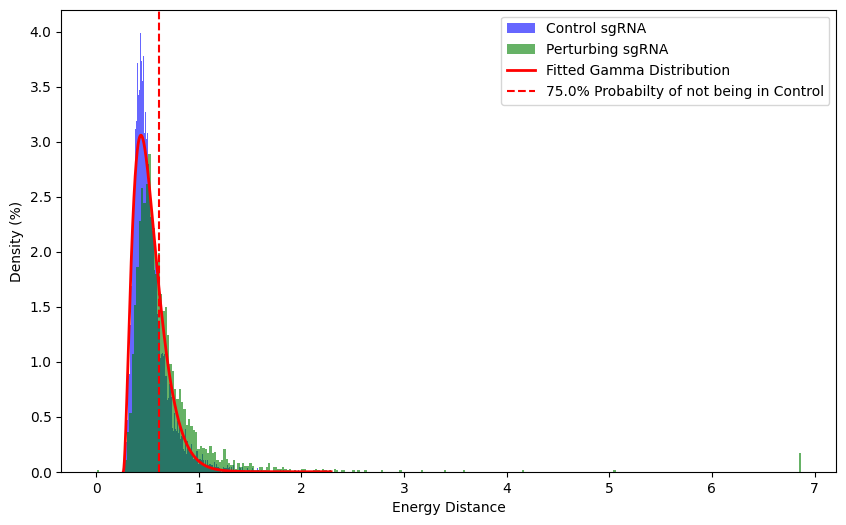

1406/3377 Perturbing sgRNA cross threshold of 0.75


In [10]:
alpha_filtered, alpha_null_distances, alpha_results = qc2.filter_sgRNA_min_cells_per_gRNA(knockdown_adata_alpha)

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)
normalizing counts per cell
    finished (0:00:04)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:22)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PC1', 'PC2', ..., the loadings (adata.var)
    'pca_variance', the variance / eigenvalues (adata.uns)
    'pca_variance_ratio', the variance ratio (adata.uns)


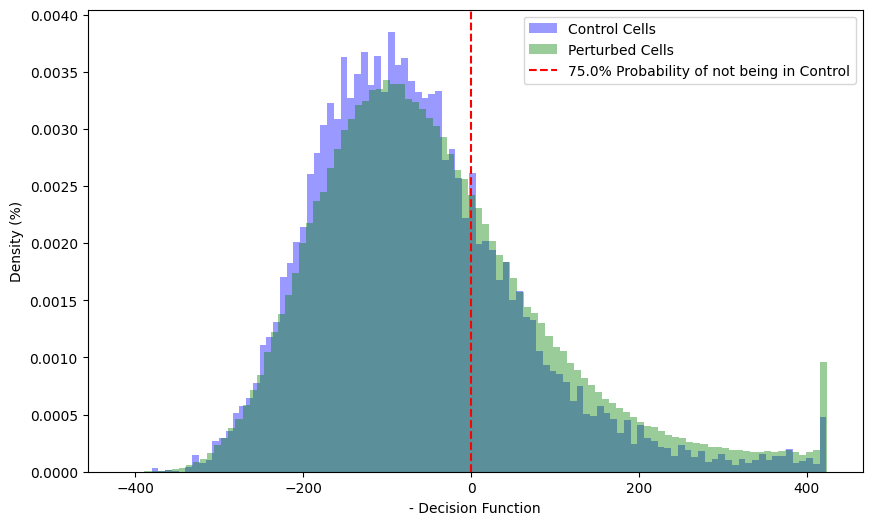

128312/420120 Perturbed Cells cross threshold of 0.75


In [37]:
adata_alpha_filtered, c, p = qc2.remove_unperturbed_cells(adata_alpha, threshold=0.75)

**Plot cells per TF KO**
(Skipping DE analysis and batch correction)

Filter TF KO cells

In [38]:
print(f"number of cells before filtering TF KO cells: {adata_alpha_filtered.obs.shape[0]}")
alpha_no_sgRNA_min = adata_alpha_filtered[adata_alpha_filtered.obs["gene_target"].isin(tfs)].copy()
print(f"number of cells after filtering TF KO cells: {alpha_no_sgRNA_min.obs.shape[0]}")

number of cells before filtering TF KO cells: 142420
number of cells after filtering TF KO cells: 128312


In [39]:
alpha_no_sgRNA_min

AnnData object with n_obs × n_vars = 128312 × 37567
    obs: 'gRNA', 'n_gRNA', 'n_gRNA_UMIs', 'gene_target', 'celltype', 'perturbation_type', 'n_UMI_counts', 'n_genes', 'perturbed', 'channel', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'run', 'gene_target_ensembl_id', 'gene_target_expression (CPM)', 'NTC_target_gene_expression (CPM)', 'target_knockdown', 'target_knockdown_z_score', 'anomaly_score'
    var: 'gene_ids', 'feature_types', 'n_UMI_counts', 'n_cells', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm', 'mean', 'std'
    uns: 'hvg', 'log1p',

In [40]:
unique_tfs_no_sgRNA_min = alpha_no_sgRNA_min.obs["gene_target"].unique().tolist()
print(f"Number of unique TF KOs: {len(unique_tfs_no_sgRNA_min)}")

Number of unique TF KOs: 1592


In [ ]:
cells_per_tf_ko_no_sgRNA_min = alpha_no_sgRNA_min.obs['gene_target'].value_counts()

In [ ]:
print(cells_per_tf_ko_no_sgRNA_min[:5])

gene_target
DUX4        317
ARHGAP35    247
BHLHE23     229
ADNP2       226
ZFP41       221
Name: count, dtype: int64


Plot TF KO histogram

In [11]:
def plot_cells_per_tf_ko(cells_per_tf_ko_value_counts, bin_width=25, x_label=None, ymax=None,
                         xmin=None, xmax=None, title=None):
    ax = sns.histplot(cells_per_tf_ko_value_counts.values, binwidth=bin_width)
    if x_label == None:
        x_label = "Cells per TF KO"
    if xmin and xmax:
        ax.set_xlim(xmin, xmax)
    if ymax:
        ax.set_ylim(0, ymax)
    ax.set_xlabel(x_label, fontsize=13)
    ax.set_ylabel("Count", fontsize=13)
    ax.tick_params(axis='both', which='major', labelsize=12)
    ax.bar_label(ax.containers[0], fontsize=12, rotation=90, padding=5)
    if title:
        ax.set_title(title, fontsize=14)

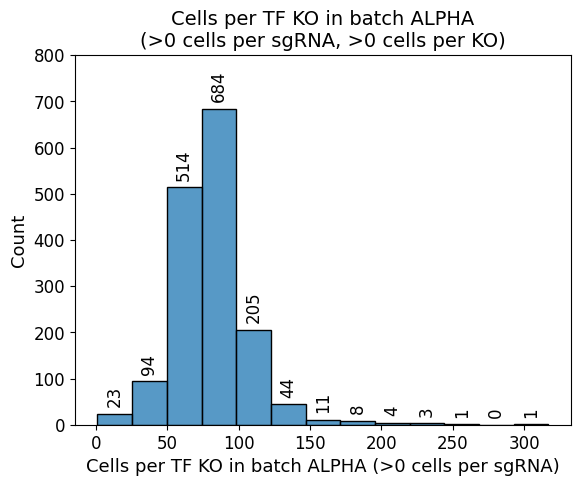

In [83]:
title_no_sgRNA_min = "Cells per TF KO in batch ALPHA\n(>0 cells per sgRNA, >0 cells per KO)"
plot_cells_per_tf_ko(cells_per_tf_ko_no_sgRNA_min, bin_width=25, ymax=800, 
                     xmin=0, xmax=350, title=title_no_sgRNA_min,
                     x_label="Cells per TF KO in batch ALPHA (>0 cells per sgRNA)")

## With >= 25 cells per sgRNA threshold, without >= cells per TF KO threshold

In [2]:
adata_alpha_step_f = ad.read_h5ad("/home/ranwyl/data_tf_project/Aggregate_ALPHA_sgRNA_Filtered.h5ad")

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)
normalizing counts per cell
    finished (0:00:02)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:19)
    and added
    'X_pca', the PCA coordinates (adata.obs)
    'PC1', 'PC2', ..., the loadings (adata.var)
    'pca_variance', the variance / eigenvalues (adata.uns)
    'pca_variance_ratio', the variance ratio (adata.uns)


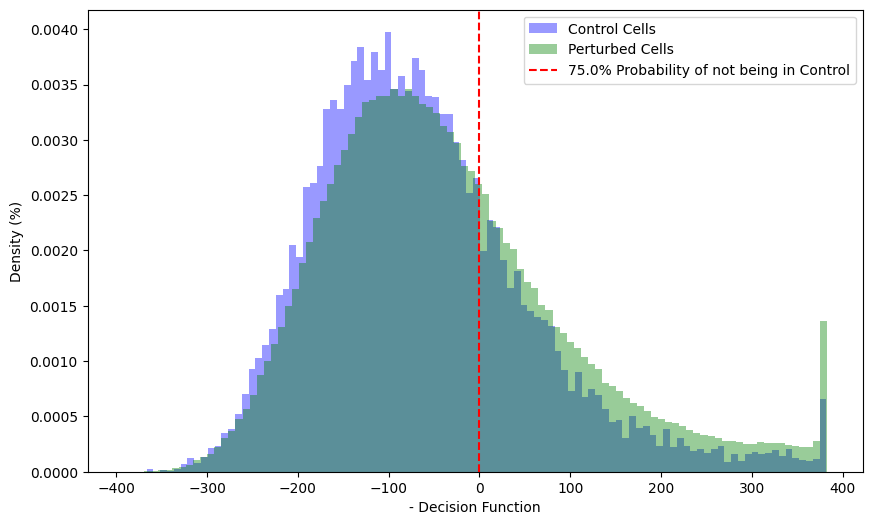

83533/258747 Perturbed Cells cross threshold of 0.75


In [3]:
adata_alpha_step_f_filtered, c, p = qc2.remove_unperturbed_cells(adata_alpha_step_f, threshold=0.75)

In [4]:
adata_alpha_step_f_filtered

AnnData object with n_obs × n_vars = 97641 × 37567
    obs: 'gRNA', 'n_gRNA', 'n_gRNA_UMIs', 'gene_target', 'celltype', 'perturbation_type', 'n_UMI_counts', 'n_genes', 'perturbed', 'channel', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'run', 'gene_target_ensembl_id', 'gene_target_expression (CPM)', 'NTC_target_gene_expression (CPM)', 'target_knockdown', 'target_knockdown_z_score', 'ed_category', 'anomaly_score'
    var: 'gene_ids', 'feature_types', 'n_UMI_counts', 'n_cells', 'mt', 'ribo', 'hb', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'mean', 'std', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: '

Filter TF KO cells

In [7]:
print(f"number of cells before filtering TF KO cells: {adata_alpha_step_f_filtered.obs.shape[0]}")
alpha_no_KO_min = adata_alpha_step_f_filtered[adata_alpha_step_f_filtered.obs["gene_target"].isin(tfs)].copy()
print(f"number of cells after filtering TF KO cells: {alpha_no_KO_min.obs.shape[0]}")

number of cells before filtering TF KO cells: 97641
number of cells after filtering TF KO cells: 36498


In [8]:
unique_tfs_no_KO_min = alpha_no_KO_min.obs["gene_target"].unique().tolist()
print(f"Number of unique TF KOs: {len(unique_tfs_no_KO_min)}")

Number of unique TF KOs: 929


In [76]:
cells_per_tf_ko_no_KO_min = pd.DataFrame(alpha_no_KO_min.obs['gene_target'].value_counts())

In [77]:
cells_per_tf_ko_no_KO_min.head()

,count
gene_target,
ZFP41,209
ARHGAP35,186
DNMT1,150
ZNF354A,139
BHLHE40,139


In [80]:
cells_per_tf_ko_no_KO_min[(cells_per_tf_ko_no_KO_min["count"] < 25) &
                          (cells_per_tf_ko_no_KO_min["count"] >= 20)].sum()

count    2784
dtype: int64

In [81]:
cells_per_tf_ko_no_KO_min[(cells_per_tf_ko_no_KO_min["count"] < 20) &
                          (cells_per_tf_ko_no_KO_min["count"] >= 15)].sum()

count    1629
dtype: int64

In [82]:
cells_per_tf_ko_no_KO_min[(cells_per_tf_ko_no_KO_min["count"] < 15) &
                          (cells_per_tf_ko_no_KO_min["count"] >= 10)].sum()

count    729
dtype: int64

In [83]:
cells_per_tf_ko_no_KO_min[(cells_per_tf_ko_no_KO_min["count"] < 10) &
                          (cells_per_tf_ko_no_KO_min["count"] >= 5)].sum()

count    37
dtype: int64

In [70]:
# Function to plot cells per TF KO histogram
def plot_cells_per_tf_ko2(cells_per_tf_ko_value_counts, bin_width=25, bin_range=(0,250), 
                          x_label=None, ymax=None, title=None):
    ax = sns.histplot(cells_per_tf_ko_value_counts.values, binwidth=bin_width,
                      binrange=bin_range)
    if x_label == None:
        x_label = "Cells per TF KO"
    if ymax:
        ax.set_ylim(0, ymax)
    ax.set_xlabel(x_label, fontsize=13)
    ax.set_ylabel("Count", fontsize=13)
    ax.set_xticks([i*25 for i in range(11)])
    ax.tick_params(axis='both', which='major', labelsize=12)
    ax.bar_label(ax.containers[0], fontsize=12, rotation=90, padding=5)
    if title:
        ax.set_title(title, fontsize=14)
    return ax

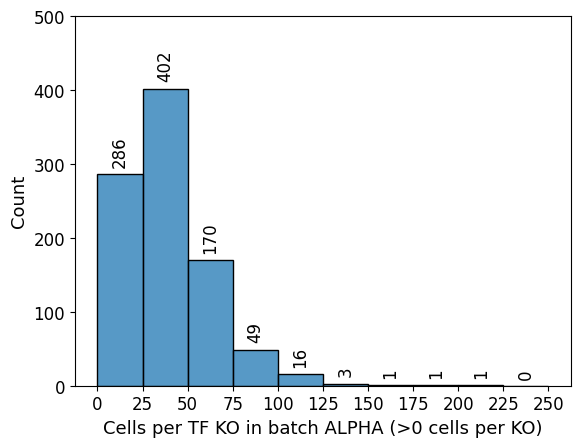

In [71]:
_ = plot_cells_per_tf_ko2(cells_per_tf_ko_no_KO_min, ymax=500, bin_width=25,
                     x_label="Cells per TF KO in batch ALPHA (>0 cells per KO)")

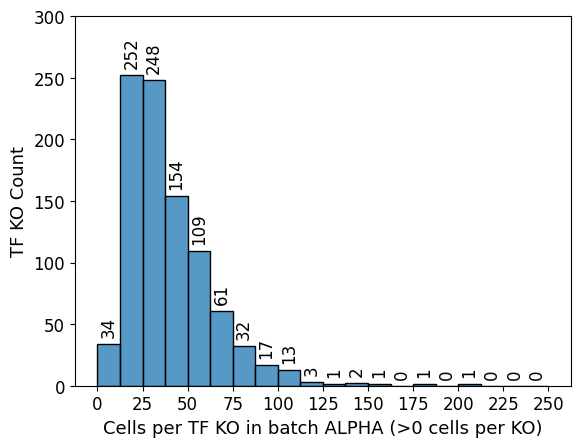

In [65]:
_ = plot_cells_per_tf_ko2(cells_per_tf_ko_no_KO_min, ymax=300, bin_width=12.5,
                     x_label="Cells per TF KO in batch ALPHA (>0 cells per KO)")

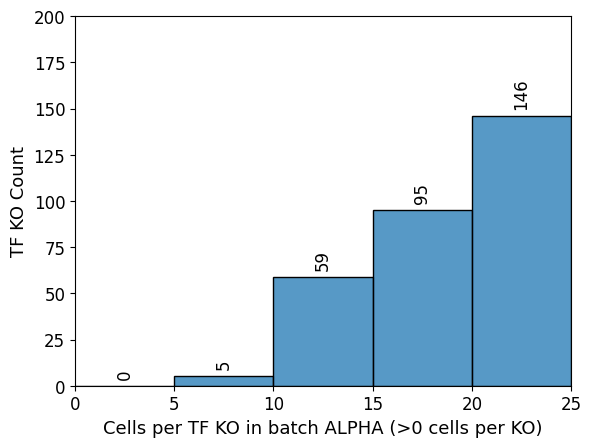

In [66]:
ax1 = plot_cells_per_tf_ko2(cells_per_tf_ko_no_KO_min, ymax=200, bin_width=5, bin_range=(0, 25),
                     x_label="Cells per TF KO in batch ALPHA (>0 cells per KO)")
ax1.set_xlim(0, 25)
_ = ax1.set_xticks([i*5 for i in range(6)])

## With >=25 cells per KO threshold

Plot same histogram for dataset with minimum 25 cells per TF KO

In [29]:
adata_tfs = ad.read_h5ad("/home/ranwyl/data_tf_project/Final_Aggregate_TF_KO_Batch_Normalized.h5ad")
adata_tfs_alpha = adata_tfs[adata_tfs.obs.run == "ALPHA"].copy()

In [30]:
adata_tfs_alpha

AnnData object with n_obs × n_vars = 31321 × 13792
    obs: 'gRNA', 'n_gRNA', 'n_gRNA_UMIs', 'gene_target', 'celltype', 'perturbation_type', 'n_UMI_counts', 'n_genes', 'perturbed', 'channel', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'run', 'gene_target_ensembl_id', 'gene_target_expression (CPM)', 'NTC_target_gene_expression (CPM)', 'target_knockdown', 'target_knockdown_z_score', 'ed_category', 'anomaly_score'
    obsm: 'X_pca'
    layers: 'counts', 'normalized_counts', 'pre_z_normalization'

In [36]:
unique_tfs_min_25 = adata_tfs_alpha.obs["gene_target"].unique().tolist()
print(f"Number of unique TF KOs: {len(unique_tfs_min_25)}")

Number of unique TF KOs: 643


In [31]:
cells_per_tf_ko_min_25 = adata_tfs_alpha.obs['gene_target'].value_counts()

In [32]:
print(cells_per_tf_ko_min_25[:5])

gene_target
ZFP41       209
ARHGAP35    186
DNMT1       150
ZNF354A     139
BHLHE40     139
Name: count, dtype: int64


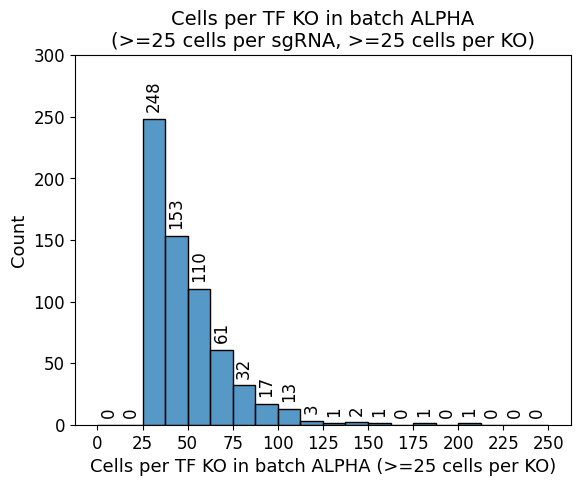

In [53]:
title_with_min = "Cells per TF KO in batch ALPHA\n(>=25 cells per sgRNA, >=25 cells per KO)"
plot_cells_per_tf_ko2(cells_per_tf_ko_min_25, bin_width=12.5, ymax=300, 
                     title=title_with_min,
                     x_label="Cells per TF KO in batch ALPHA (>=25 cells per KO)")